In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import plotly.graph_objects as go
import seaborn as sns
import h5py
from collections import Counter
import scipy.sparse as sp
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patheffects as path_effects
from matplotlib_venn import venn3
# import pyranges as pr
import yaml
import time
from itertools import combinations
import gget
# import gseapy as gp
from scipy import sparse

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc

# import scvi
# from scvi.external import SysVI

import cupy as cp
import cudf
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

from cuml.manifold.umap import simplicial_set_embedding
from scanpy.tools._utils import get_init_pos_from_paga 
from cuml.manifold.umap import find_ab_params

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

sc.settings.verbosity = 3

# Load gene resources

In [2]:
%%time 
# === Load and filter GTF ===
gpath = "/scratch/indikar_root/indikar1/shared_data/HYB/resources/refdata-gex-GRCh38-2024-A_genes.csv.gz"

gtf = pd.read_csv(gpath)

exons = gtf[gtf['Feature'] == 'exon']
print(f"{exons.shape=}")
exons.head()

exons.shape=(1586950, 27)
CPU times: user 7.97 s, sys: 1.31 s, total: 9.28 s
Wall time: 9.59 s


,Chromosome,Source,Feature,Start,End,Score,Strand,Frame,gene_id,gene_version,...,transcript_name,transcript_support_level,havana_transcript,exon_number,exon_id,exon_version,hgnc_id,havana_gene,protein_id,ccdsid
2,GL000009.2,ENSEMBL,exon,56139,58376,.,-,.,ENSG00000278704,1,...,ENST00000618686,NaN,NaN,1.0,ENSE00003753029,1.0,NaN,NaN,ENSP00000484918.1,NaN
10,GL000194.1,ENSEMBL,exon,114985,115018,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,1.0,ENSE00002299440,2.0,NaN,NaN,ENSP00000483280.1,NaN
11,GL000194.1,ENSEMBL,exon,112791,112850,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,2.0,ENSE00003739295,1.0,NaN,NaN,ENSP00000483280.1,NaN
12,GL000194.1,ENSEMBL,exon,53589,55676,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,3.0,ENSE00003723764,1.0,NaN,NaN,ENSP00000483280.1,NaN
22,GL000194.1,ENSEMBL,exon,114985,115055,.,-,.,ENSG00000274847,1,...,MAFIP-201,1.0,NaN,1.0,ENSE00003736481,1.0,HGNC:31102,NaN,ENSP00000478910.1,NaN


In [3]:
fpath = "../../resources/isoform_map.csv.gz"

idf = pd.read_csv(fpath)
print(f"{idf.shape=}")

idf['uniprot'] = np.where(idf['UniProtKB/TrEMBL ID'].isna(), idf['UniProtKB/Swiss-Prot ID'], idf['UniProtKB/TrEMBL ID'])

transcript_2_uniprot = dict(zip(idf['Transcript name'].values, idf['uniprot'].values))

idf.head()

idf.shape=(110149, 11)


,Gene stable ID,Gene stable ID version,Transcript stable ID,Transcript stable ID version,Protein stable ID,Protein stable ID version,Transcript length (including UTRs and CDS),Transcript name,Gene name,UniProtKB/Swiss-Prot ID,UniProtKB/TrEMBL ID,uniprot
0,ENSG00000198888,ENSG00000198888.2,ENST00000361390,ENST00000361390.2,ENSP00000354687,ENSP00000354687.2,956,MT-ND1-201,MT-ND1,P03886,U5Z754,U5Z754
1,ENSG00000198763,ENSG00000198763.3,ENST00000361453,ENST00000361453.3,ENSP00000355046,ENSP00000355046.4,1042,MT-ND2-201,MT-ND2,P03891,Q7GXY9,Q7GXY9
2,ENSG00000198804,ENSG00000198804.2,ENST00000361624,ENST00000361624.2,ENSP00000354499,ENSP00000354499.2,1542,MT-CO1-201,MT-CO1,P00395,U5YWV7,U5YWV7
3,ENSG00000198712,ENSG00000198712.1,ENST00000361739,ENST00000361739.1,ENSP00000354876,ENSP00000354876.1,684,MT-CO2-201,MT-CO2,P00403,U5Z487,U5Z487
4,ENSG00000228253,ENSG00000228253.1,ENST00000361851,ENST00000361851.1,ENSP00000355265,ENSP00000355265.1,207,MT-ATP8-201,MT-ATP8,P03928,U5YV54,U5YV54


In [4]:
fpath = "../../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
tf_list[:10]

['ZNF354C',
 'KLF12',
 'ZNF143',
 'ZIC2',
 'ZNF274',
 'SP2',
 'ZBTB7A',
 'BCL6B',
 'ZBTB49',
 'ZIC1']

# Load gene data

In [5]:
%%time

path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_merged_gene_data.h5ad"
gdata = sc.read_h5ad(path)
gdata

CPU times: user 232 ms, sys: 1.59 s, total: 1.82 s
Wall time: 4.92 s


AnnData object with n_obs × n_vars = 16367 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'leiden', 'cluster_str', 'S_score', 'G2M_score', 'phase'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_varia

# Load isoform data

In [6]:
%%time

path = "/scratch/indikar_root/indikar1/shared_data/HYB/anndata/isoforms.h5ad"
adata = sc.read_h5ad(path)
adata.var.set_index('transcript_name', inplace=True)
print(adata)
adata.var.head()

AnnData object with n_obs × n_vars = 19858 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'
CPU times: user 225 ms, sys: 256 ms, total: 481 ms
Wall time: 6.23 s


,gene_id,gene_name,gene_type,transcript_type,Chromosome,Start,End,transcript_id,UniProtKB
transcript_name,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,protein_coding,chr7,127588410,127591700,ENST00000000233,P84085
M6PR-201,ENSG00000003056,M6PR,protein_coding,protein_coding,chr12,8940360,8949645,ENST00000000412,P20645
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,protein_coding,chr11,64305523,64316743,ENST00000000442,P11474
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,protein_coding,chr12,2794969,2805423,ENST00000001008,Q02790
CYP26B1-201,ENSG00000003137,CYP26B1,protein_coding,protein_coding,chr2,72129237,72147862,ENST00000001146,Q9NR63


In [7]:
%%time

print(f"Initial number of cells in adata: {adata.n_obs}")
print(f"Number of cells in gdata: {gdata.n_obs}")

# Subset adata to those present in bdata
cells_to_keep = adata.obs_names.isin(gdata.obs_names)
print(f"Number of cells in adata after filtering by gdata: {cells_to_keep.sum()}")

adata = adata[cells_to_keep, :].copy()
print(f"Final number of cells in adata: {adata.n_obs}")

# Sort adata and bdata to the same order (shared cells only)
shared_cells = gdata.obs_names.intersection(adata.obs_names)
print(f"Number of shared cells: {len(shared_cells)}")

# Sort both AnnData objects
adata = adata[shared_cells, :].copy()
gdata_sorted = gdata[shared_cells, :].copy()

# Assert same order
assert all(adata.obs_names == gdata_sorted.obs_names), "Cell ordering does not match!"
print("Cell ordering is identical between adata and bdata (shared cells).")
adata

Initial number of cells in adata: 19858
Number of cells in gdata: 16367
Number of cells in adata after filtering by gdata: 16367
Final number of cells in adata: 16367
Number of shared cells: 16367
Cell ordering is identical between adata and bdata (shared cells).
CPU times: user 933 ms, sys: 2.05 s, total: 2.98 s
Wall time: 3.01 s


AnnData object with n_obs × n_vars = 16367 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'

Before merge: adata.obs columns = ['dataset', 'n_reads', 'n_transcripts']
After merge: adata.obs columns = ['dataset', 'n_reads', 'n_transcripts', 'cluster_str', 'pooled_condition', 'phase']
AnnData object with n_obs × n_vars = 16367 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts', 'cluster_str', 'pooled_condition', 'phase'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'
    uns: 'cluster_str_colors', 'dataset_colors', 'pooled_condition_colors', 'umap'
    obsm: 'X_umap'


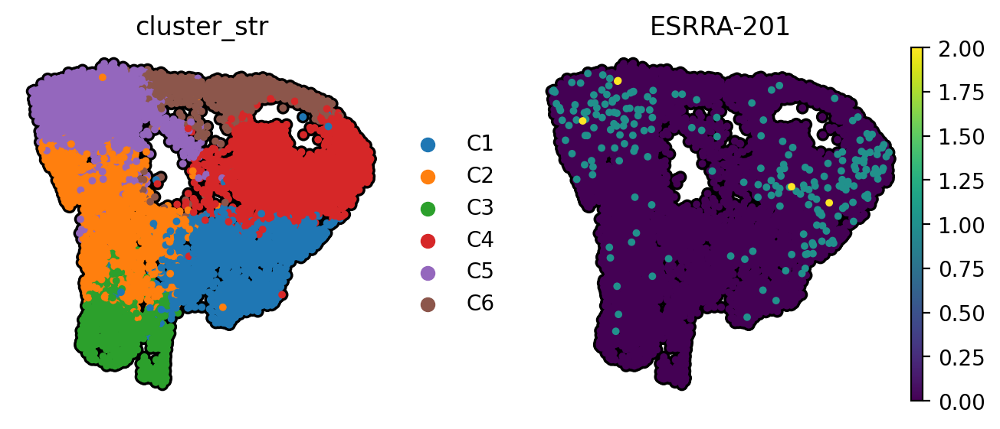

CPU times: user 843 ms, sys: 44.7 ms, total: 887 ms
Wall time: 921 ms


In [8]:
%%time

obs_columns = [
    'cluster_str',
    'pooled_condition',
    'phase',
]

print(f"Before merge: adata.obs columns = {list(adata.obs.columns)}")

# Subset bdata.obs to the needed columns
df_merge = gdata.obs[obs_columns].copy()
df_merge.index.name = "cell"

# Merge by index (obs_names)
adata.obs = adata.obs.merge(df_merge, left_index=True, right_index=True, suffixes=('', '_gdata'))

print(f"After merge: adata.obs columns = {list(adata.obs.columns)}")

# Add uns
adata.uns['cluster_str_colors'] = gdata.uns['cluster_str_colors'].copy()
adata.uns['dataset_colors'] = gdata.uns['dataset_colors'].copy()
adata.uns['pooled_condition_colors'] = gdata.uns['pooled_condition_colors'].copy()

# Merge embeddings
adata.obsm['X_umap'] = gdata.obsm['X_umap'].copy()
adata.uns['umap'] = gdata.uns['umap'].copy()

print(adata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    ncols=2,
    sort_order=True,
    color=['cluster_str', 'ESRRA-201'],
    size=50,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
)

In [9]:
sc.pp.filter_genes(adata, min_counts=30)

adata.layers['counts'] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.layers['log_norm'] = adata.X.copy()
adata

filtered out 38328 genes that are detected in less than 30 counts
normalizing counts per cell
    finished (0:00:02)


AnnData object with n_obs × n_vars = 16367 × 51242
    obs: 'dataset', 'n_reads', 'n_transcripts', 'cluster_str', 'pooled_condition', 'phase'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB', 'n_counts'
    uns: 'cluster_str_colors', 'dataset_colors', 'pooled_condition_colors', 'umap', 'log1p'
    obsm: 'X_umap'
    layers: 'counts', 'log_norm'

In [12]:
adata.obs.head()

,dataset,n_reads,n_transcripts,cluster_str,pooled_condition,phase
AAACCAAAGCAACTGC_hybrid,Hybrid,10383,3090,C1,siPRRX1/mmMYOD1,G2M
AAACCAAAGTAGGGCA_hybrid,Hybrid,5458,2211,C1,mmMYOD1,G2M
AAACCAAAGTCTAGGC_hybrid,Hybrid,15520,4099,C2,siPRRX1/mmMYOD1,G1
AAACCATTCACGTAAT_hybrid,Hybrid,5523,2053,C4,siPRRX1,G2M
AAACCATTCAGGCAGA_hybrid,Hybrid,11290,2922,C4,siPRRX1,G2M


# Isoform table

In [10]:
%%time 
adata.X = adata.layers['log_norm'].copy()
rsc.get.anndata_to_GPU(adata)
print(f"{type(adata.X)=}")

aggdata = rsc.get.aggregate(
    adata, 
    by='pooled_condition',
    func='sum',
    axis=0,
)

rsc.get.anndata_to_CPU(aggdata, convert_all=True,)
df = aggdata.to_df(layer='sum')
df = df.T
df['total_transcript'] = df.sum(axis=1)

df = pd.merge(
    df, adata.var[['gene_name', 'gene_type', 'transcript_type']],#, 'transcript_name']],
    how='left',
    left_index=True,
    right_index=True,
)
df = df.reset_index(names='transcript_name')
df = df.sort_values(by=['gene_name', 'transcript_name'])
df = df.reset_index(drop=True)
df['is_tf'] = df['gene_name'].isin(tf_list)
df['uniprot'] = df['transcript_name'].map(transcript_2_uniprot)
print(f"{df.shape=}")
df.head()

type(adata.X)=<class 'cupyx.scipy.sparse._csr.csr_matrix'>
df.shape=(51242, 11)
CPU times: user 217 ms, sys: 295 ms, total: 512 ms
Wall time: 556 ms


,transcript_name,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,total_transcript,gene_name,gene_type,transcript_type,is_tf,uniprot
0,A1BG-203,7.213413,6.881368,13.801695,11.572470,39.468946,A1BG,protein_coding,protein_coding_CDS_not_defined,False,NaN
1,A1BG-204,3937.065300,822.441452,1804.198337,1193.743565,7757.448654,A1BG,protein_coding,retained_intron,False,NaN
2,A1BG-AS1-202,28.070058,5.255540,17.319842,12.918548,63.563989,A1BG-AS1,lncRNA,lncRNA,False,NaN
3,A1BG-AS1-203,14.894550,2.053078,5.690746,9.162577,31.800952,A1BG-AS1,lncRNA,lncRNA,False,NaN
4,A1BG-AS1-204,74.317471,40.734562,47.579077,59.125329,221.756440,A1BG-AS1,lncRNA,lncRNA,False,NaN


# Add splicing events

In [11]:
fpath = "../../resources/AS_events.csv.gz"

asdf = pd.read_csv(fpath)
asdf = asdf[asdf['gene_name'].notna()]
asdf = asdf.drop(columns=['gene_id', 'transcript_id', 'gene_name'])
asdf.head()

df = pd.merge(
    df, asdf,
    how='left',
    on='transcript_name',
)
print(f"{df.shape=}")
print()

df.head()

df.shape=(51242, 19)



,transcript_name,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,total_transcript,gene_name,gene_type,transcript_type,is_tf,uniprot,A3,A5,AF,AL,MX,RI,SE,num_events
0,A1BG-203,7.213413,6.881368,13.801695,11.572470,39.468946,A1BG,protein_coding,protein_coding_CDS_not_defined,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,A1BG-204,3937.065300,822.441452,1804.198337,1193.743565,7757.448654,A1BG,protein_coding,retained_intron,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,A1BG-AS1-202,28.070058,5.255540,17.319842,12.918548,63.563989,A1BG-AS1,lncRNA,lncRNA,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,A1BG-AS1-203,14.894550,2.053078,5.690746,9.162577,31.800952,A1BG-AS1,lncRNA,lncRNA,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,A1BG-AS1-204,74.317471,40.734562,47.579077,59.125329,221.756440,A1BG-AS1,lncRNA,lncRNA,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Add metadata

In [12]:
%%time
pdf = df.copy()

# count the number of isoforms per gene
pdf['n_isoforms'] = pdf.groupby('gene_name')['transcript_name'].transform('nunique')
pdf['n_protiens'] = pdf.groupby('gene_name')['uniprot'].transform('nunique')


# clusters = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6']
clusters = ['Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1']

# add grouped expression counts
grouped = pdf.groupby('gene_name')[clusters].sum()
sum_columns  = [f'{col}_sum' for col in grouped.columns]
grouped.columns = sum_columns
pdf = pdf.merge(grouped, on='gene_name', how='left')

pdf['total_gene'] = pdf[sum_columns].sum(axis=1)

# add percentages
for col in clusters:
    sum_col = f'{col}_sum'
    pct_col = f'{col}_pct'
    pdf[pct_col] = pdf[col] / pdf[sum_col]

print(pdf[['gene_name', 'transcript_name', 'Control_pct', 'mmMYOD1_pct', 'siPRRX1_pct']].head().to_string())

  gene_name transcript_name  Control_pct  mmMYOD1_pct  siPRRX1_pct
0      A1BG        A1BG-203     0.001829     0.008298     0.007592
1      A1BG        A1BG-204     0.998171     0.991702     0.992408
2  A1BG-AS1    A1BG-AS1-202     0.163383     0.042073     0.090598
3  A1BG-AS1    A1BG-AS1-203     0.086694     0.016436     0.029768
4  A1BG-AS1    A1BG-AS1-204     0.432569     0.326097     0.248880
CPU times: user 55.8 ms, sys: 1.22 ms, total: 57 ms
Wall time: 63.6 ms


                   SE    A5    A3   MX   RI    AF    AL
group                                                  
Control          9416  3823  5145  689  612  4761  1289
mmMYOD1          9922  4004  5398  746  645  4994  1363
siPRRX1          9968  4020  5416  746  642  5020  1372
siPRRX1/mmMYOD1  9968  4019  5416  747  646  5023  1371


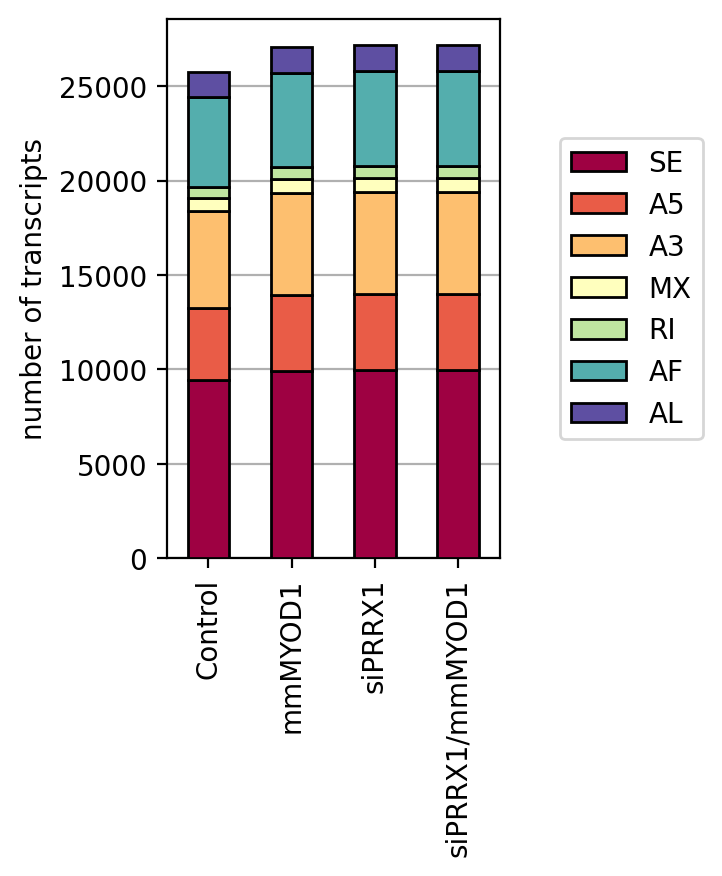

In [13]:
plot_df = pdf.copy()

columns = [
    'gene_name', 'transcript_name',
    'transcript_type', 'uniprot',
     'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
    'Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1',
]

plot_df = plot_df[columns]
plot_df = pd.melt(
    plot_df, id_vars=columns[:-4],
)

plot_df.head()

event_types = {
    'SE': 'skipping exon',
    'A5': "alternative 5' splice site",
    'A3': "alternative 3' splice site",
    'MX': 'mutually exclusive exon',
    'RI': 'retained intron',
    'AF': 'alternative first exon',
    'AL': 'alternative last exon',
}

results = []
for group_name, group in plot_df.groupby('variable'):
    group = group[group['transcript_type'] == 'protein_coding']
    group = group[group['uniprot'].notna()]

    row = {
        'group' : group_name,
    }

    for event_type, event_label in event_types.items():
        count = group[(group[event_type] == True) & (group['value'] > 0)]['transcript_name'].nunique()
        row[event_type] = count

    results.append(row)
    
results = pd.DataFrame(results)
results = results.set_index('group')
print(results.to_string())

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.15, 3.5
results.plot(
    kind='bar',
    stacked=True,
    ec='k',
    zorder=10,
    cmap='Spectral'
)

plt.grid(axis='y', zorder=0)
plt.xlabel("")
plt.ylabel("number of transcripts")
sns.move_legend(
    plt.gca(),
    loc='center right',
    title='',
    bbox_to_anchor=(1.65, 0.5)
)

[Text(0, 0.5, '0.0'),
 Text(0, 0.6000000000000001, '0.6'),
 Text(0, 0.7000000000000001, '0.7'),
 Text(0, 0.8, '0.8'),
 Text(0, 0.9, '0.9'),
 Text(0, 1.0, '1.0'),
 Text(0, 1.1, '1.1')]

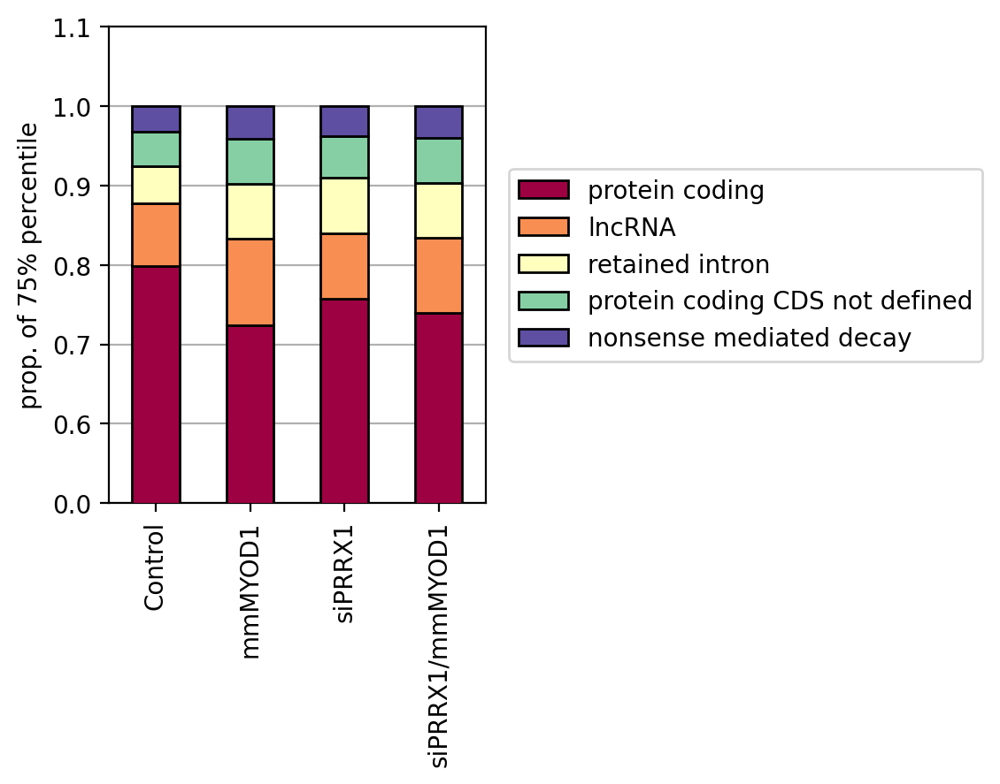

In [14]:
p = 0.75
cols = ['Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1']

keep = [
    'retained_intron',
    'protein_coding_CDS_not_defined',
    'lncRNA',
    'protein_coding',
    'nonsense_mediated_decay',
    # 'protein_coding_LoF',
]

proportions = {}
for col in cols:
    thresh = pdf[col].quantile(p)
    mask   = (pdf[col] > thresh) & pdf['transcript_type'].isin(keep)
    cnts   = pdf.loc[mask, 'transcript_type'].value_counts(normalize=True)
    cnts.index = cnts.index.str.replace("_", " ")
    proportions[col] = cnts

result = pd.DataFrame(proportions).fillna(0)

# pick the order you want – here, descending in “initial”
order = result['Control'].sort_values(ascending=False).index

# reindex so the stacks plot in that order
result = result.loc[order]
result = result.loc[(result != 0).any(axis=1)]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.75, 3.5
result.T.plot(
    kind='bar',
    stacked=True,
    ec='k',
    zorder=10,
    cmap='Spectral',
)

plt.grid(axis='y', zorder=0)
sns.move_legend(
    plt.gca(),
    loc='center right',
    title='',
    bbox_to_anchor=(2.35, 0.5)
)
plt.ylabel(f'prop. of {int(p*100)}% percentile')
plt.ylim([0.5, 1.005])

ax = plt.gca()
yticks = ax.get_yticks()
yticklabels = [f"{round(t, 3)}" for t in yticks]
yticklabels[0] = 0.0    # set lowest label manually
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)

# Dominance

In [15]:
def get_top(df, col):
    # Remove groups with any NaN
    mask = df.groupby('gene_name', observed=True)[col].transform(lambda x: x.isna().any())
    df_valid = df[~mask]

    # Get index of max value per group
    top_idx = df_valid.groupby('gene_name', observed=True)[col].idxmax()
    counts = df_valid.groupby('gene_name', observed=True)[col].apply(lambda x: (x == x.max()).sum())

    # Build mapping and drop ties
    top_map = df_valid.loc[top_idx, ['gene_name', 'transcript_name']].set_index('gene_name')['transcript_name']
    top_map[counts > 1] = np.nan

    return df['gene_name'].map(top_map)

for col in ['Control_pct', 'mmMYOD1_pct', 'siPRRX1_pct', 'siPRRX1/mmMYOD1_pct']:
    pdf[f'{col}_top'] = get_top(pdf, col)

pdf.head()

,transcript_name,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,total_transcript,gene_name,gene_type,transcript_type,is_tf,...,siPRRX1/mmMYOD1_sum,total_gene,Control_pct,mmMYOD1_pct,siPRRX1_pct,siPRRX1/mmMYOD1_pct,Control_pct_top,mmMYOD1_pct_top,siPRRX1_pct_top,siPRRX1/mmMYOD1_pct_top
0,A1BG-203,7.213413,6.881368,13.801695,11.572470,39.468946,A1BG,protein_coding,protein_coding_CDS_not_defined,False,...,1205.316035,7796.917600,0.001829,0.008298,0.007592,0.009601,A1BG-204,A1BG-204,A1BG-204,A1BG-204
1,A1BG-204,3937.065300,822.441452,1804.198337,1193.743565,7757.448654,A1BG,protein_coding,retained_intron,False,...,1205.316035,7796.917600,0.998171,0.991702,0.992408,0.990399,A1BG-204,A1BG-204,A1BG-204,A1BG-204
2,A1BG-AS1-202,28.070058,5.255540,17.319842,12.918548,63.563989,A1BG-AS1,lncRNA,lncRNA,False,...,179.298587,667.192095,0.163383,0.042073,0.090598,0.072050,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209
3,A1BG-AS1-203,14.894550,2.053078,5.690746,9.162577,31.800952,A1BG-AS1,lncRNA,lncRNA,False,...,179.298587,667.192095,0.086694,0.016436,0.029768,0.051102,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209
4,A1BG-AS1-204,74.317471,40.734562,47.579077,59.125329,221.756440,A1BG-AS1,lncRNA,lncRNA,False,...,179.298587,667.192095,0.432569,0.326097,0.248880,0.329759,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209


In [33]:
plot_df = pdf.copy()
print(plot_df.columns)
print()

plot_df = plot_df[~plot_df['gene_name'].str.startswith("MT")]
plot_df = plot_df[~plot_df['gene_name'].str.startswith("RP")]

# Drop rows where all _top values are the same (excluding NaN-only rows)
top_cols = ['Control_pct_top', 'mmMYOD1_pct_top', 
            'siPRRX1_pct_top', 'siPRRX1/mmMYOD1_pct_top']

results = []

for column in top_cols:
    label = column.replace("_pct_top", "")
    other_columns = top_cols.copy()
    other_columns.remove(column)
    
    mask = (
        plot_df['transcript_name'] == plot_df[column]) &\
        (plot_df[other_columns].ne(plot_df[column], axis=0).all(axis=1)) &\
        (plot_df['transcript_type'] == 'protein_coding') &\
        (plot_df['uniprot'].notna()) &\
        (plot_df['is_tf']
        )
        
    
    dominant_iso = plot_df[mask].copy()
    tmp = pd.DataFrame(dominant_iso['gene_name'].unique(), columns=['gene_name'])
    tmp['group'] = label
    results.append(tmp)

results = pd.concat(results)
print(results['group'].value_counts())

results

Index(['transcript_name', 'Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1',
       'total_transcript', 'gene_name', 'gene_type', 'transcript_type',
       'is_tf', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
       'num_events', 'n_isoforms', 'n_protiens', 'Control_sum', 'mmMYOD1_sum',
       'siPRRX1_sum', 'siPRRX1/mmMYOD1_sum', 'total_gene', 'Control_pct',
       'mmMYOD1_pct', 'siPRRX1_pct', 'siPRRX1/mmMYOD1_pct', 'Control_pct_top',
       'mmMYOD1_pct_top', 'siPRRX1_pct_top', 'siPRRX1/mmMYOD1_pct_top'],
      dtype='object')

group
Control            257
mmMYOD1             23
siPRRX1             18
siPRRX1/mmMYOD1     16
Name: count, dtype: int64


,gene_name,group
0,ADNP,Control
1,ADNP2,Control
2,ARNT2,Control
3,ATF4,Control
4,BACH1,Control
...,...,...
11,ZNF302,siPRRX1/mmMYOD1
12,ZNF343,siPRRX1/mmMYOD1
13,ZNF419,siPRRX1/mmMYOD1
14,ZNF606,siPRRX1/mmMYOD1


In [34]:
tmp = results[results['group'] != 'Control']
tmp = tmp[~tmp['gene_name'].str.startswith('ZNF')]
print(", ".join(tmp['gene_name'].unique()))

BACH2, CBFA2T2, CREB3L4, CREM, FHL2, GIT2, MEF2D, MELK, MSRB3, POLI, RAB18, TCF3, FOXO3, GPANK1, ING4, LHX9, NCOA1, NFIX, NFX1, RFX1, SALL1, SP140, TRIM69, ZKSCAN1, ZSCAN32, AEBP2, CNOT3, GTF2IRD1, HDX, MEF2B, MEF2C, NR1H3, OSR2, SOX6, TCF7L2, TEAD2


Index(['transcript_name', 'Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1',
       'total_transcript', 'gene_name', 'gene_type', 'transcript_type',
       'is_tf', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
       'num_events', 'n_isoforms', 'n_protiens', 'Control_sum', 'mmMYOD1_sum',
       'siPRRX1_sum', 'siPRRX1/mmMYOD1_sum', 'total_gene', 'Control_pct',
       'mmMYOD1_pct', 'siPRRX1_pct', 'siPRRX1/mmMYOD1_pct', 'Control_pct_top',
       'mmMYOD1_pct_top', 'siPRRX1_pct_top', 'siPRRX1/mmMYOD1_pct_top'],
      dtype='object')

ABCC9


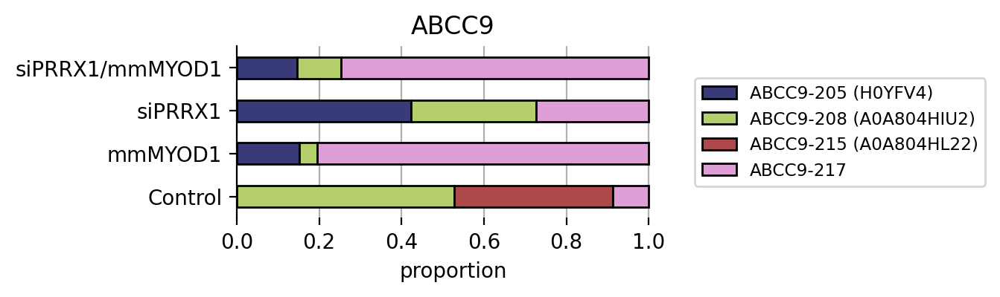

ACAD10


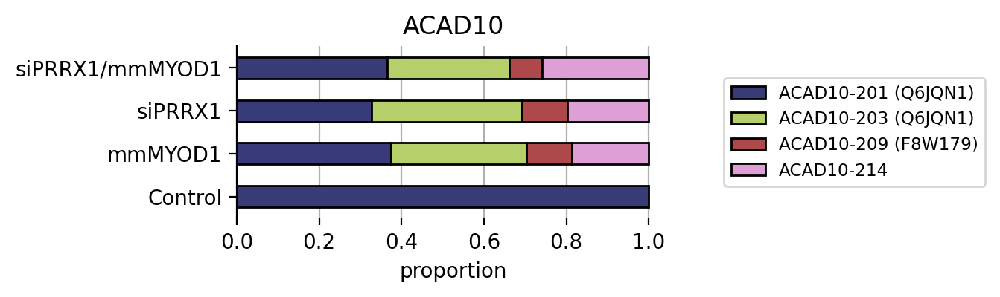

ACBD5


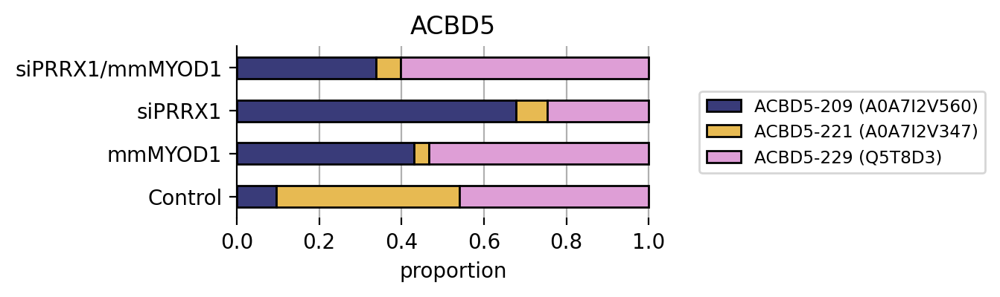

ADCY3


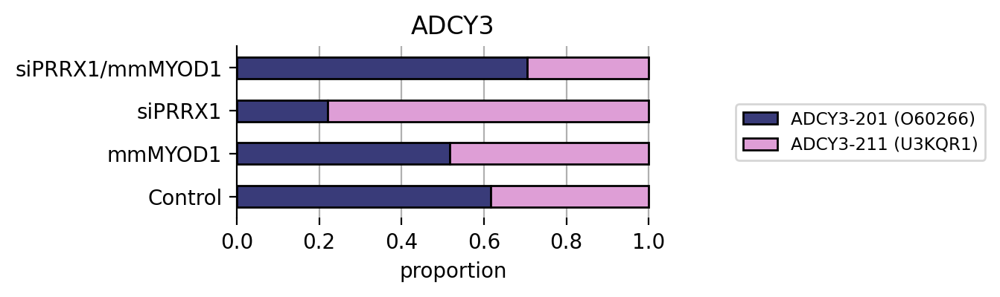

ADGRA2


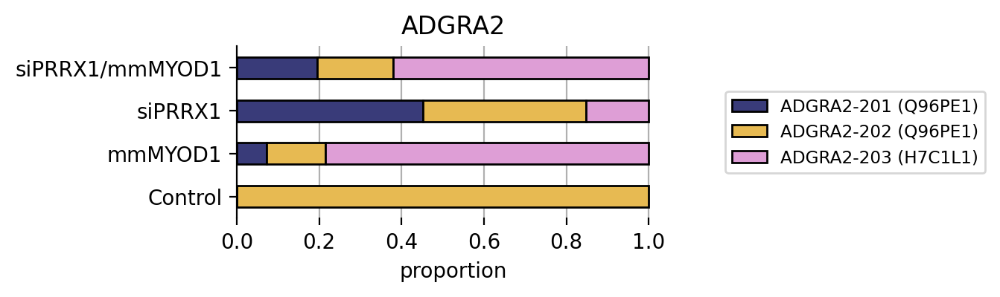

AFF1


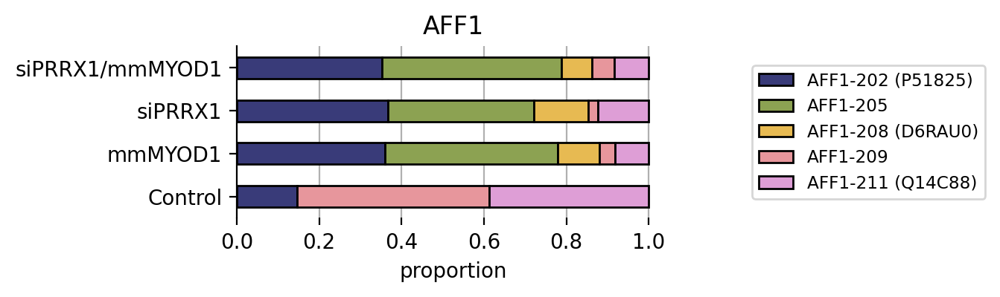

ANK1


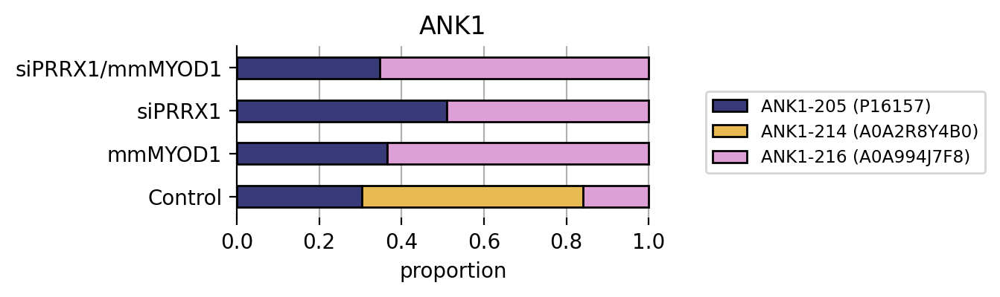

ANKRD23


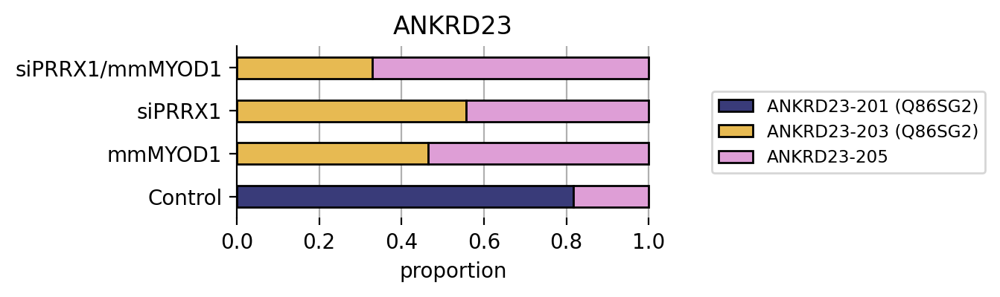

APOL1


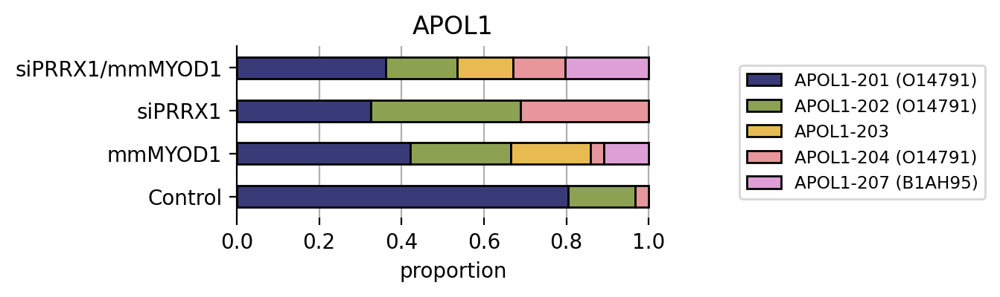

ATG7


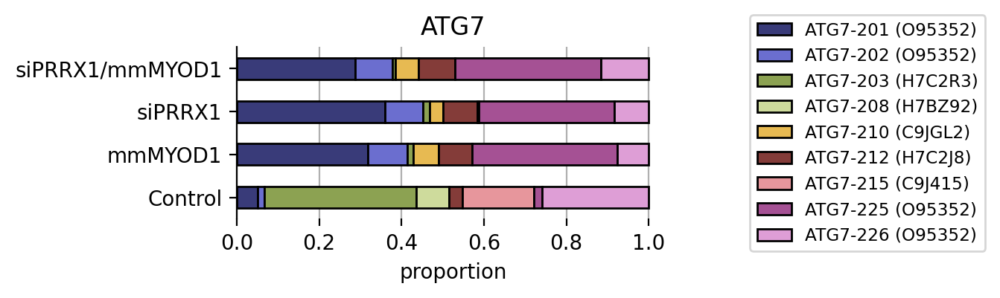

BMP4


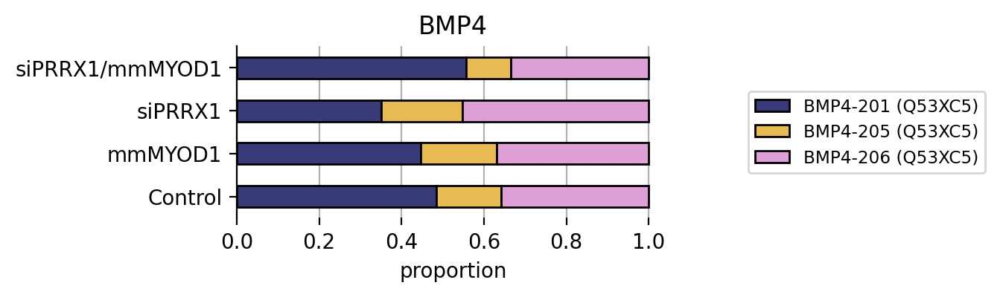

C16orf86


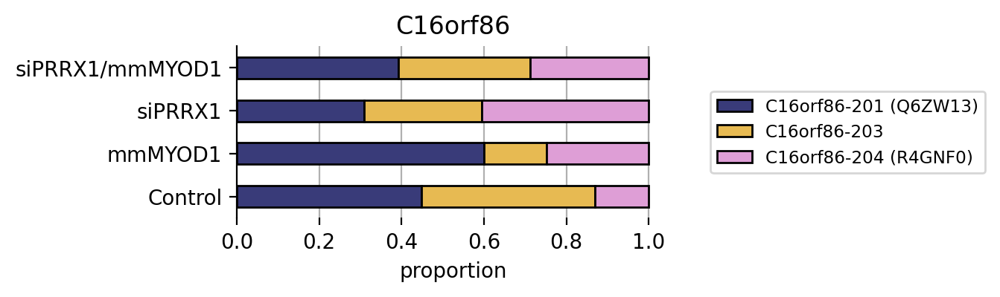

C17orf58


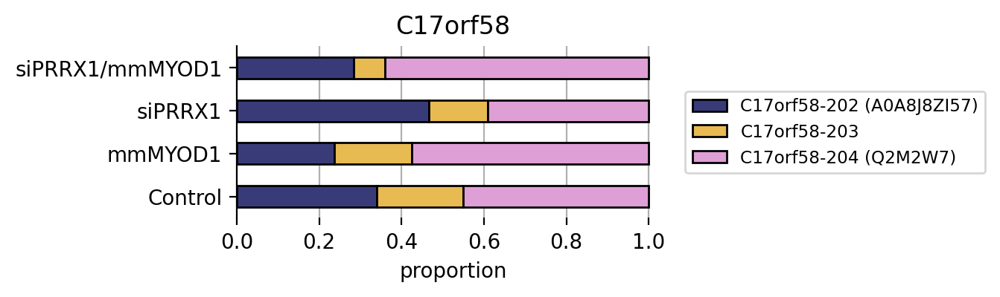

C21orf58


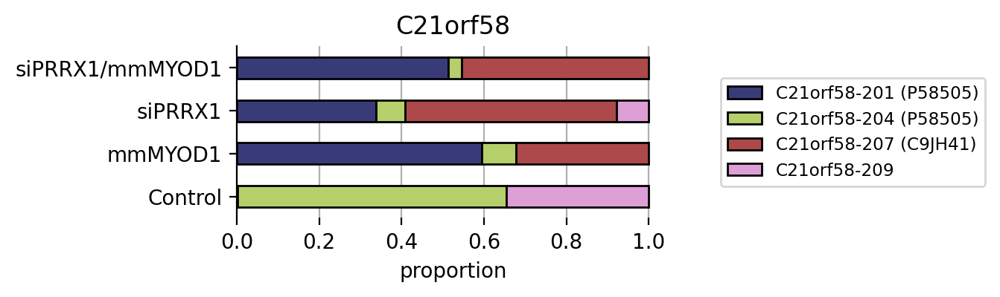

CABLES1


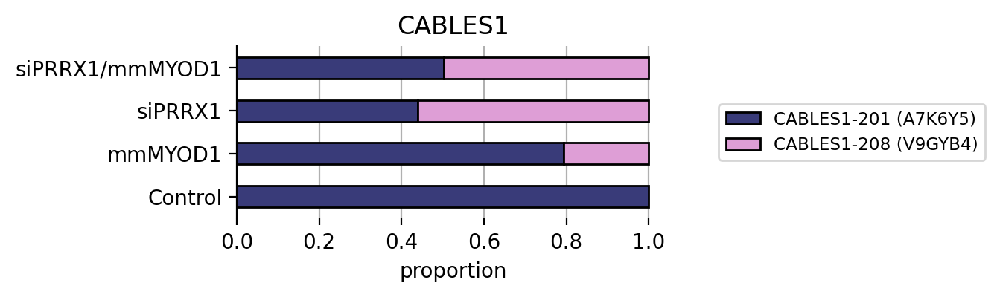

CADPS2


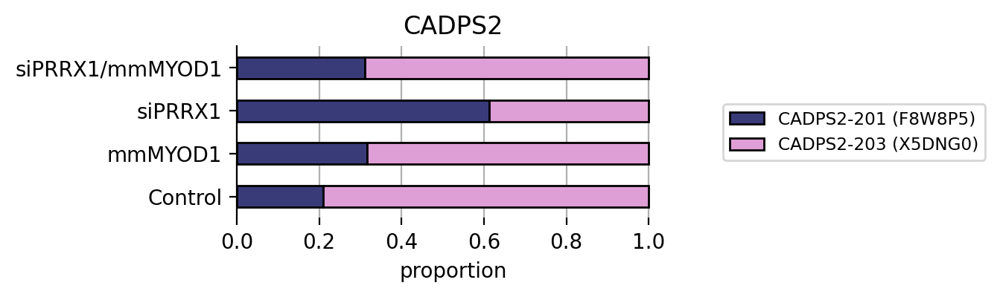

CAPRIN2


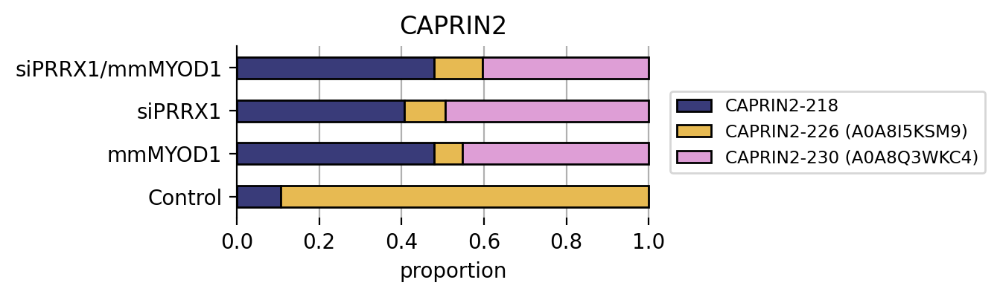

CASP5


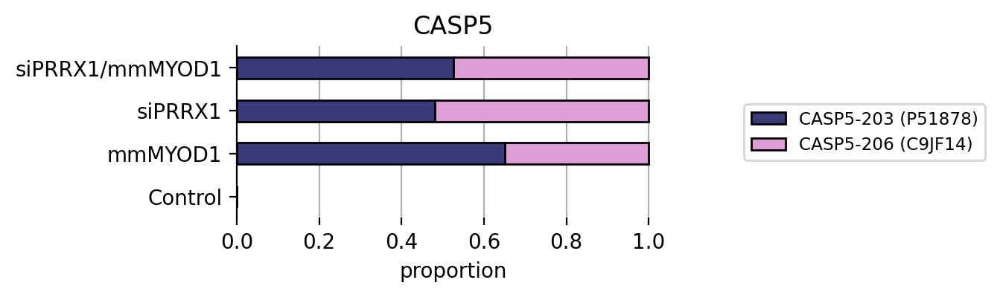

CCDC7


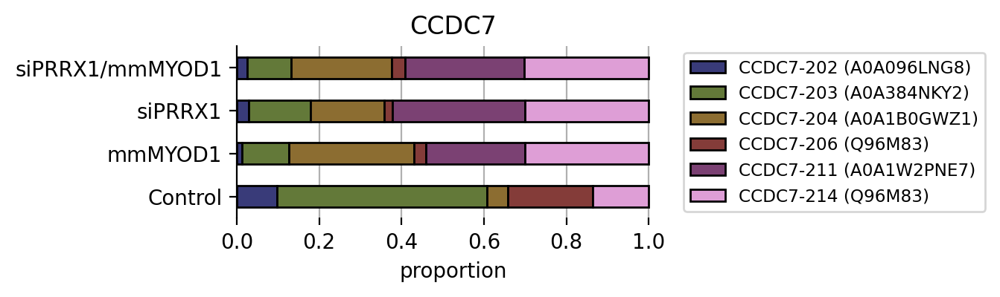

CCDC32


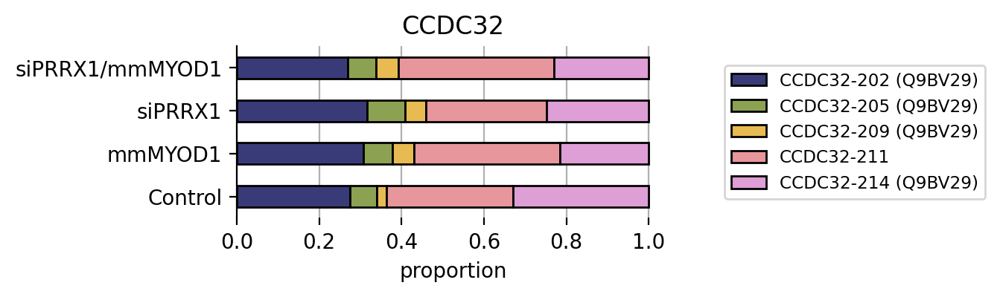

CCDC92


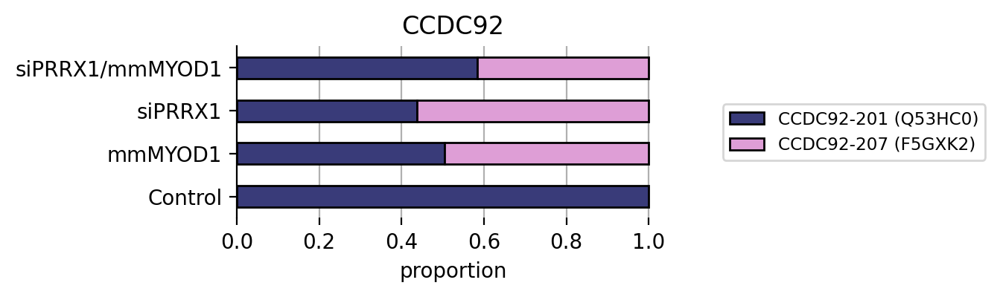

CCDC102B


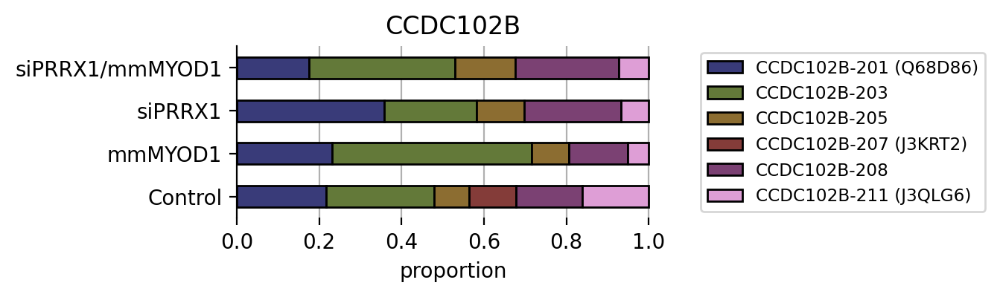

CCHCR1


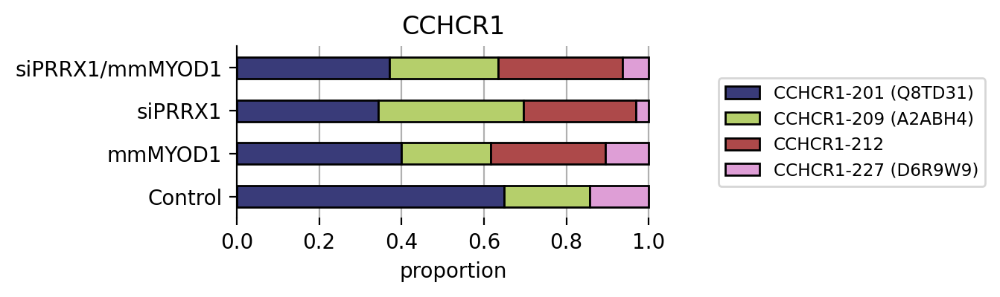

CD72


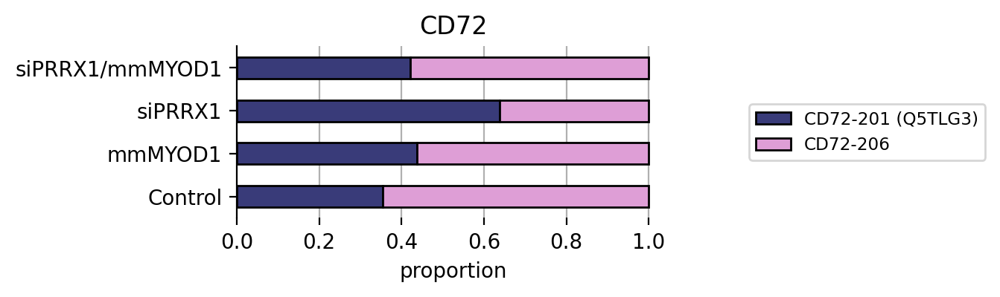

CDH13


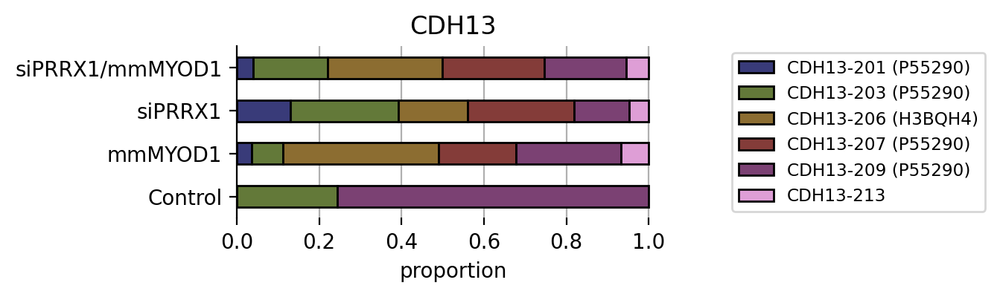

CENPJ


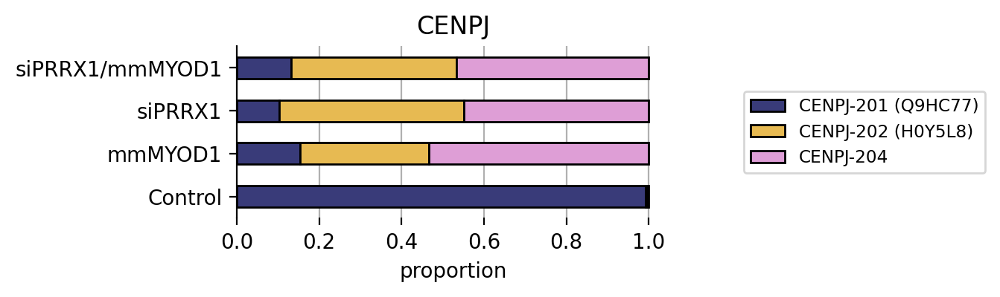

CEP44


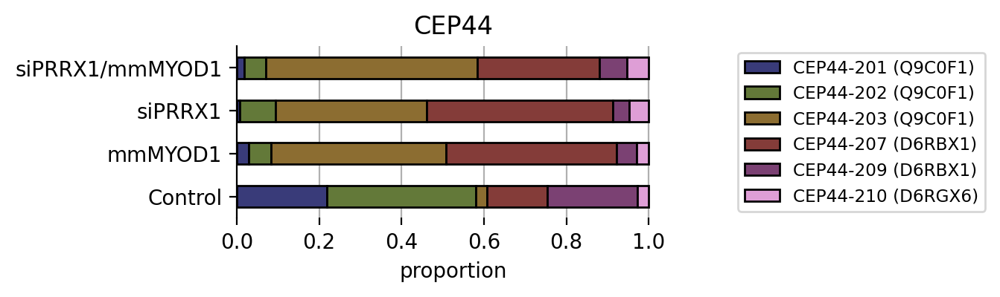

CEP63


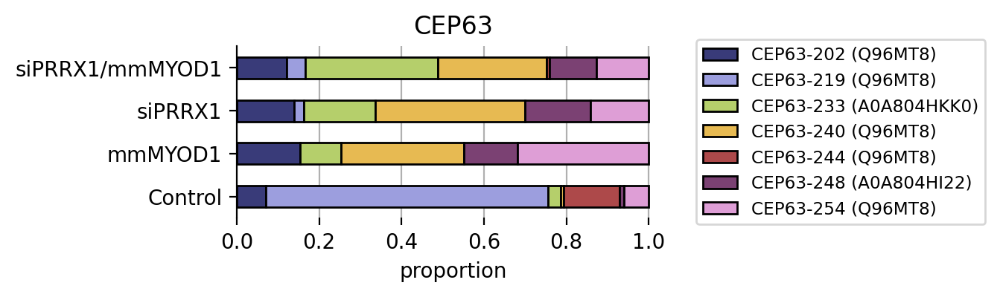

CLCN3


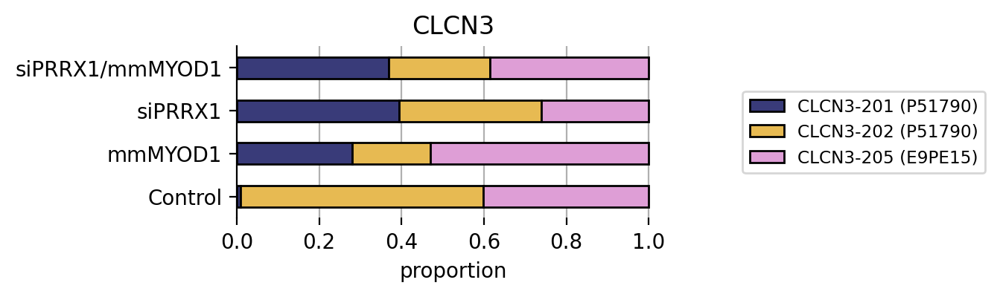

CLIP1


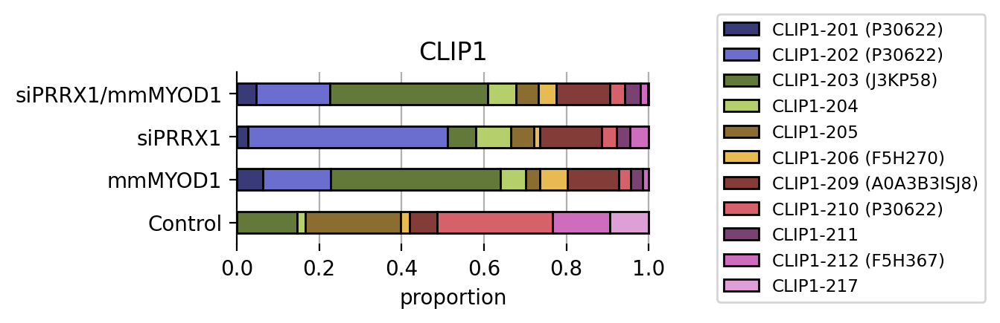

COL18A1


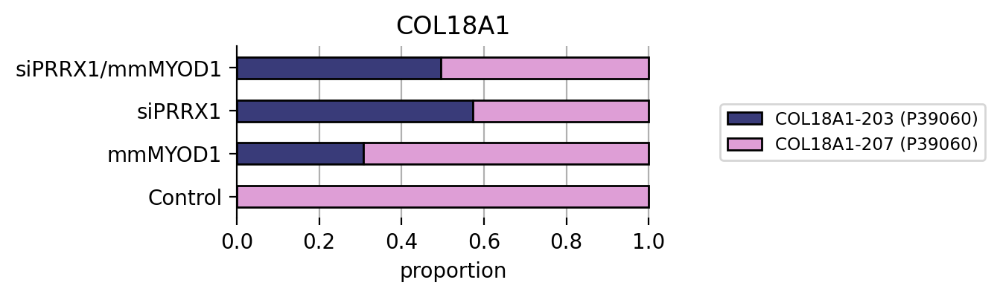

CORIN


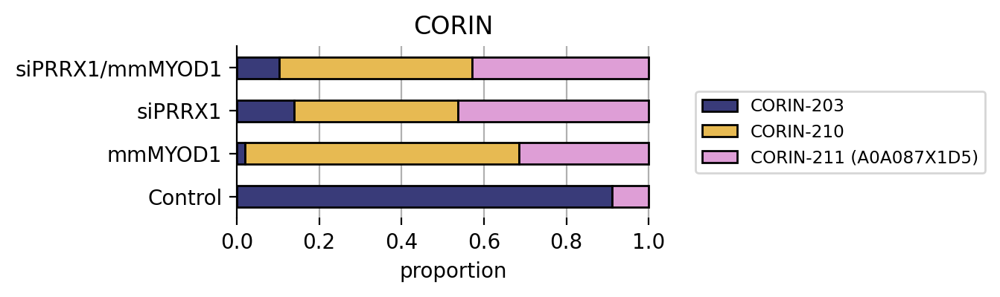

CYB5A


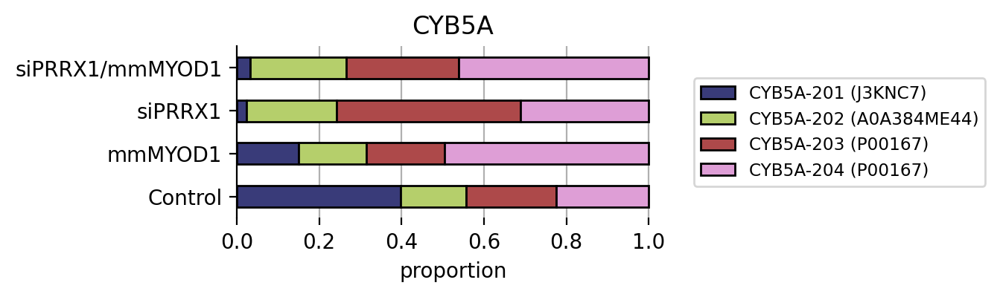

DELE1


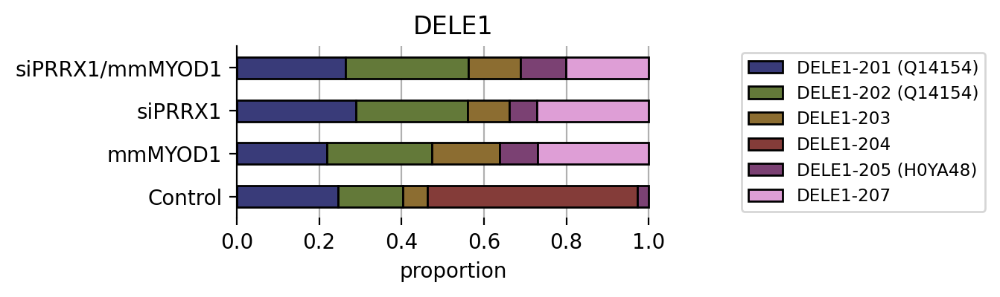

DENND3


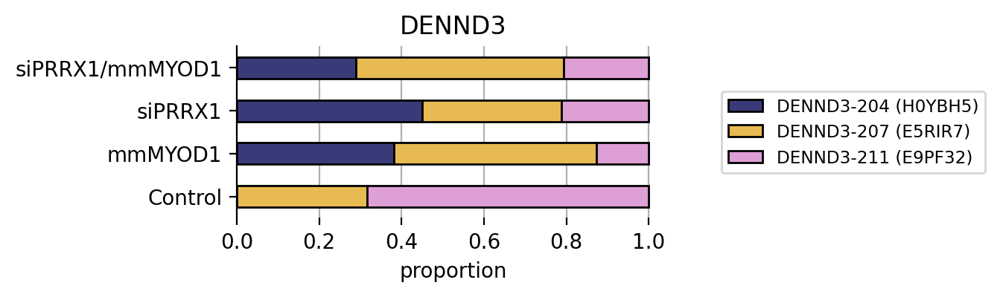

DNAAF11


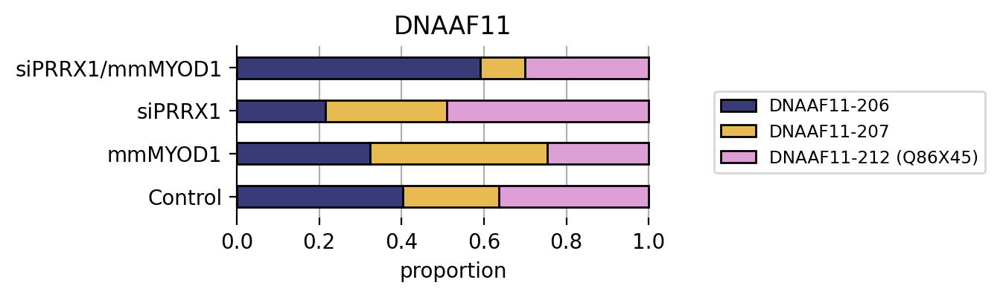

DNAJB2


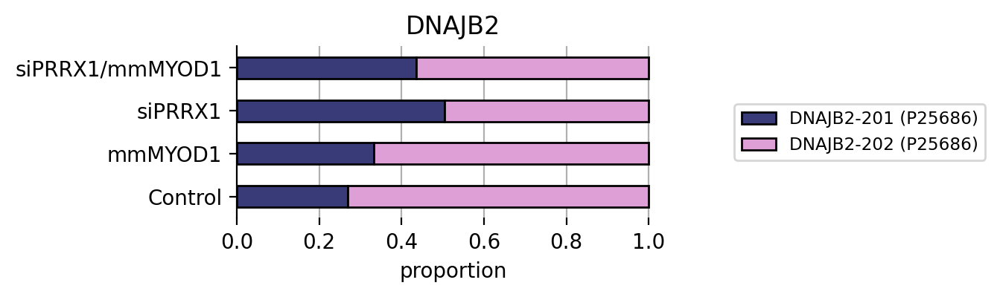

DNM1


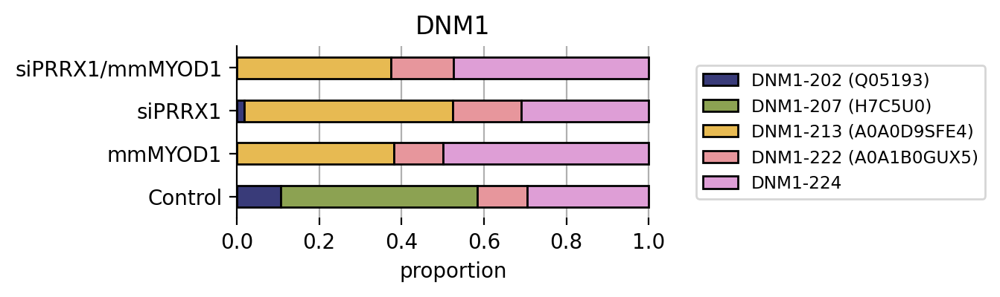

DNM3


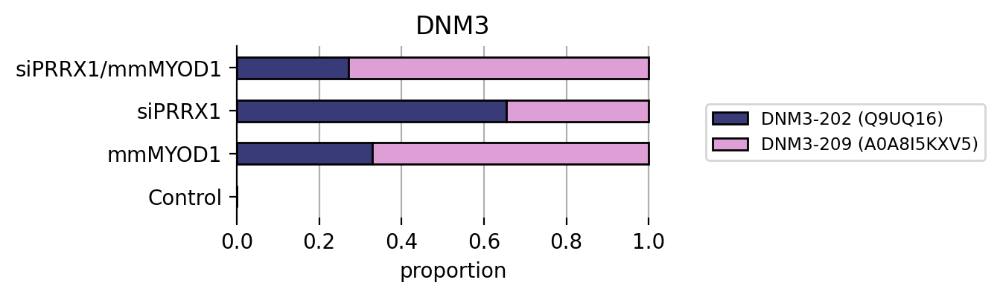

DST


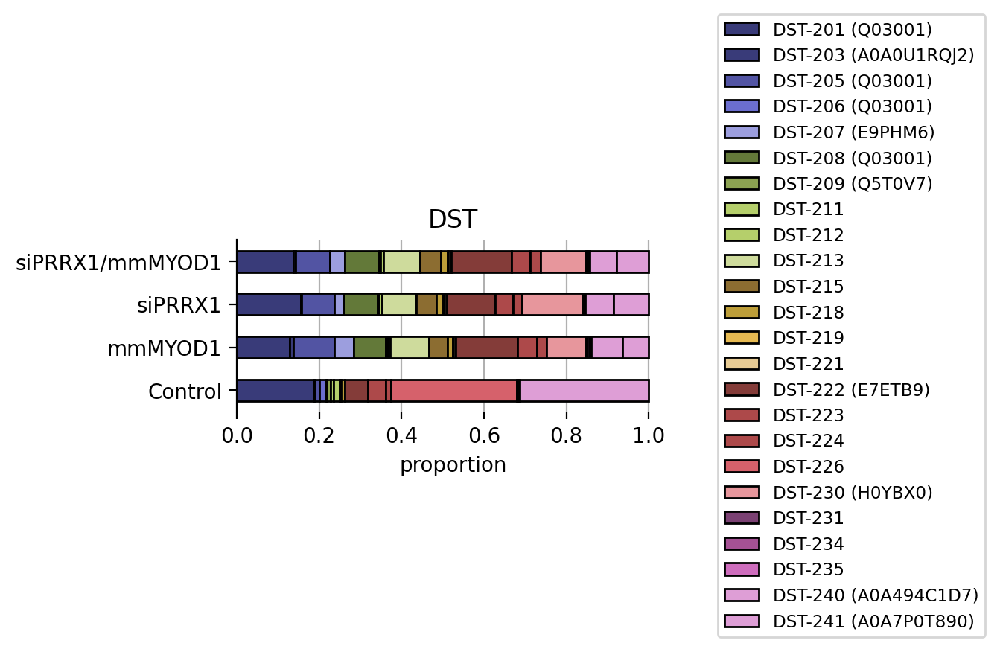

DUS4L


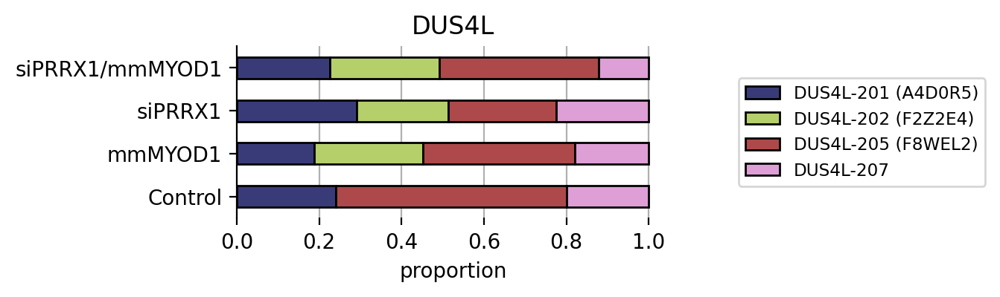

EFCAB10


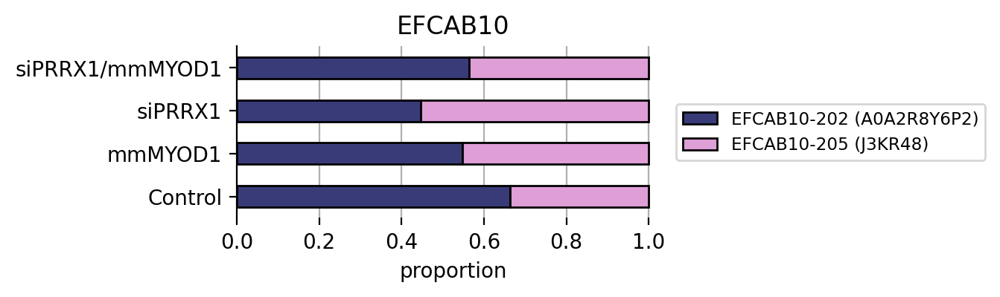

EML3


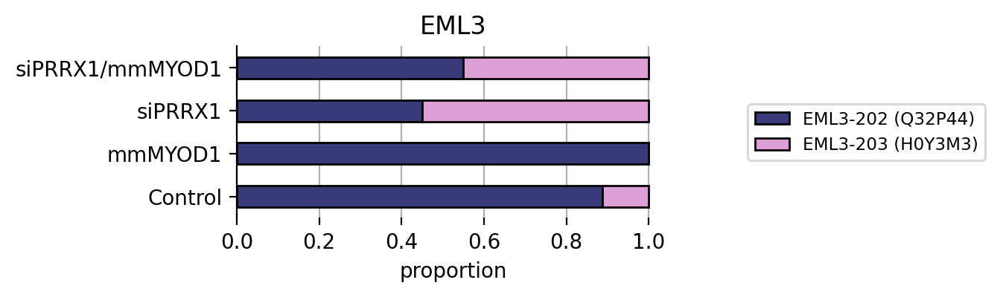

EMSY


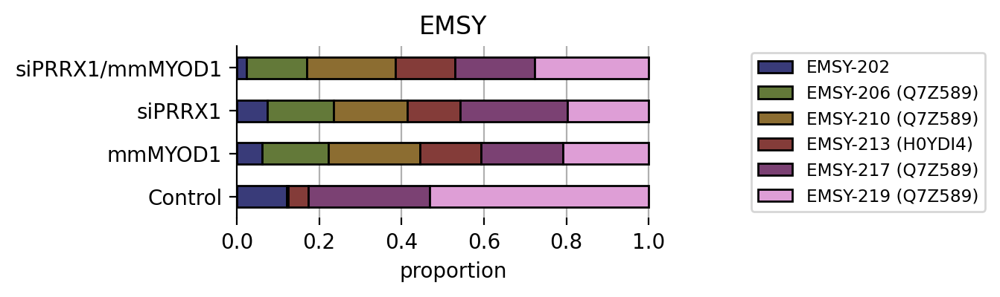

EPS8L2


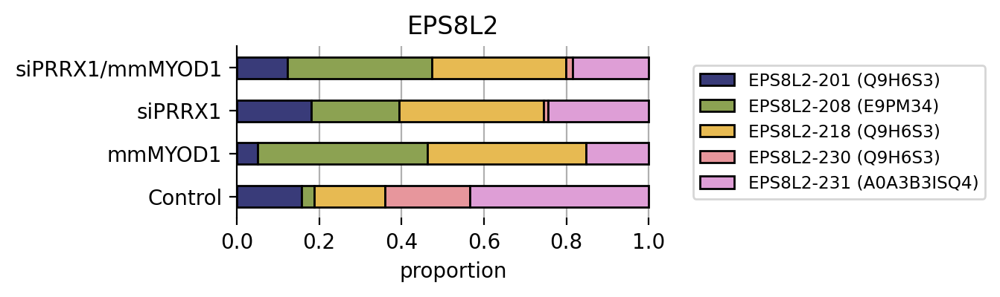

ERCC2


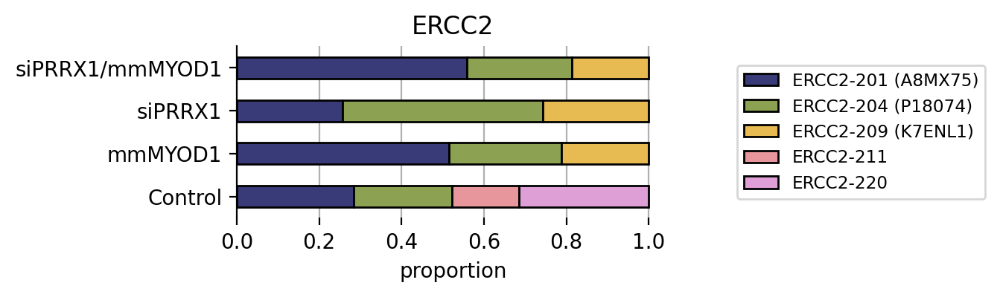

FAHD2A


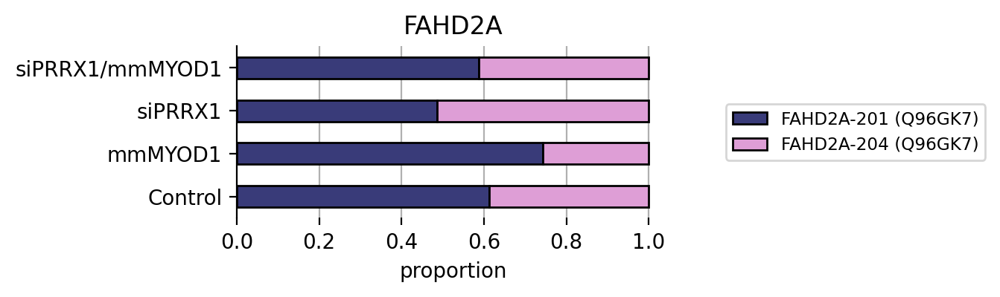

FAM110A


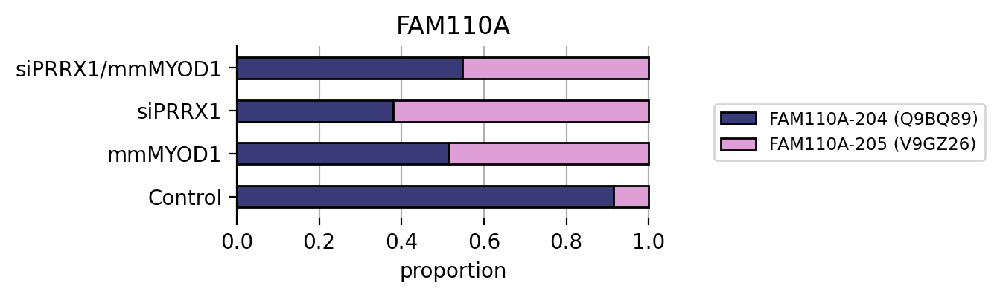

FAM221A


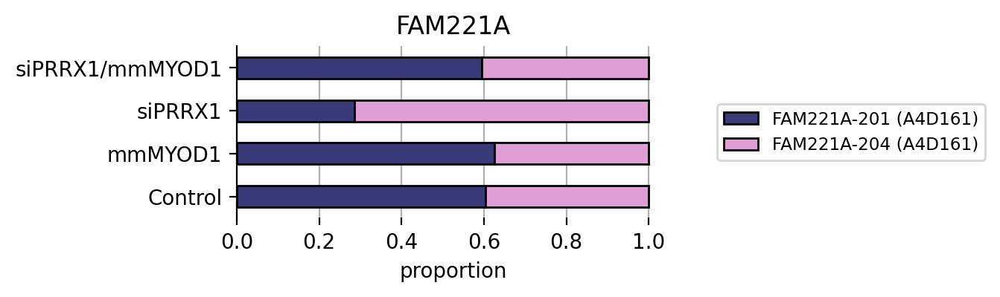

FAM222B


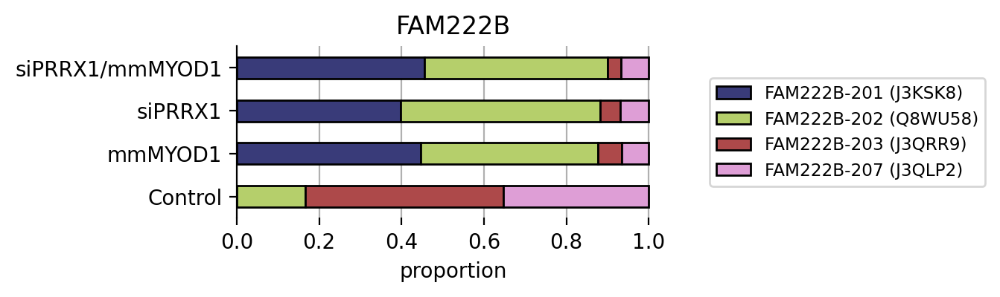

FGD4


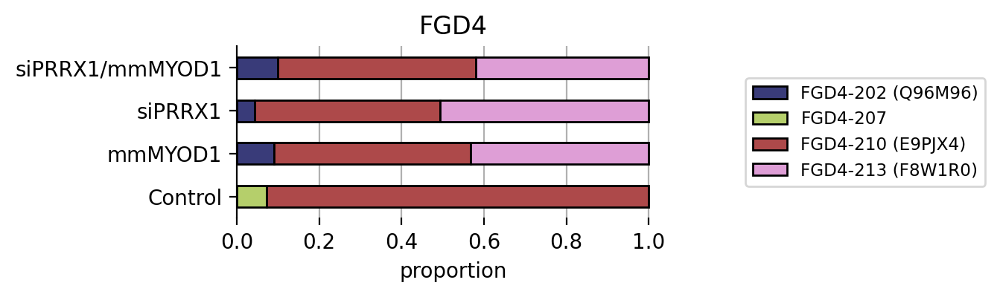

FKBP9


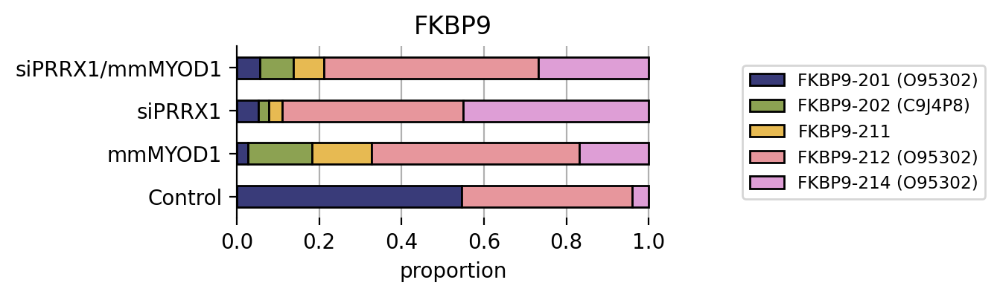

FLT1


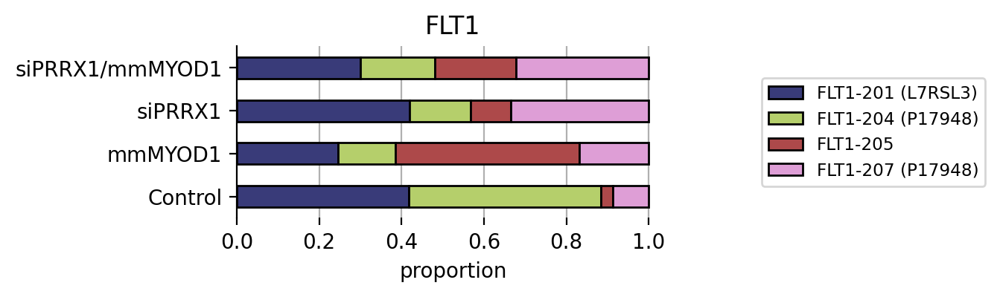

FOXO3


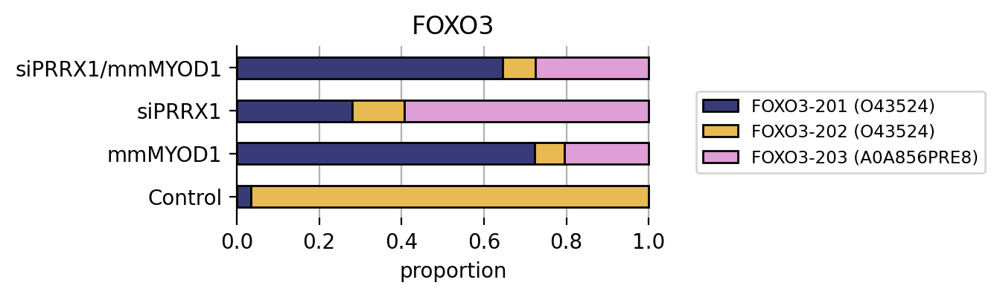

GAA


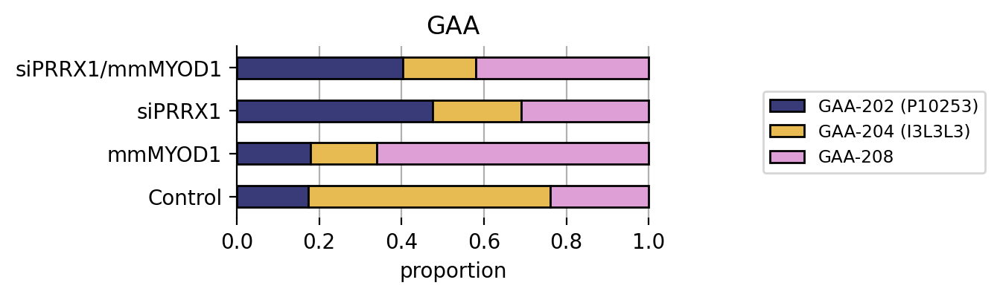

GABRB3


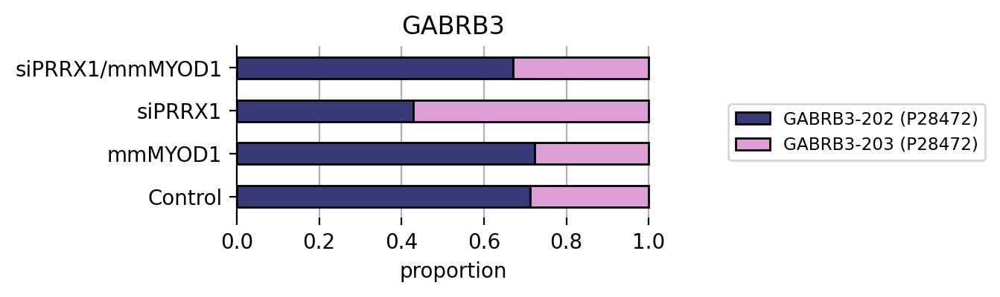

GALNT12


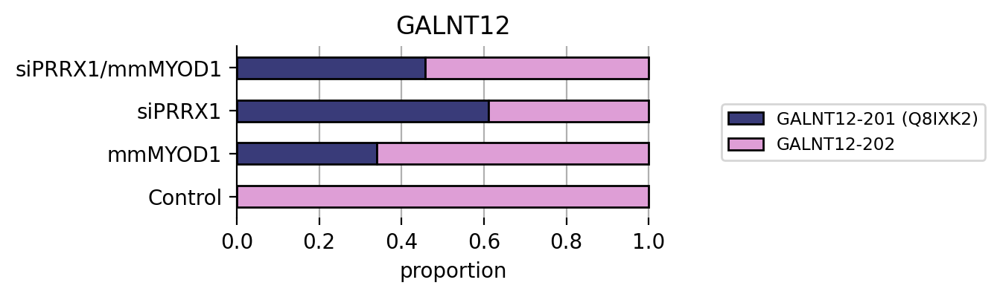

GANC


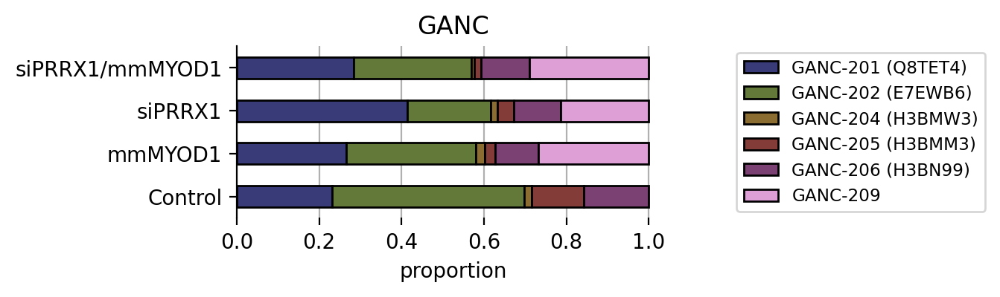

GEMIN8


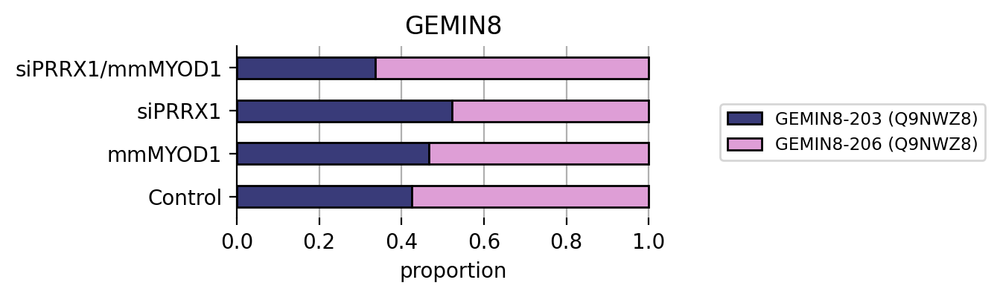

GNAS


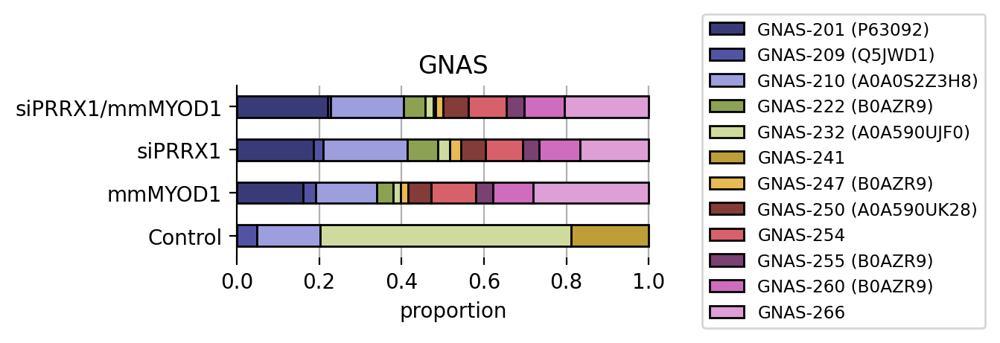

GPANK1


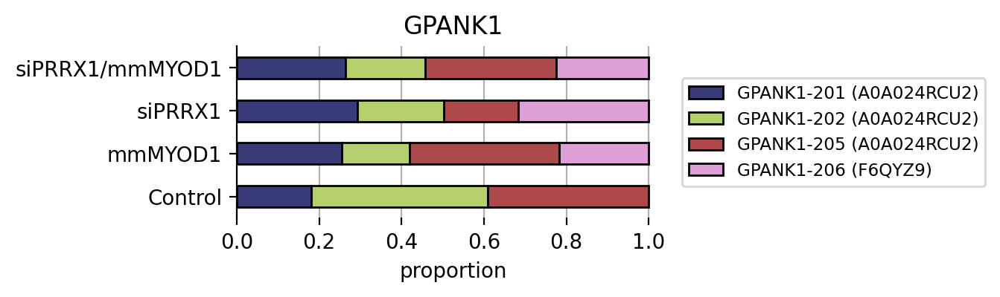

GRK6


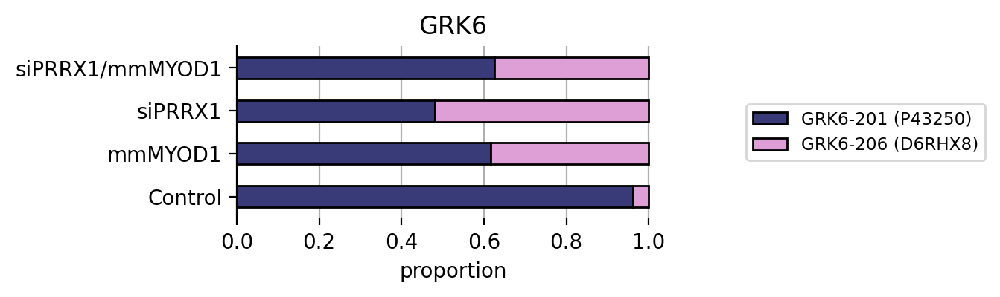

HELQ


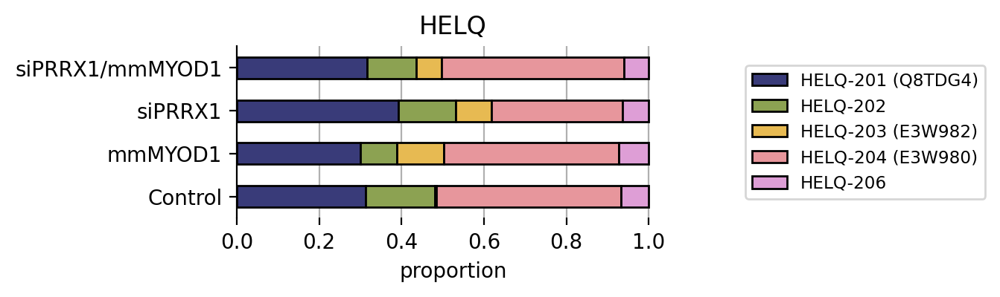

HPCAL1


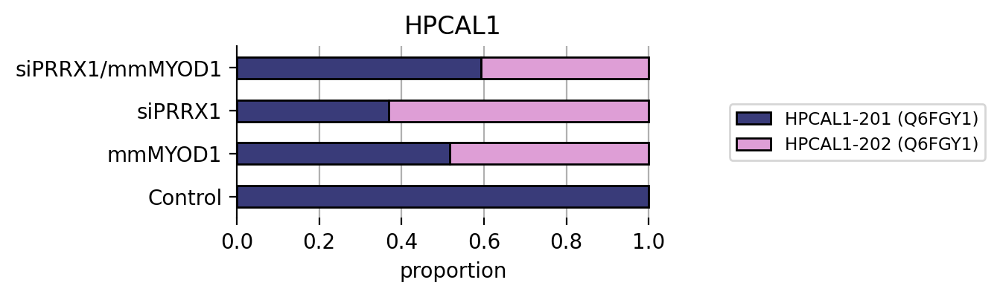

IFRD1


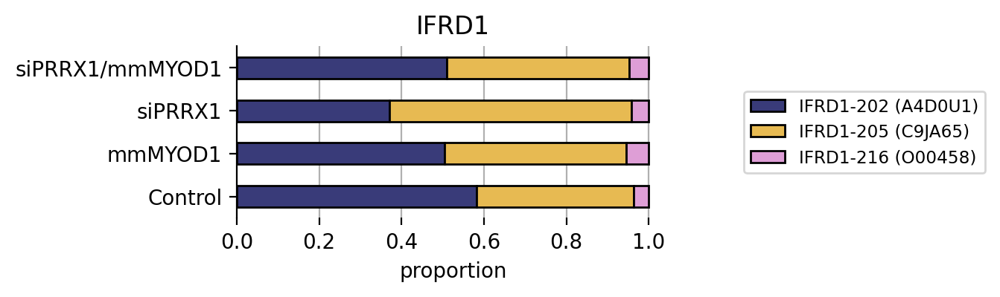

IL18BP


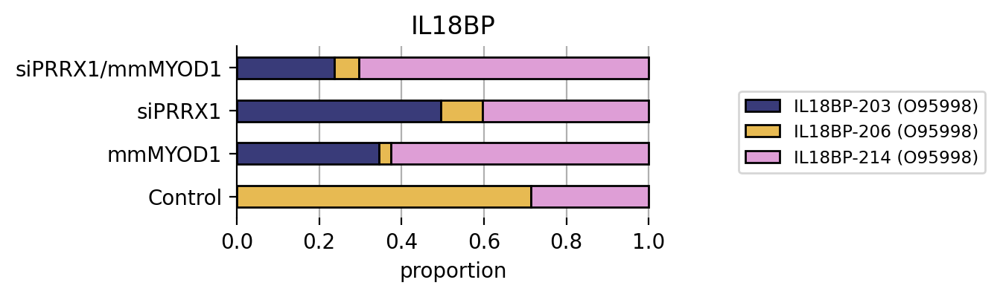

ING4


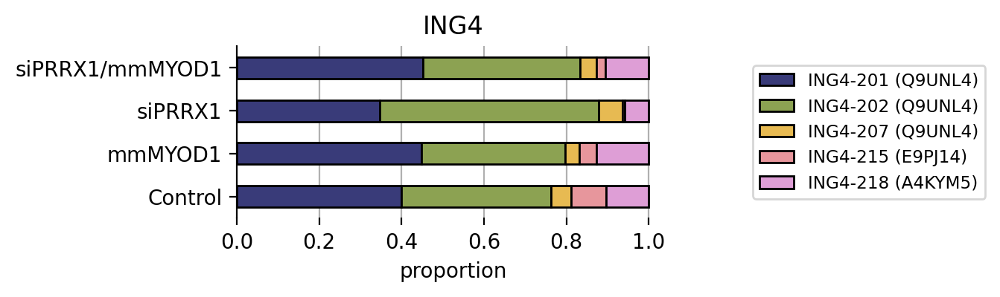

IQCN


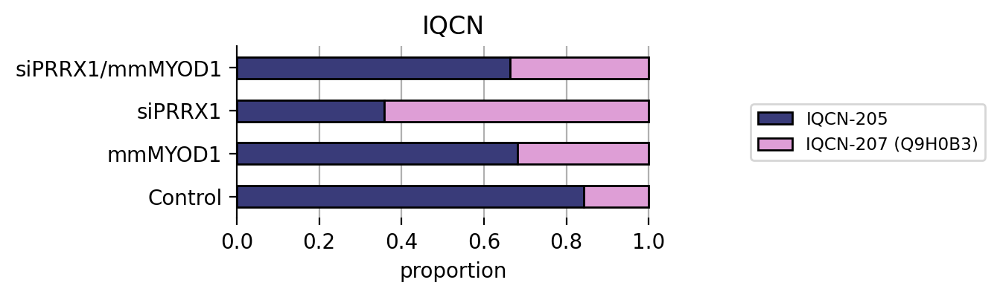

KIAA1328


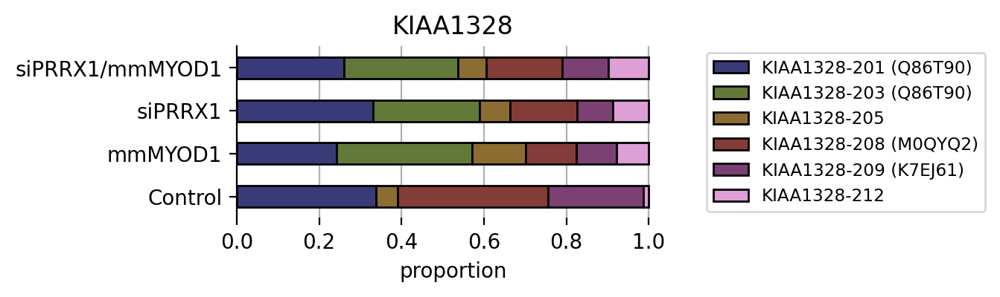

KIRREL3


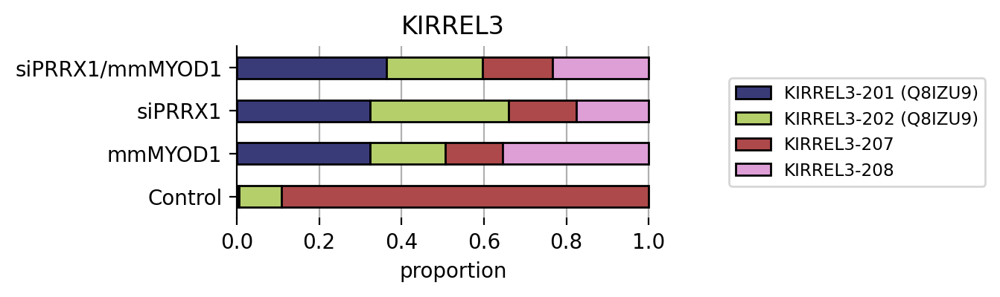

KMO


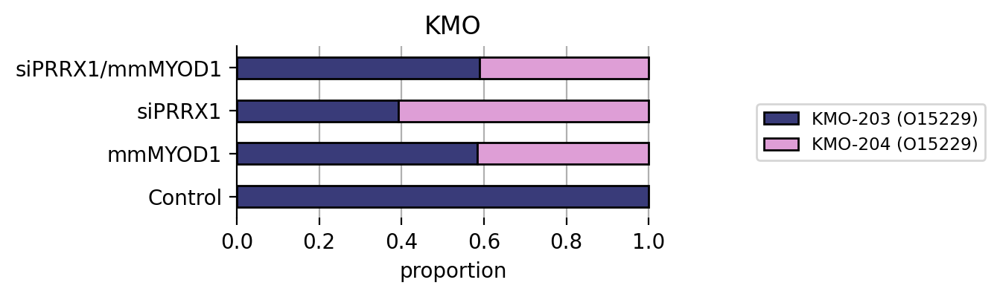

LDAH


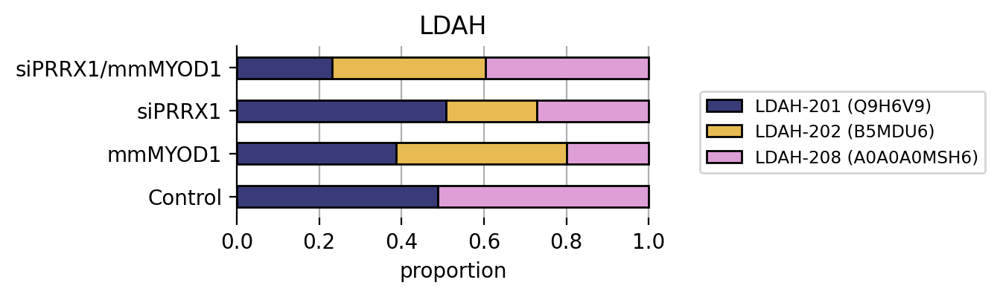

LHX9


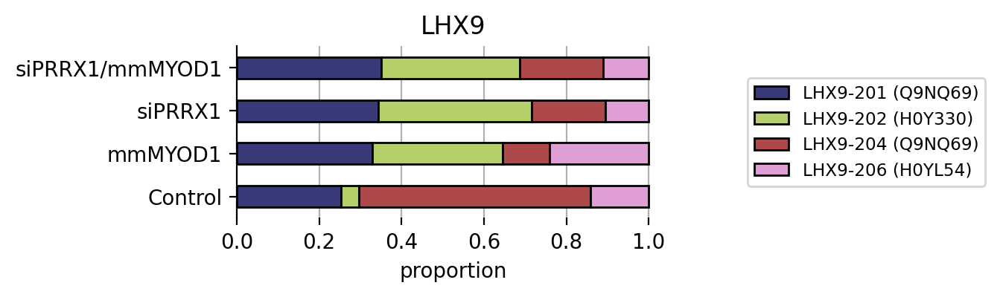

LRRC34


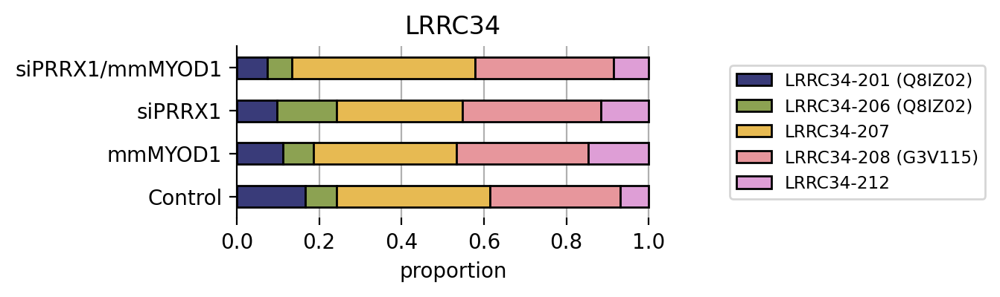

LUC7L3


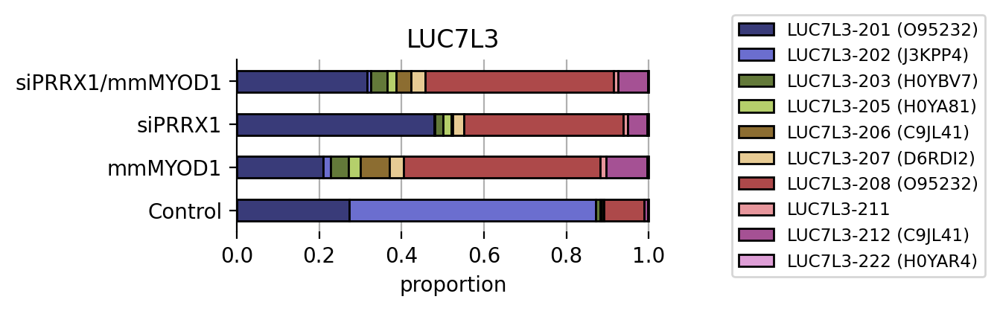

MACROD2


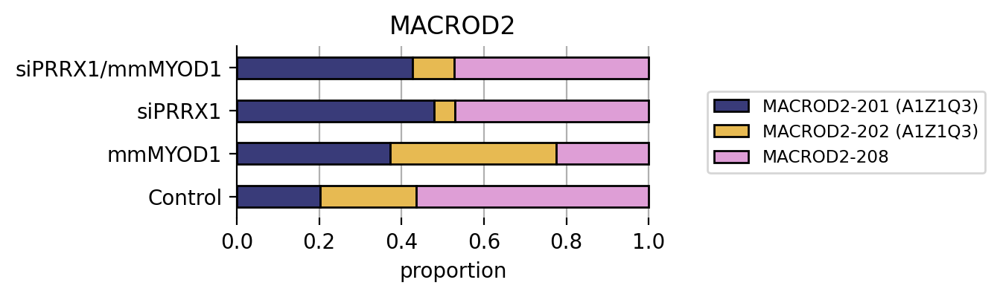

MAD1L1


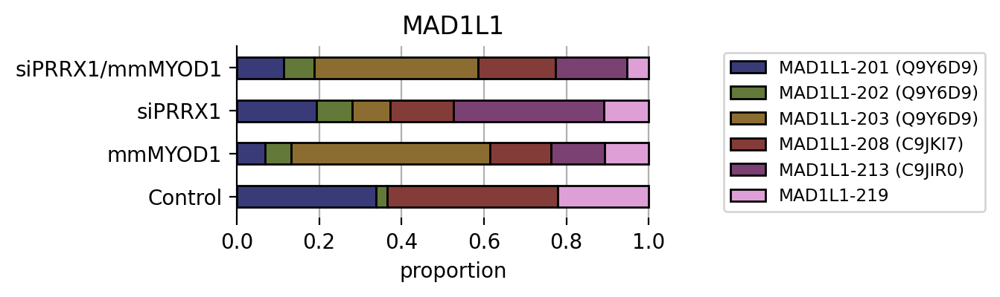

MAN2C1


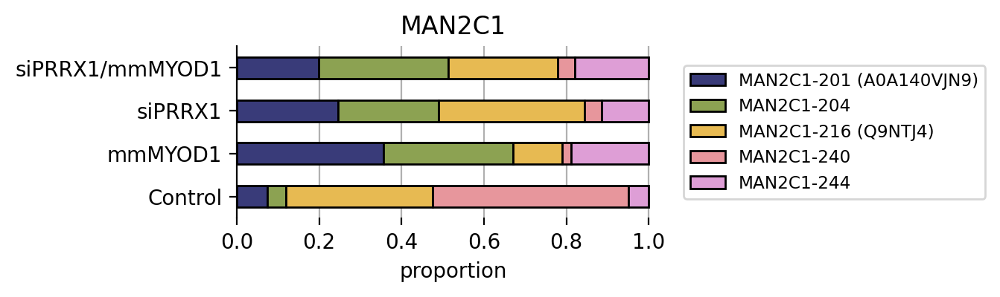

MAP3K8


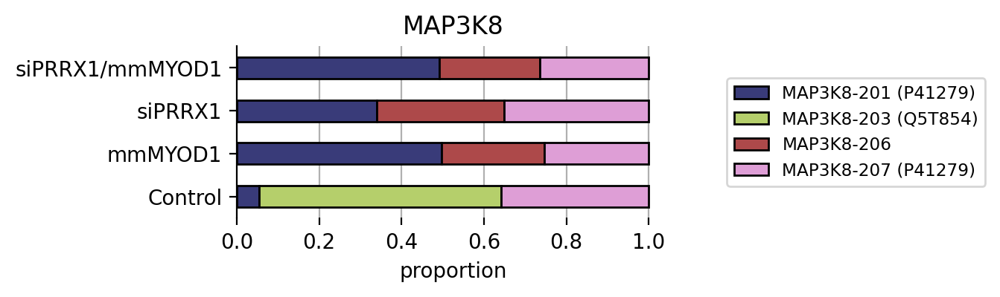

MAPK10


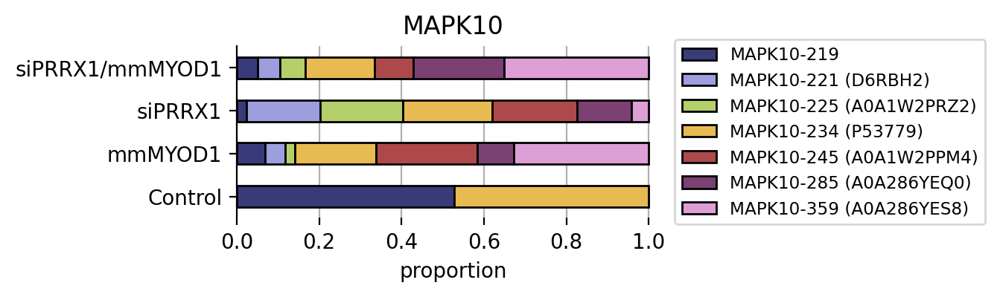

MATN2


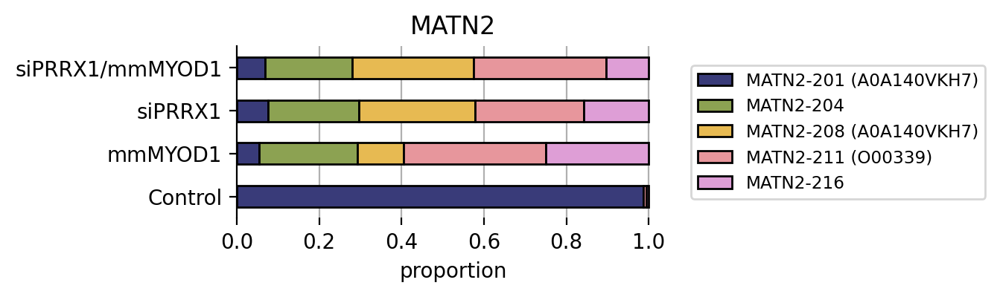

MBD4


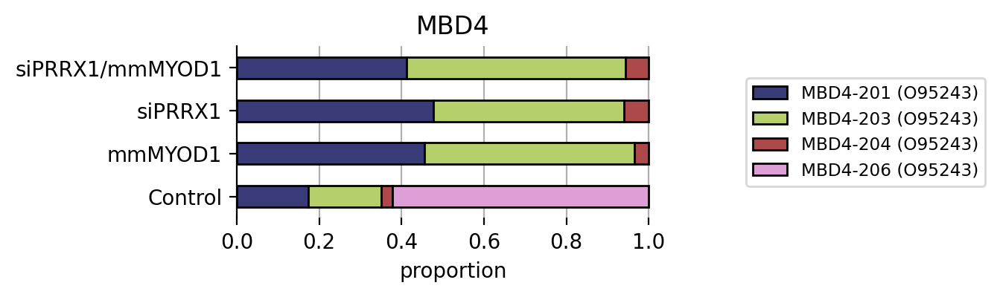

MED28


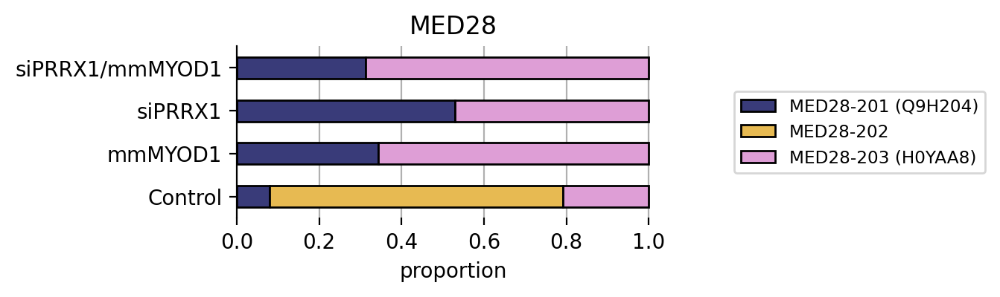

MOK


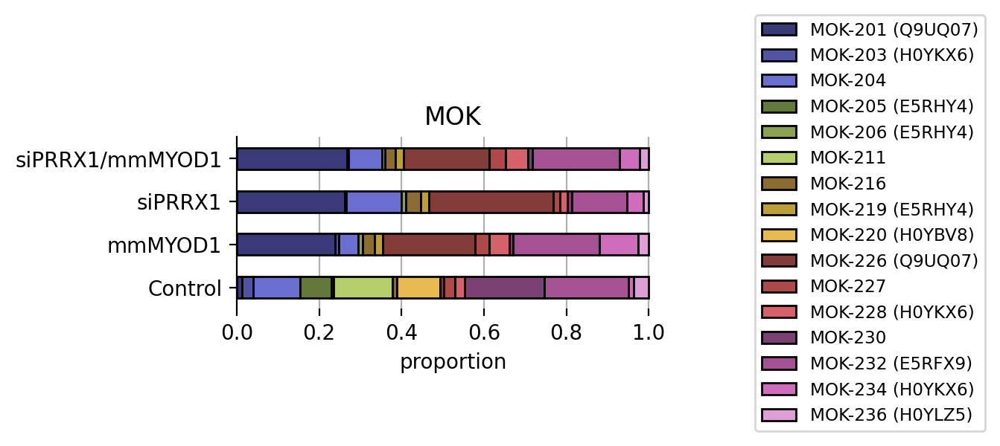

MPPE1


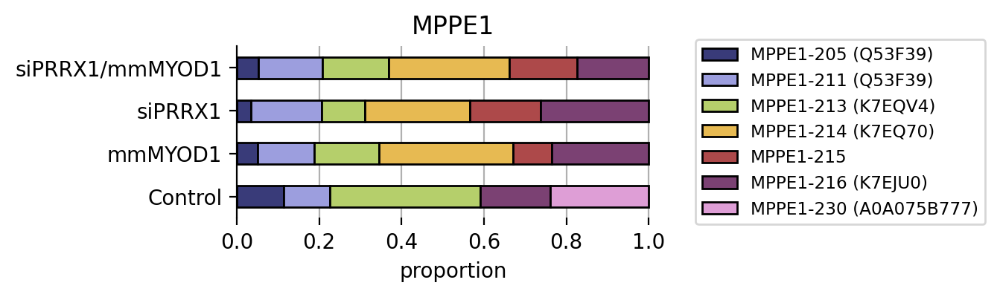

MSL3


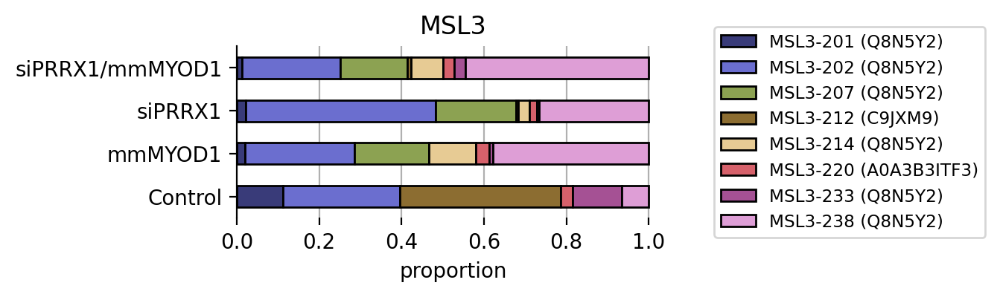

MXRA7


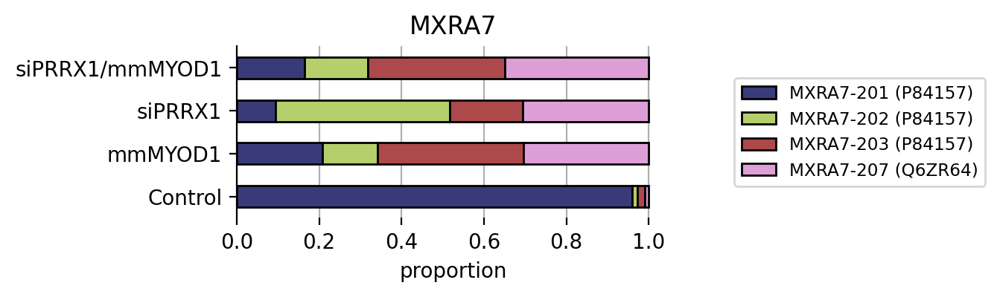

MYO1B


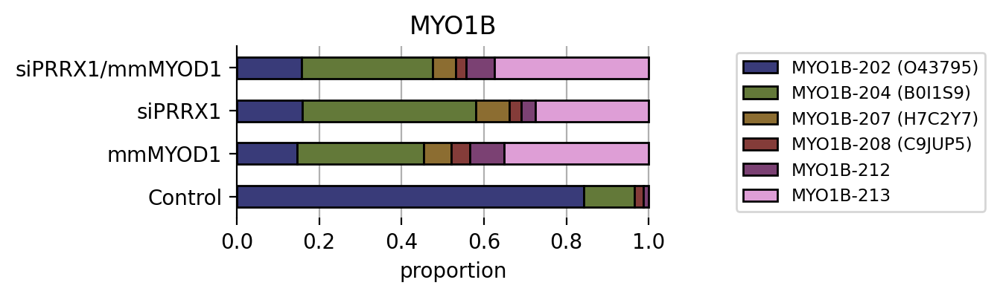

NCAPG2


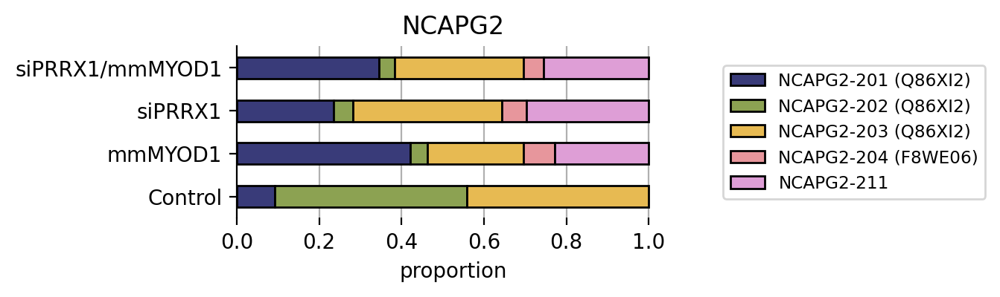

NCK2


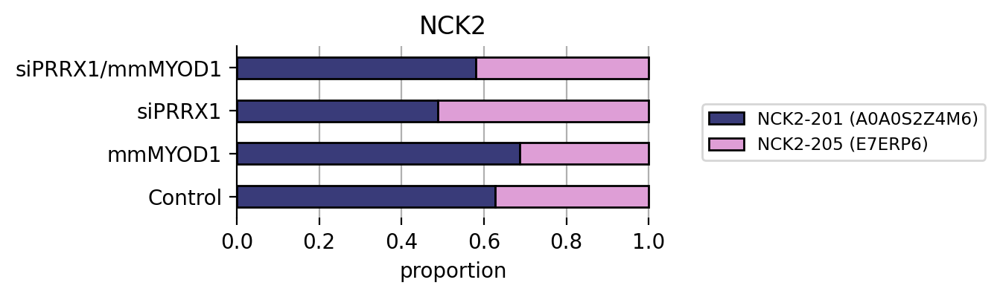

NCL


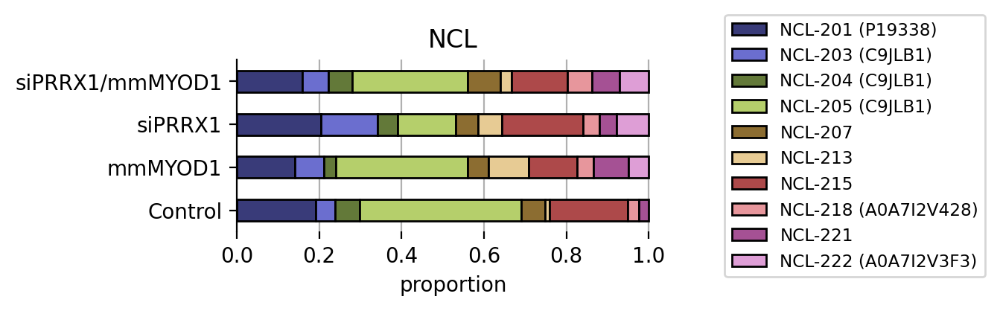

NCOA1


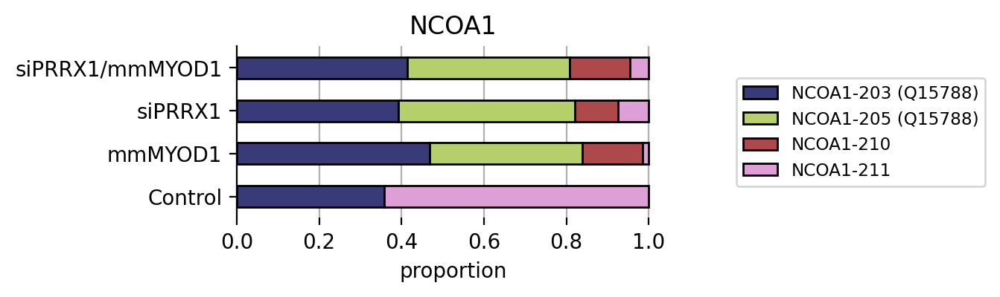

NDUFAF5


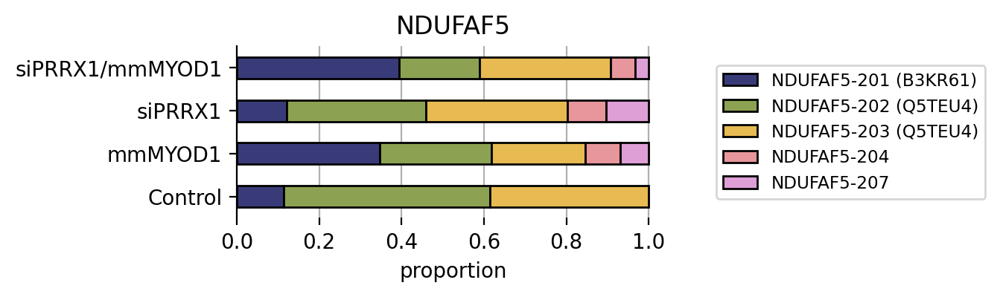

NFIX


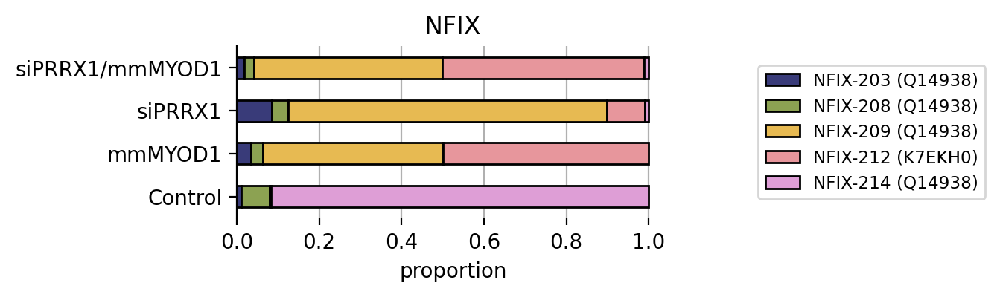

NFX1


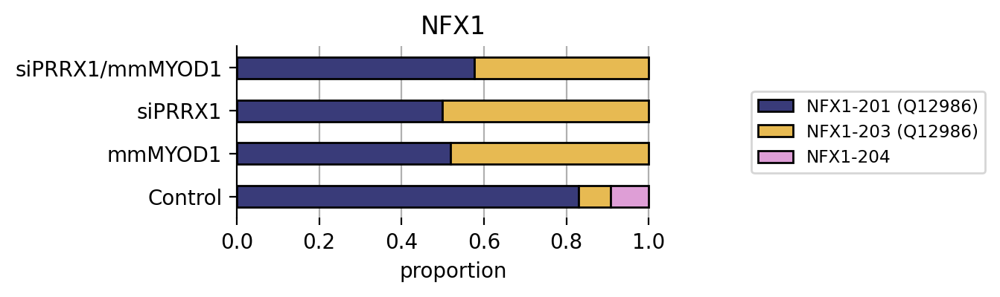

NOS1AP


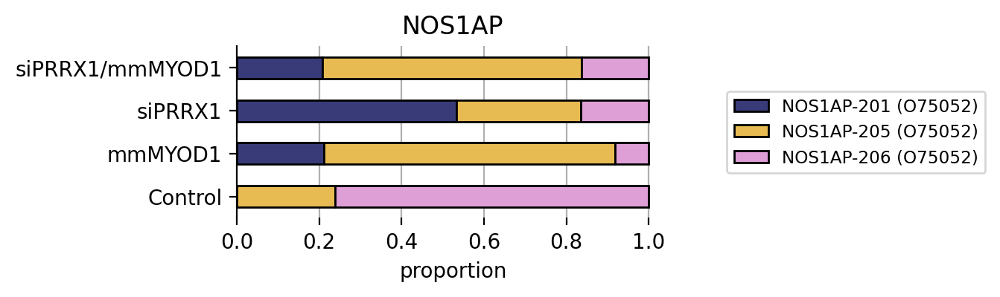

NPW


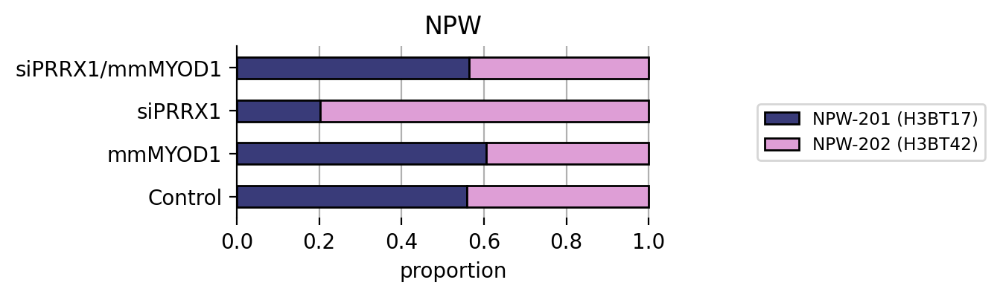

NRGN


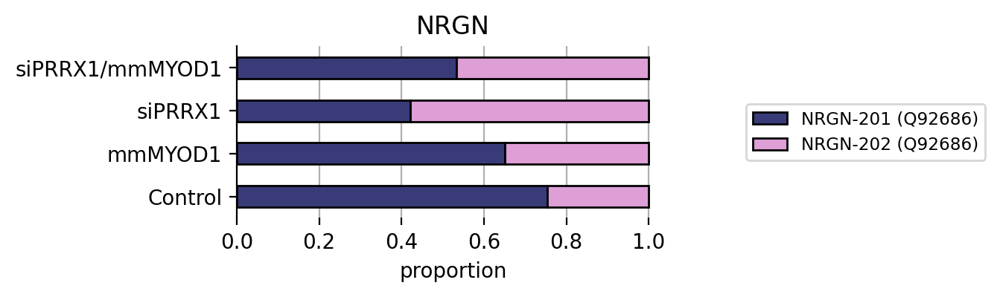

NSRP1


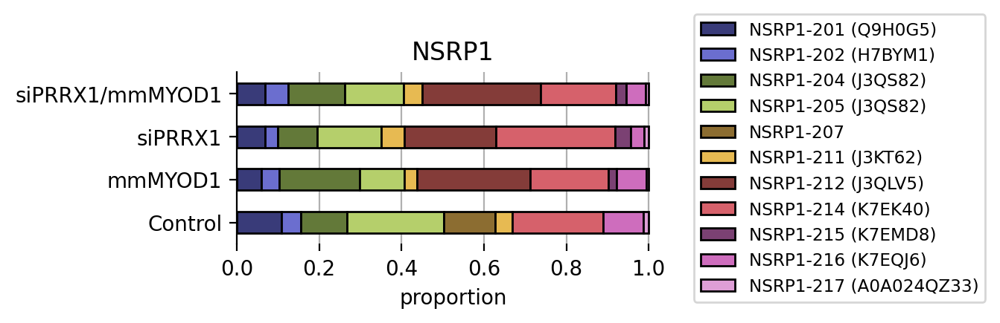

NT5C3B


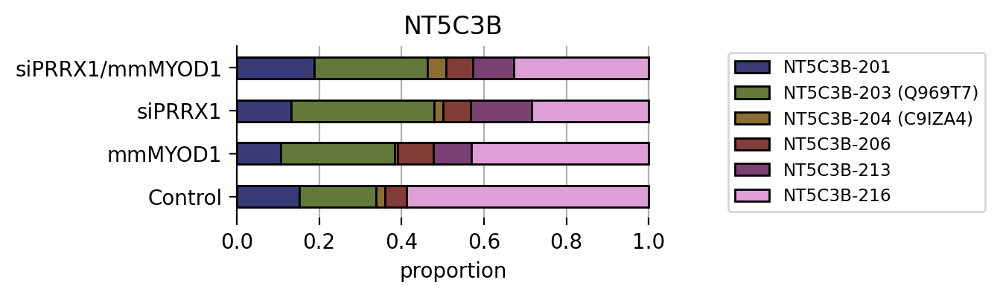

NUP214


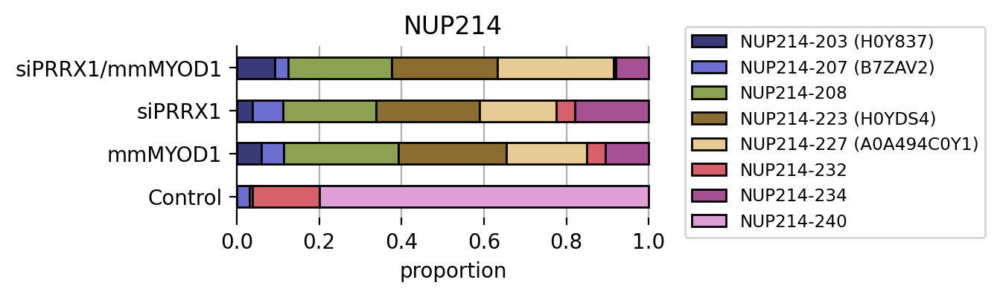

OAZ3


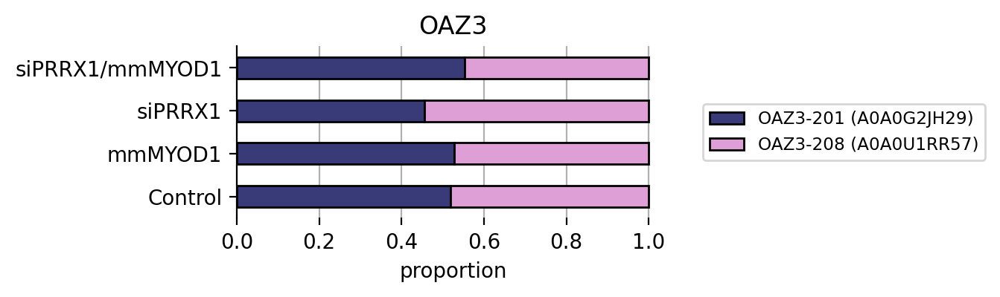

ODAD3


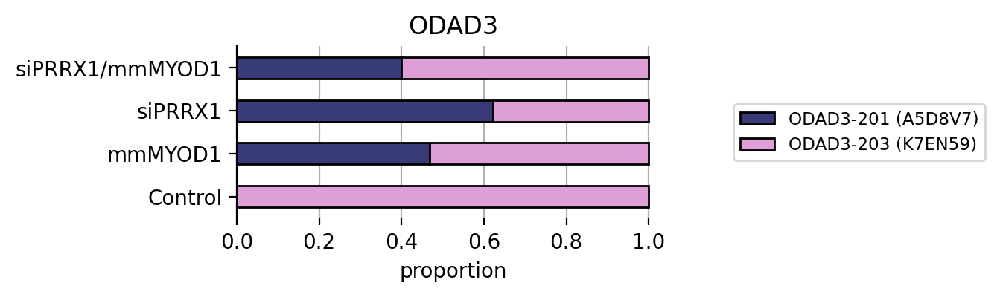

PABPC4


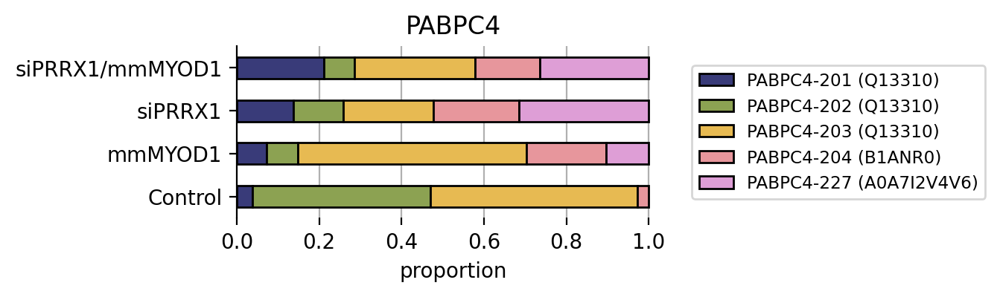

PARP8


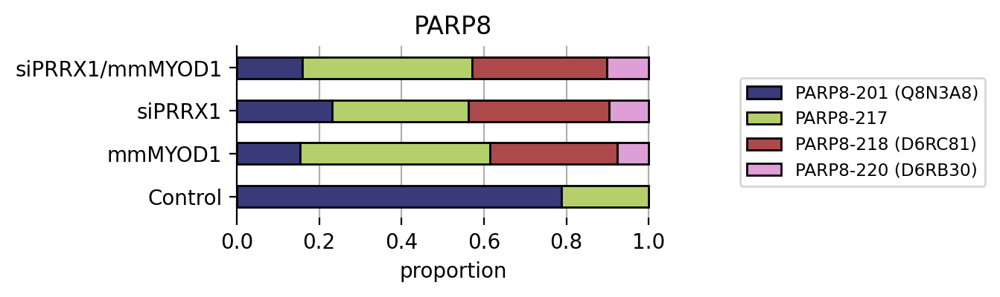

PCBP2


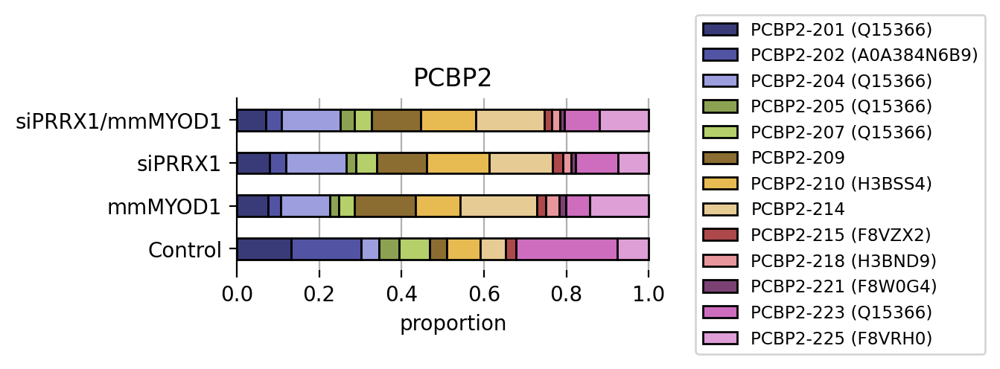

PCDH7


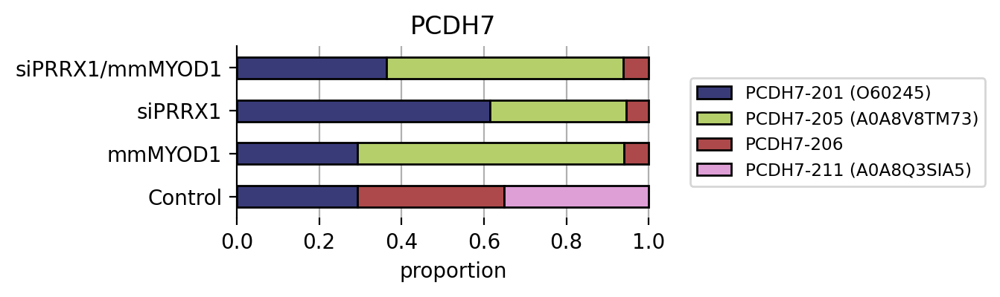

PCID2


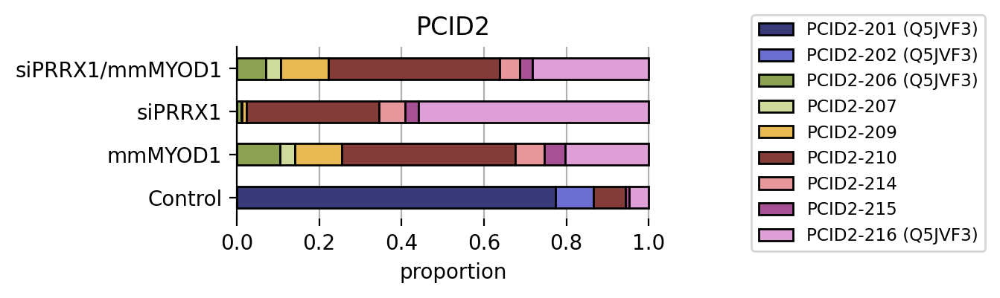

PCNT


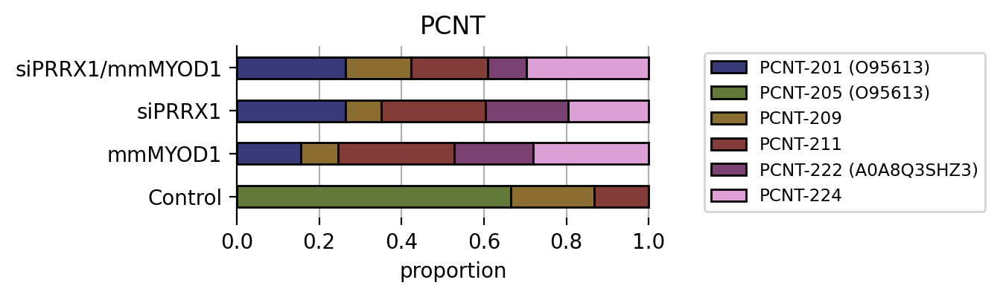

PCTP


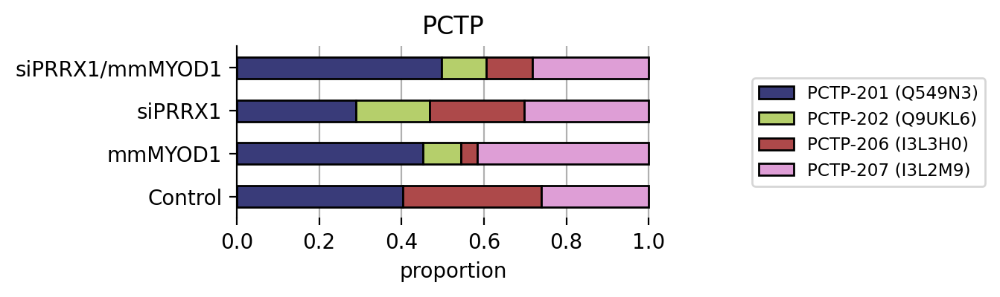

PDXDC1


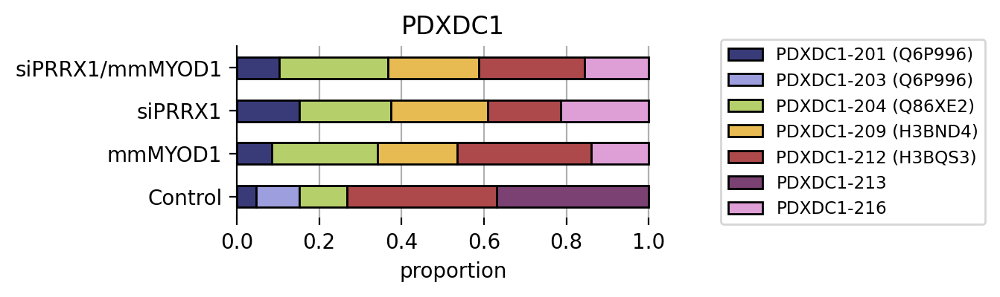

PELI2


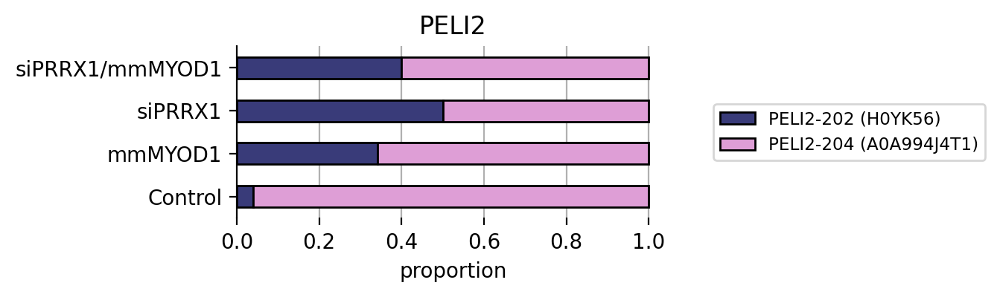

PEX5


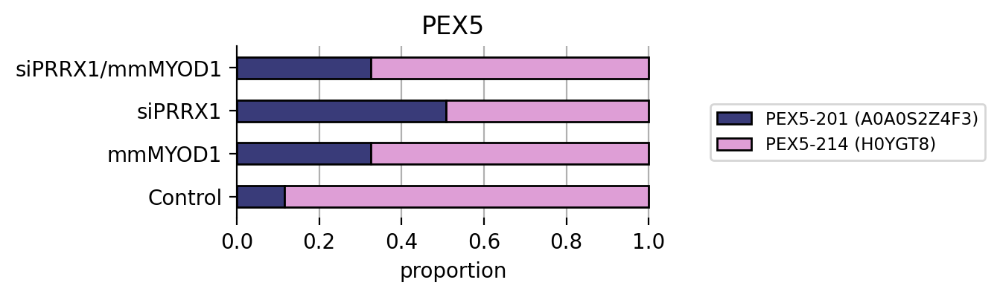

PFKFB4


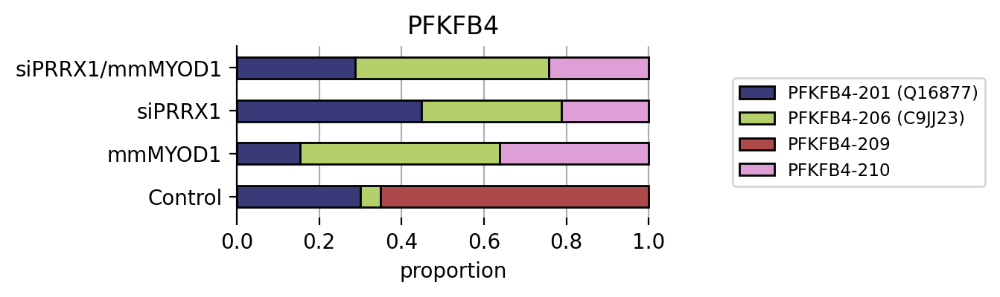

PJA1


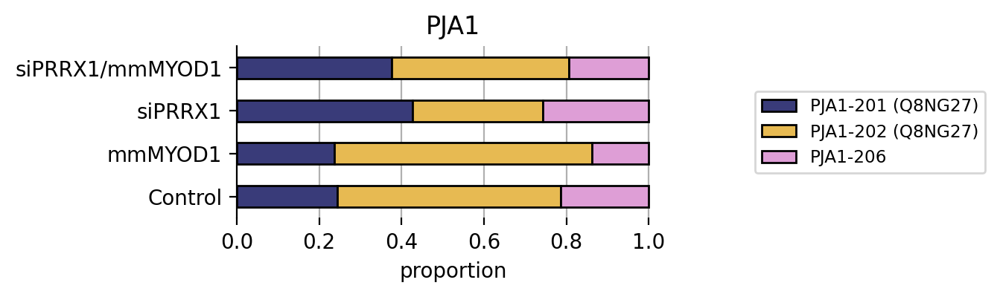

PLCB4


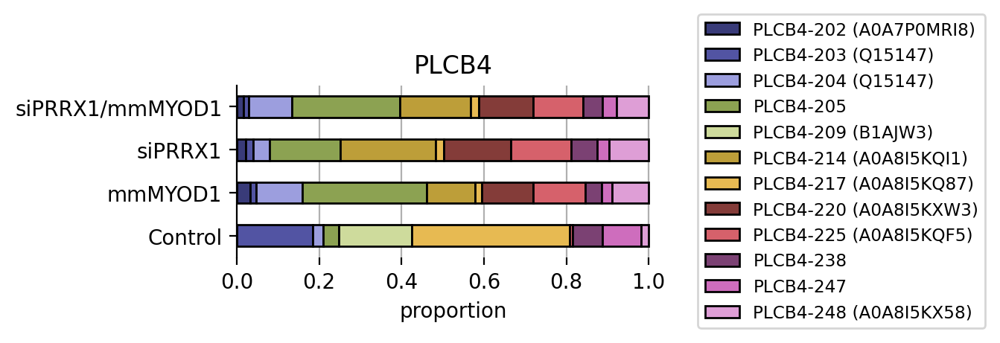

PLD2


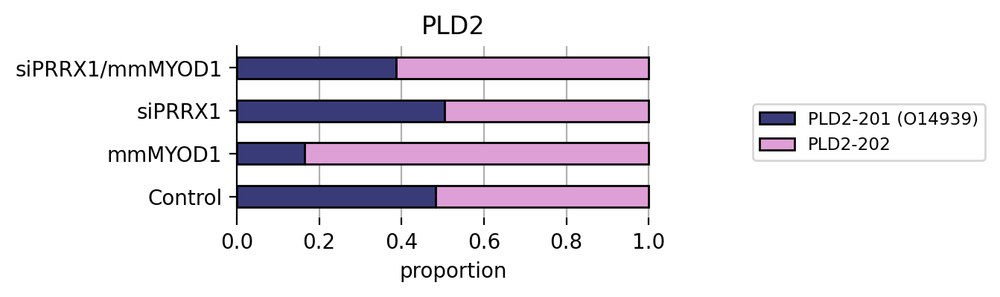

PLSCR2


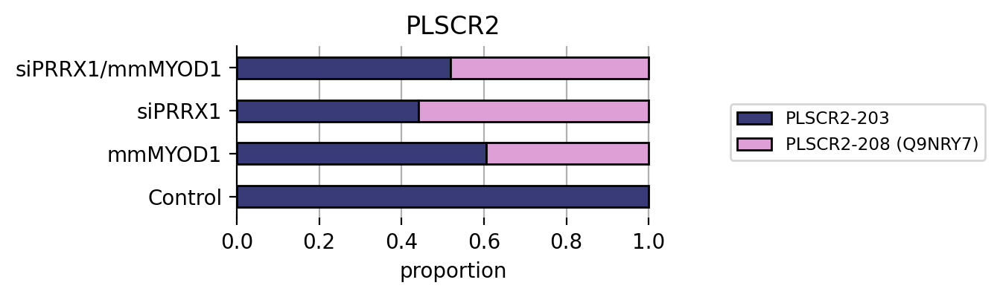

POLN


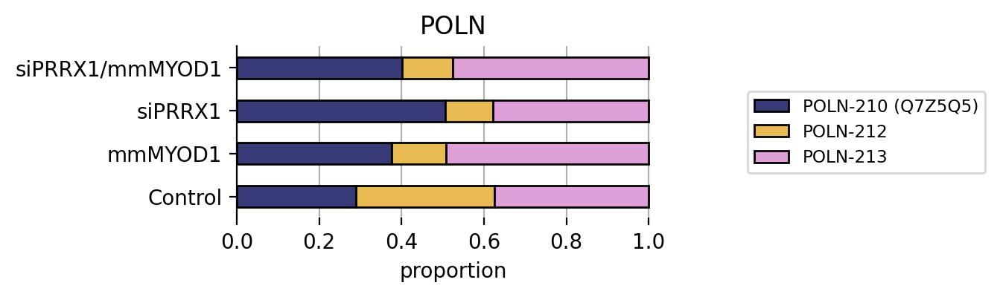

POLR1H


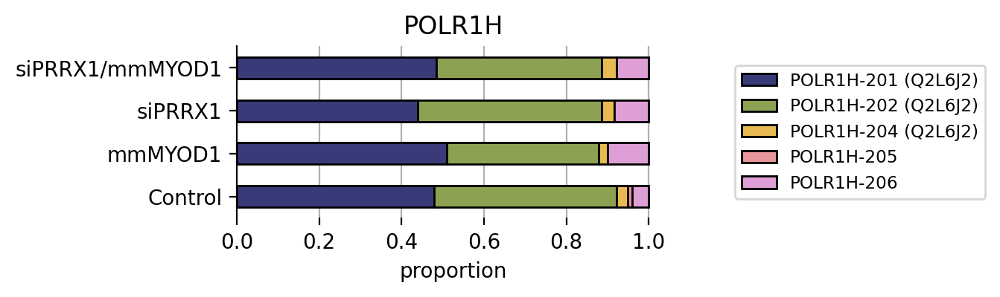

PPARGC1B


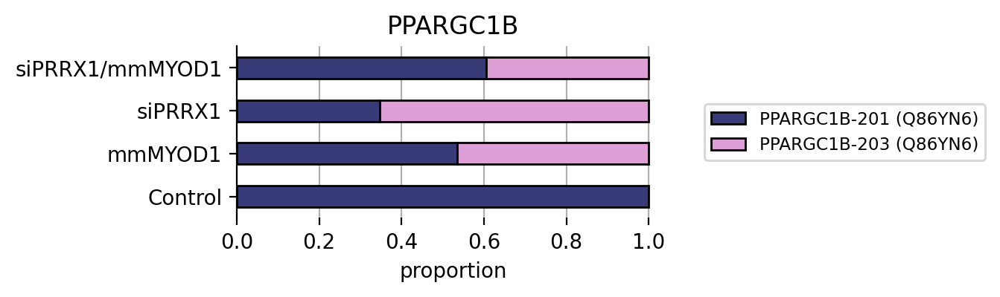

PPP1R18


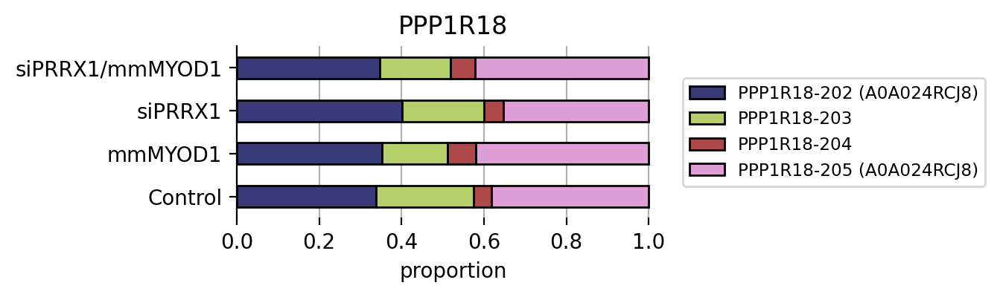

PSORS1C1


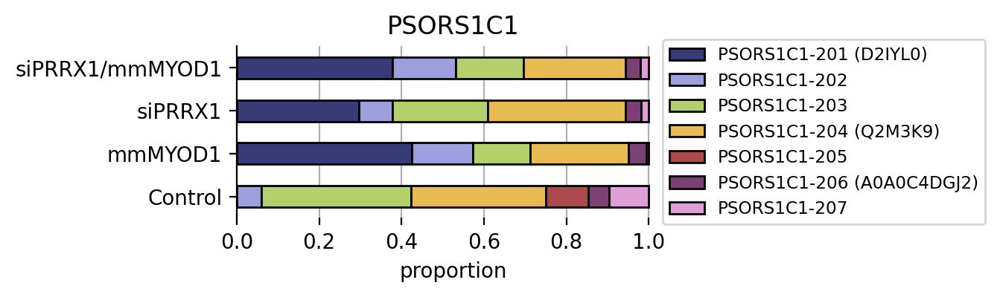

PTGER4


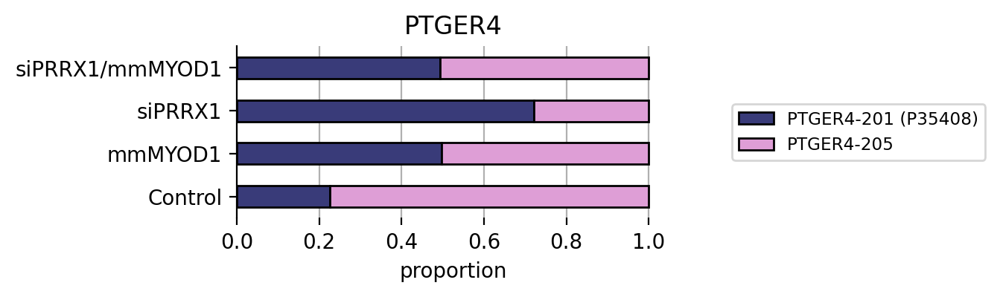

PTK2


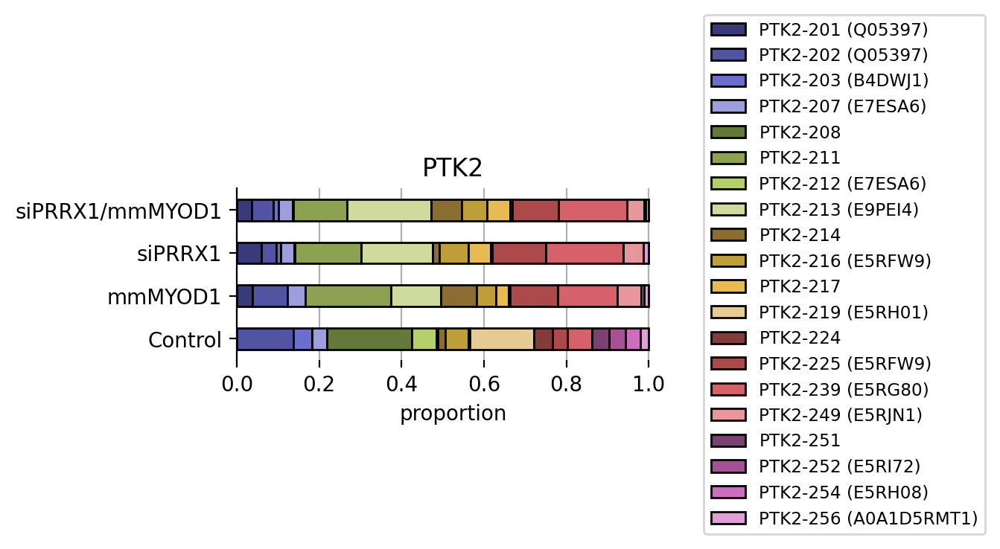

PYM1


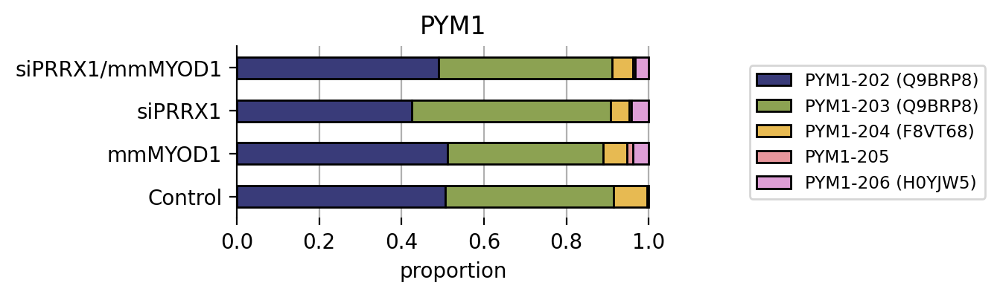

RAB42


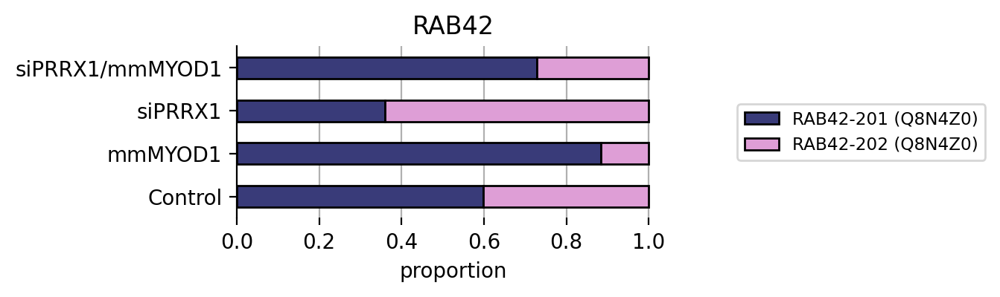

RBM5


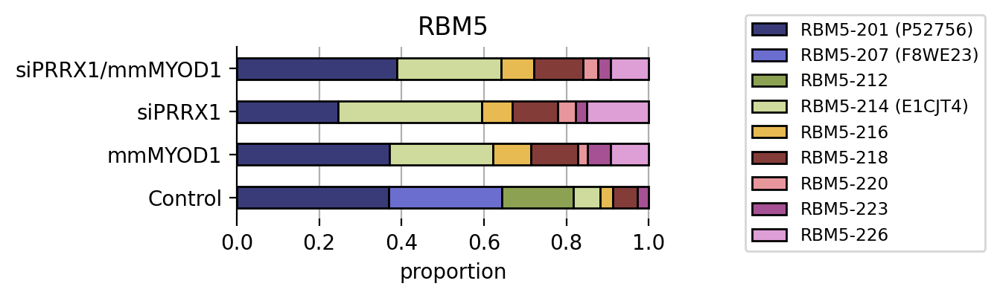

RC3H2


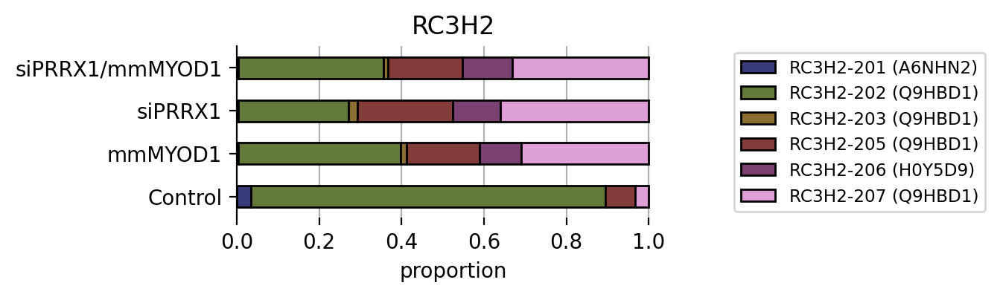

RFTN2


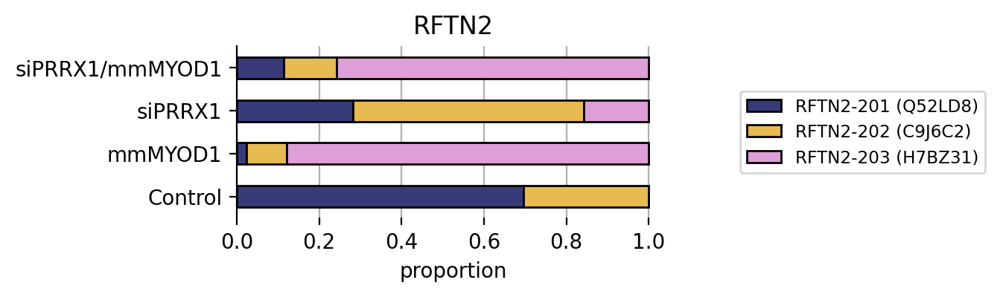

RFX1


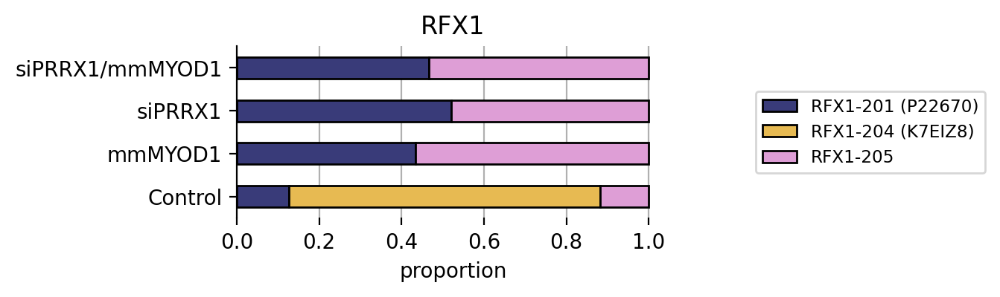

RRAGB


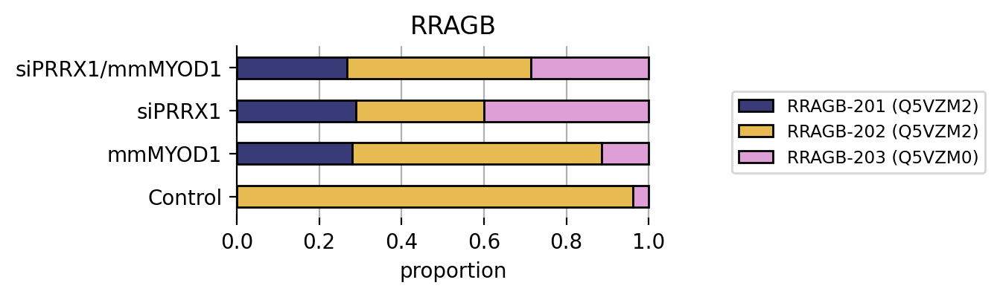

RSAD2


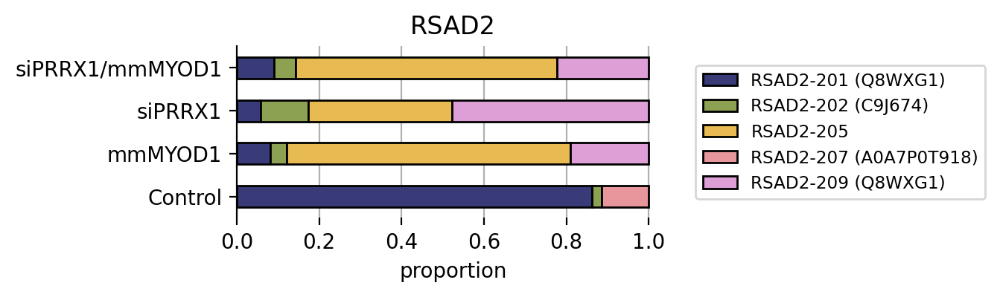

RWDD1


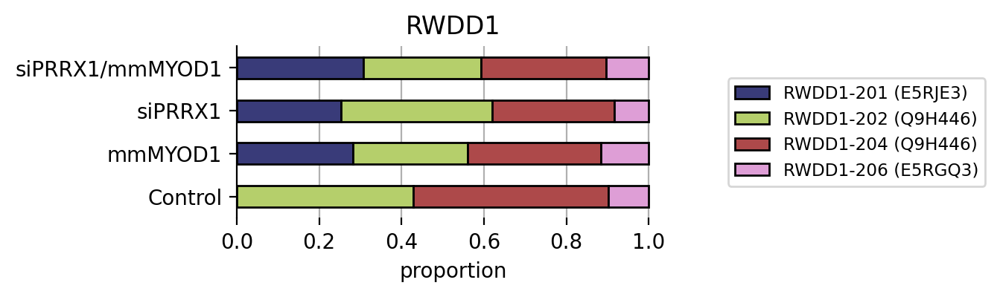

SALL1


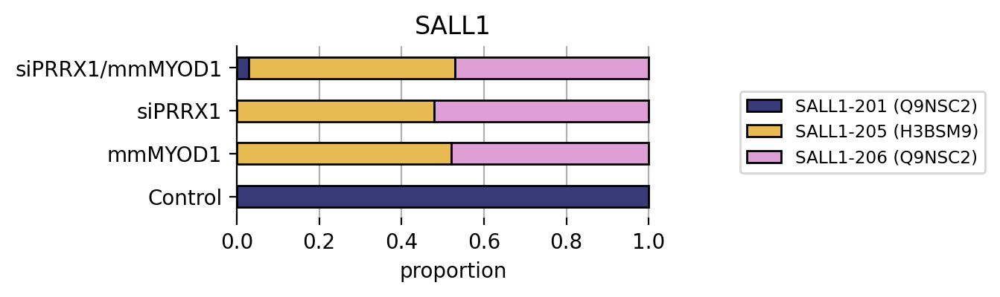

SDR39U1


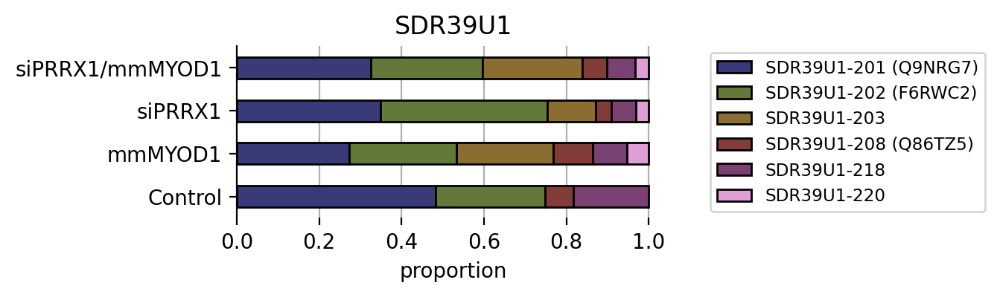

SDS


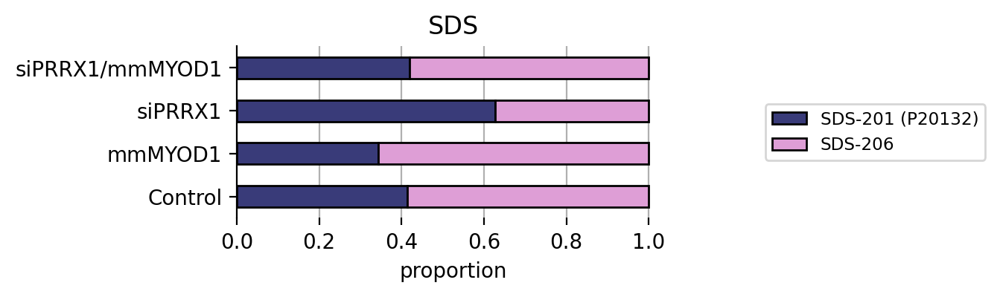

SERHL2


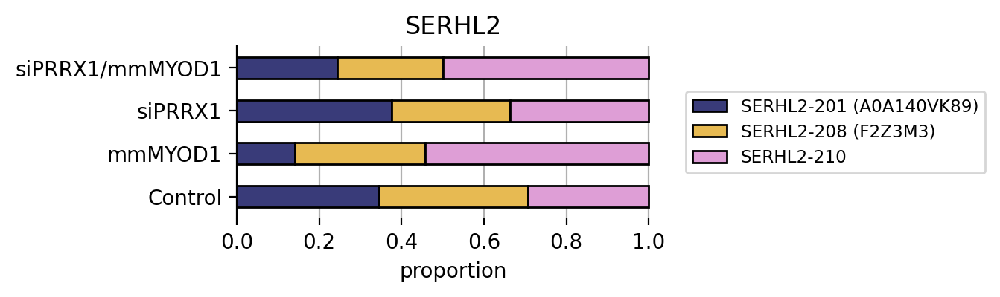

SFXN2


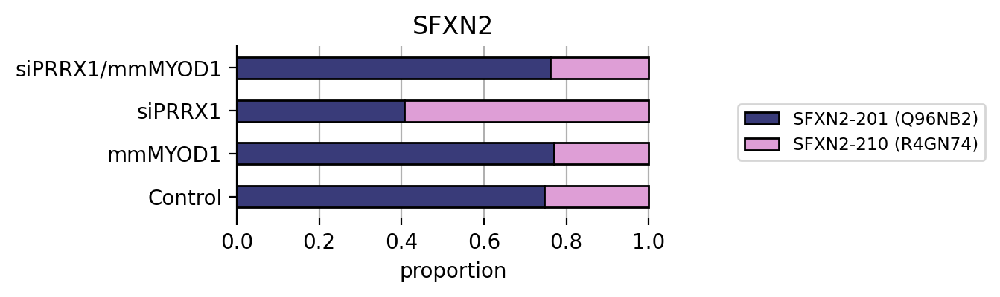

SH3BGR


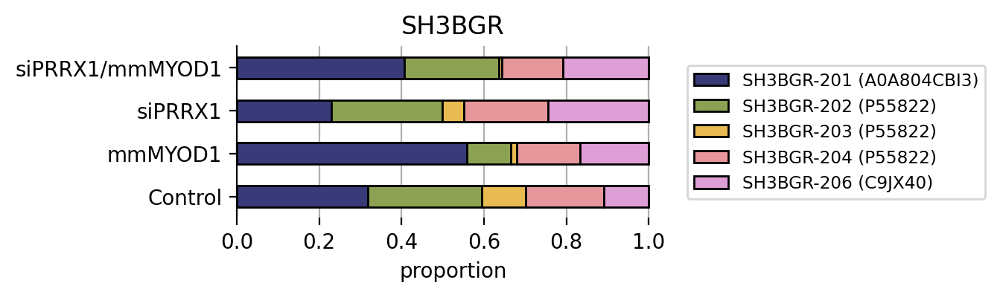

SLC7A8


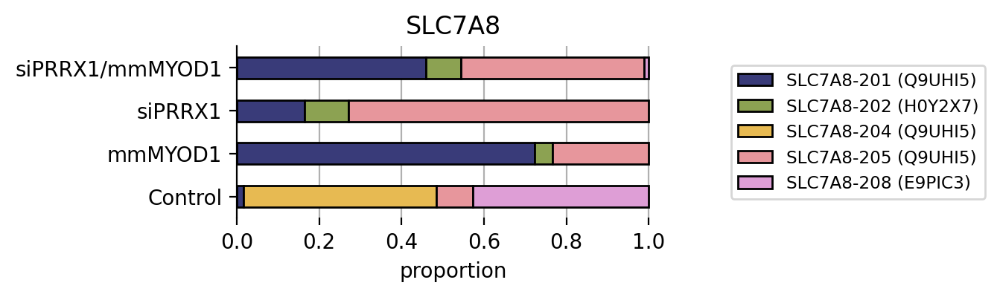

SLC25A25


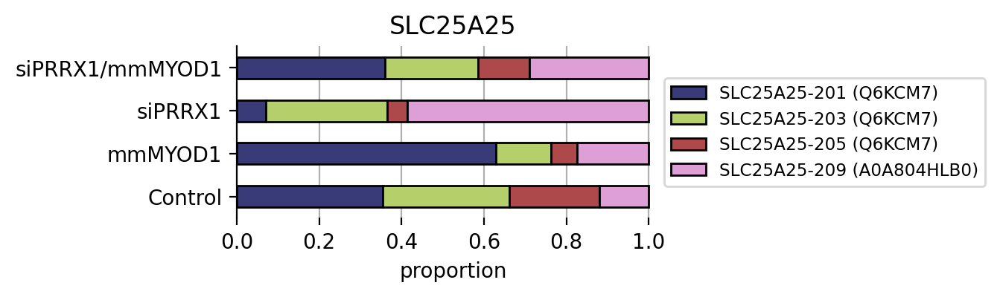

SLC38A7


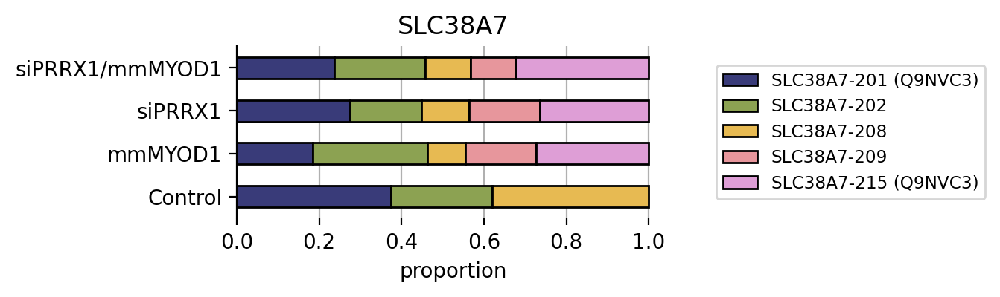

SMARCA2


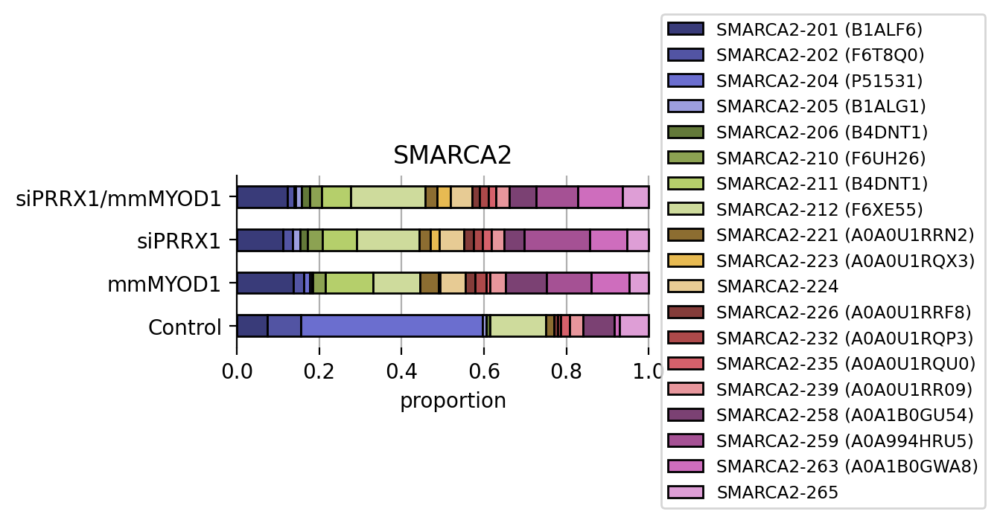

SOBP


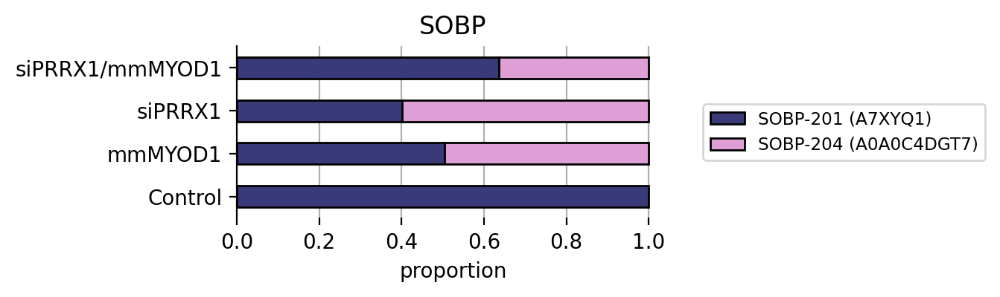

SP140


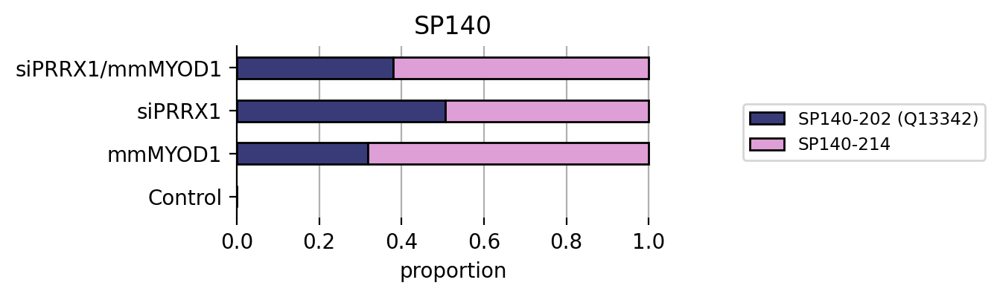

SPATS2L


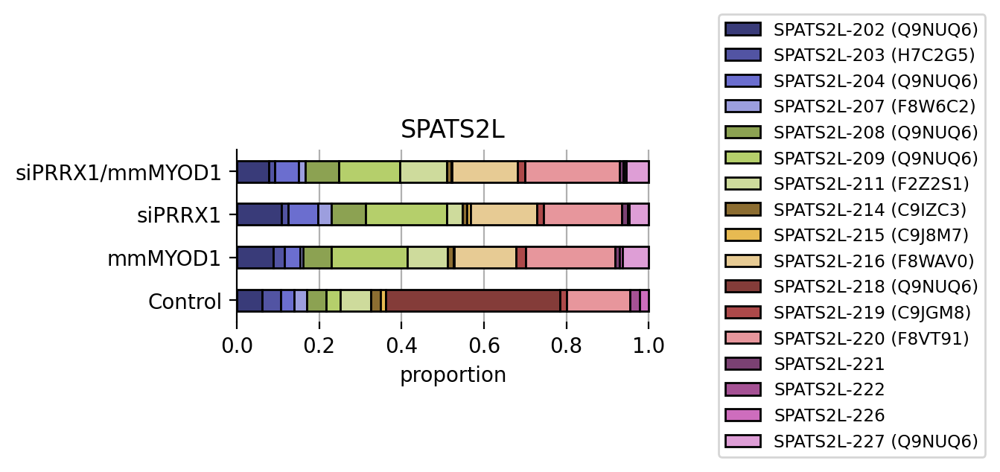

SPRED3


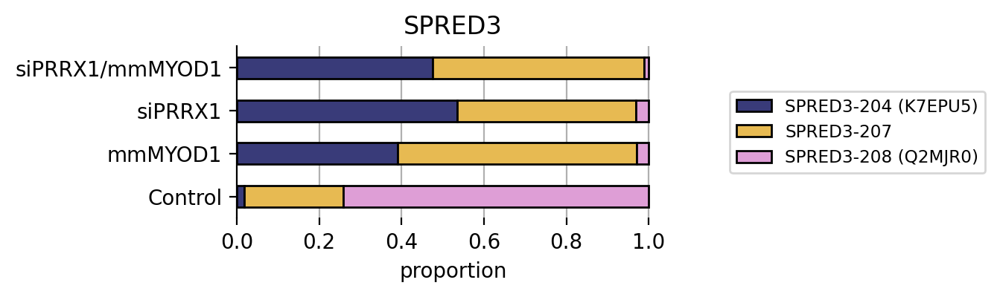

STEAP1B


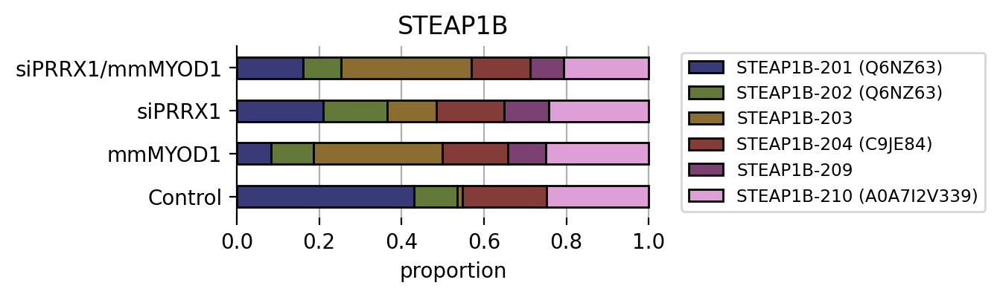

TAF15


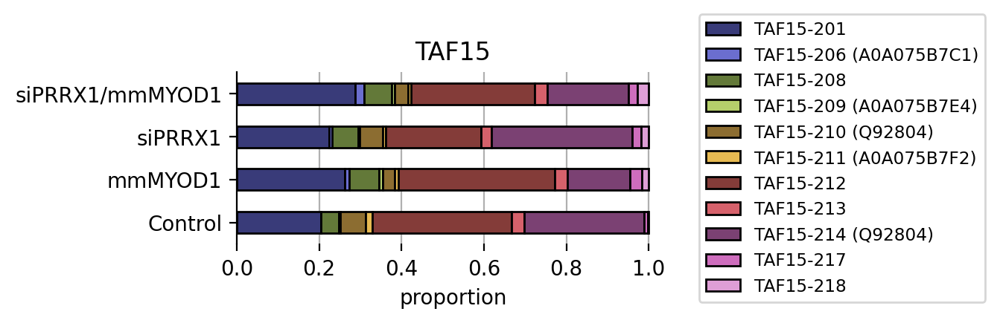

TBC1D10A


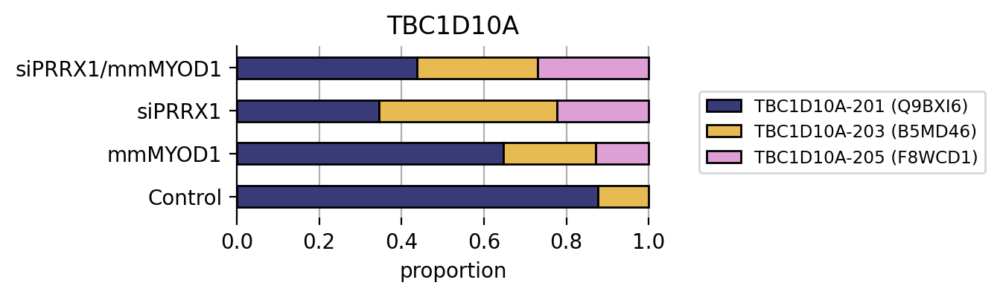

TCF25


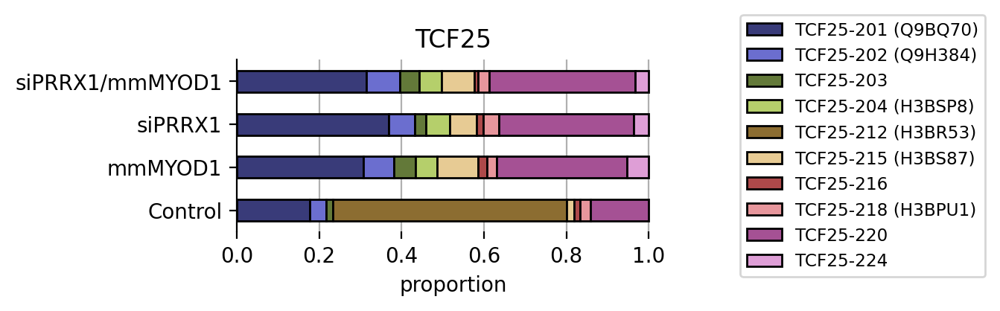

TCTN1


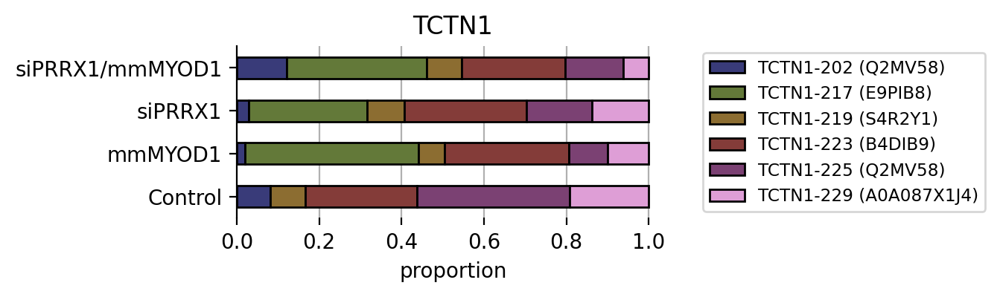

TDRD9


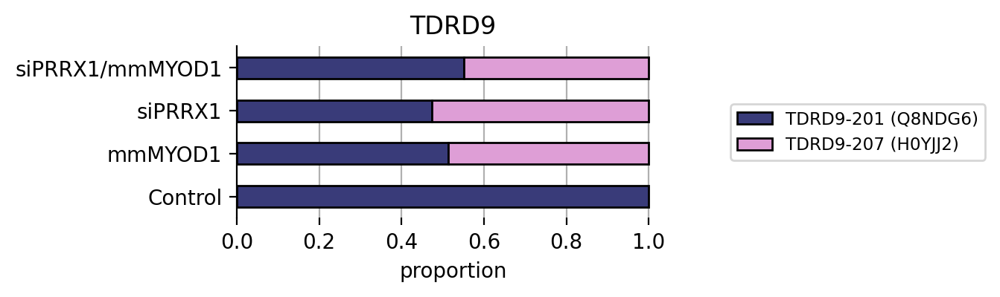

TIAL1


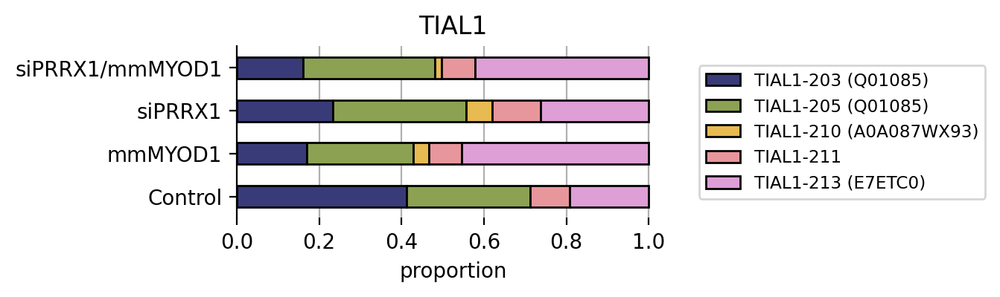

TIRAP


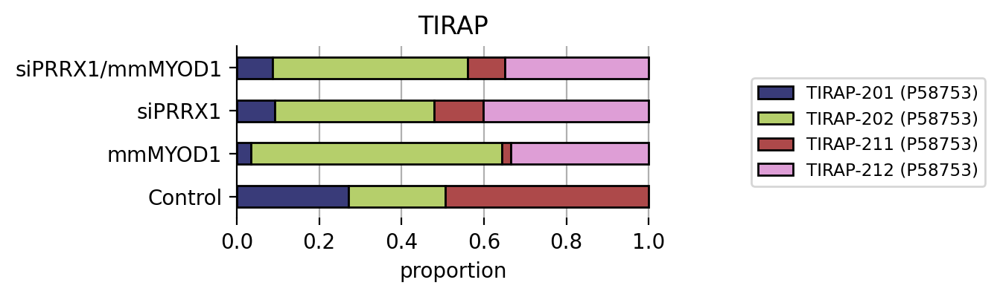

TMBIM4


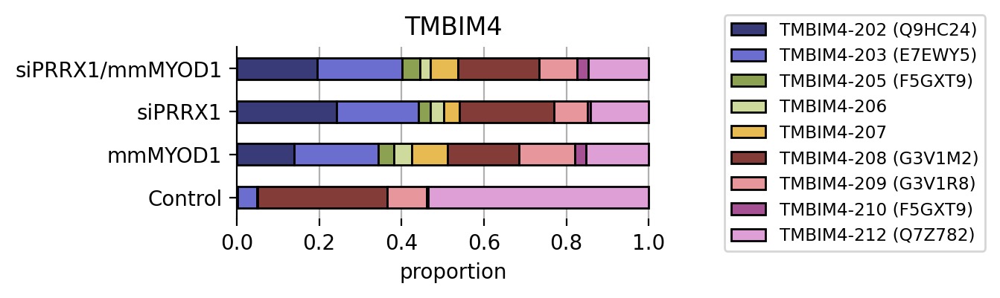

TMEM87A


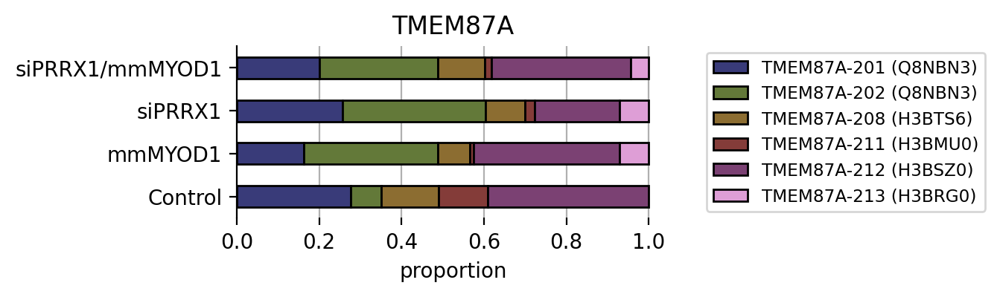

TMEM132B


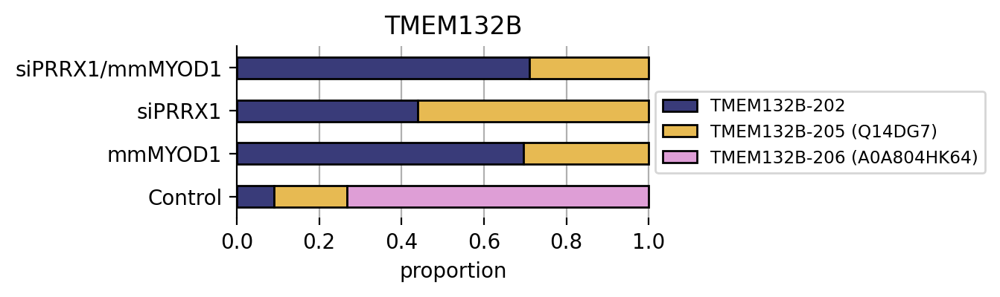

TPCN1


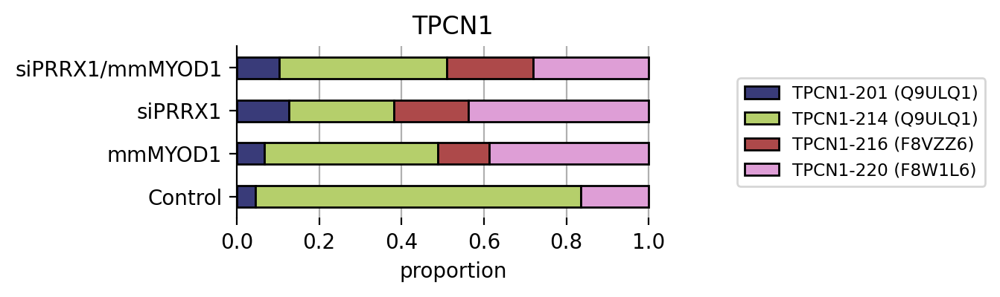

TRAPPC2L


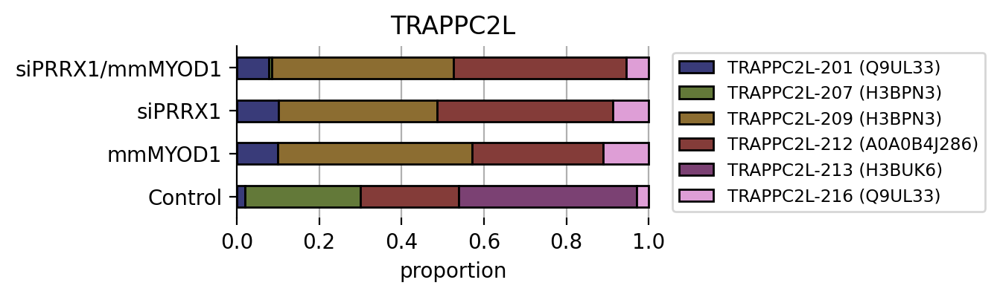

TRIM69


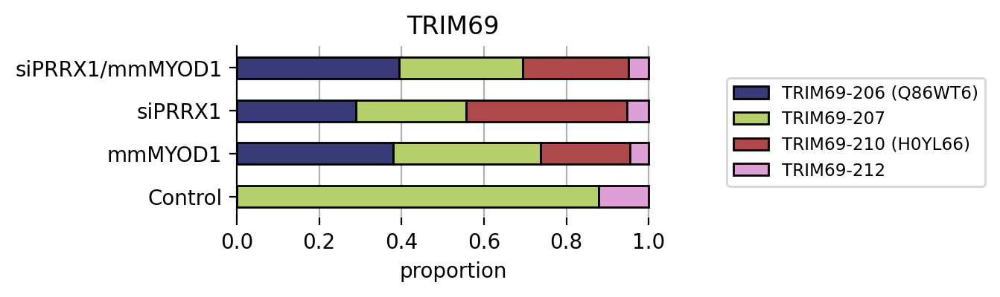

TWF1


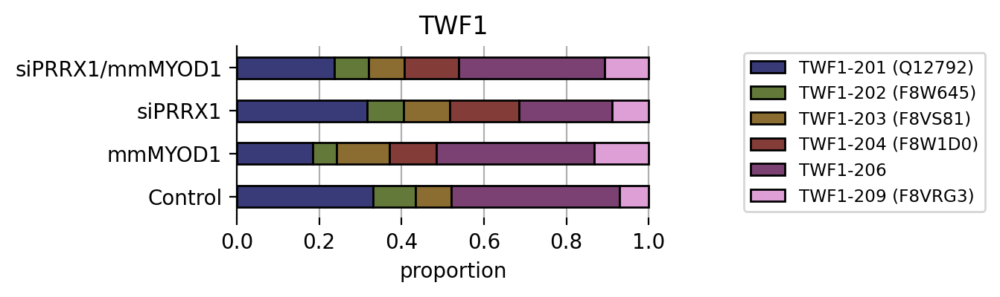

UBE3B


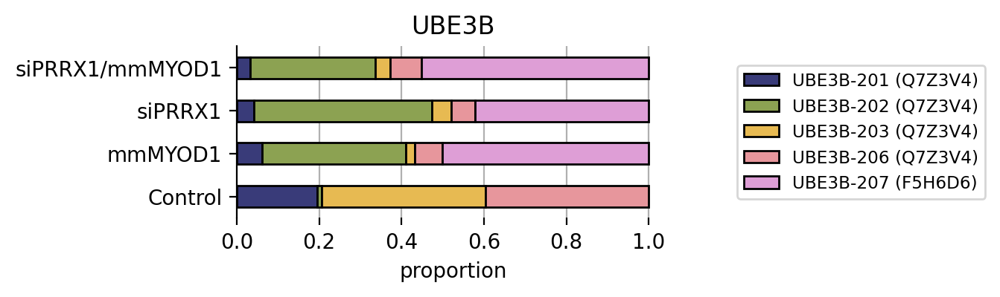

USP9X


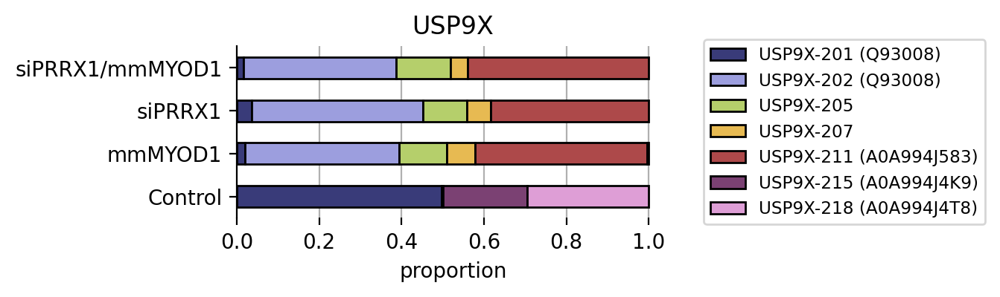

USP18


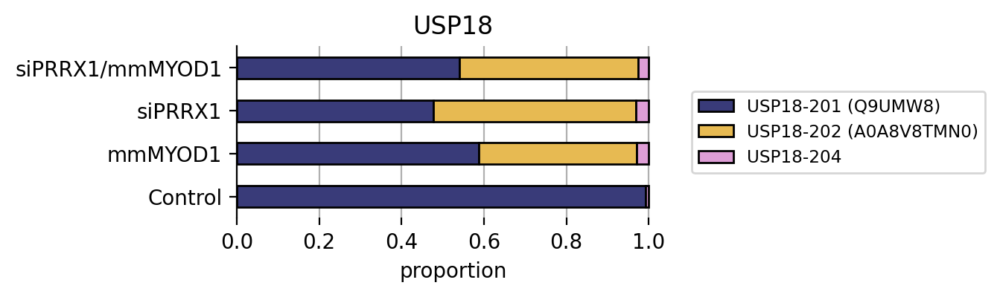

VAMP1


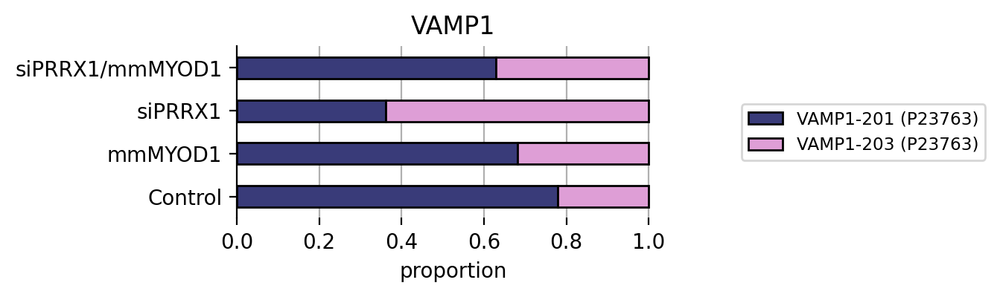

VWA8


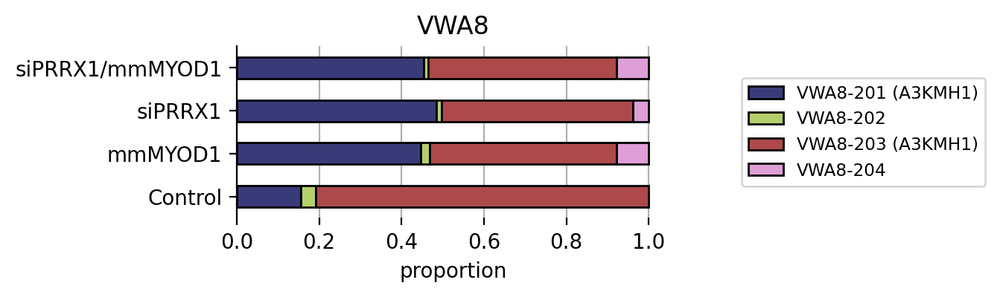

WDR35


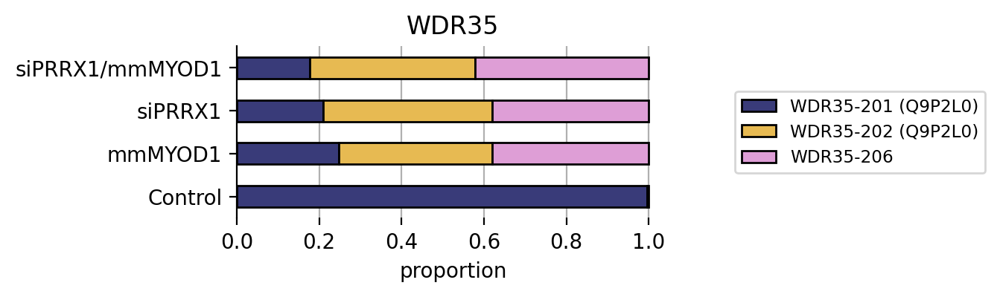

XPNPEP3


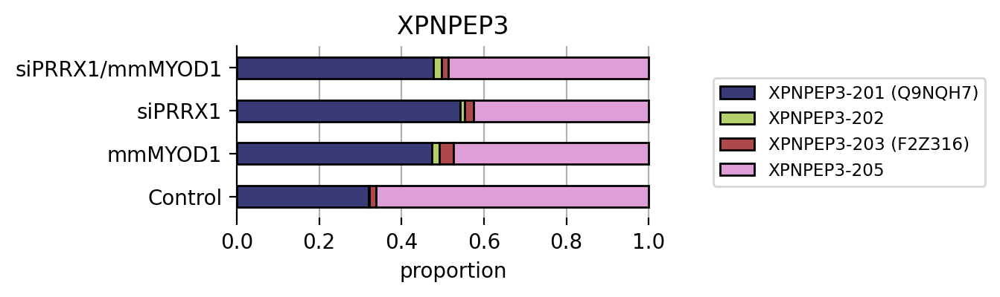

YAF2


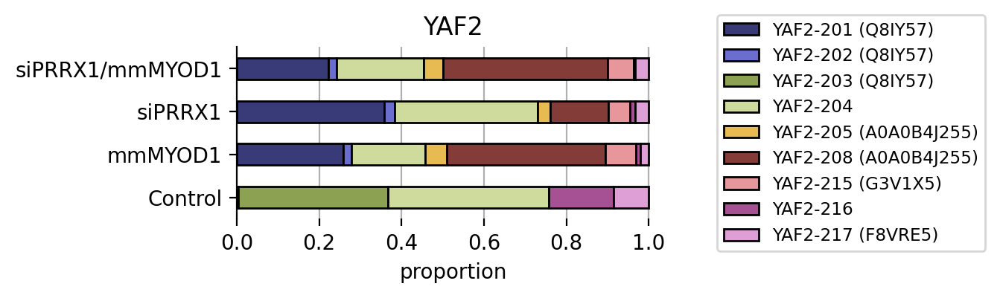

ZBTB8OS


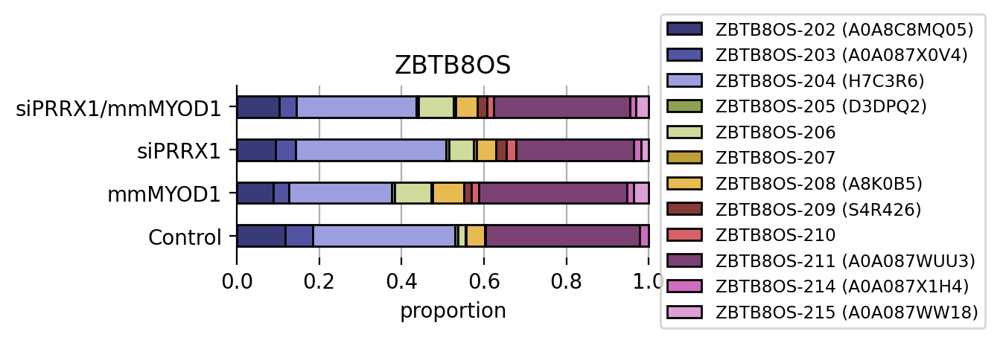

ZC3H11A


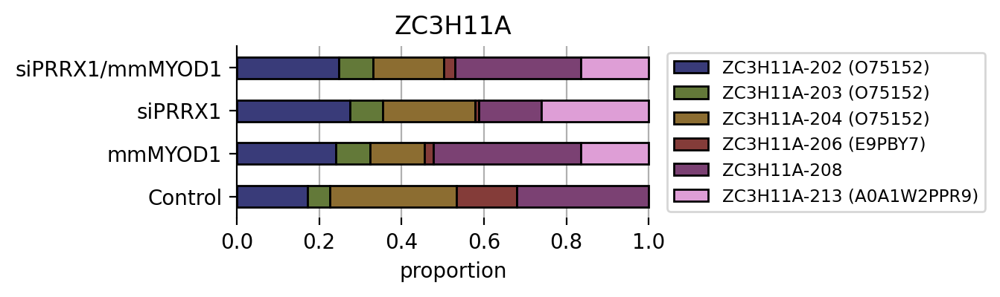

ZCWPW2


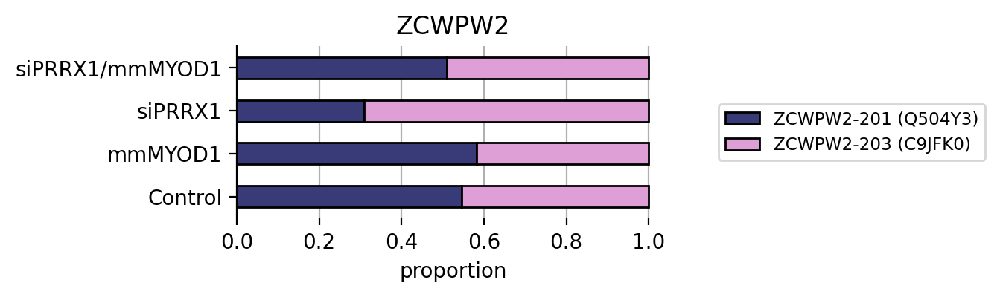

ZFYVE19


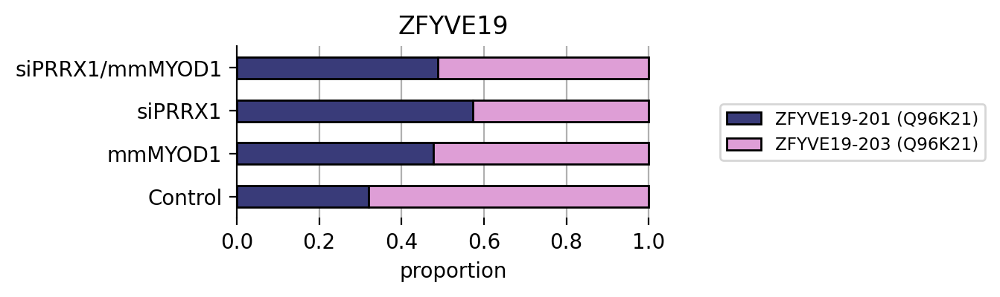

ZKSCAN1


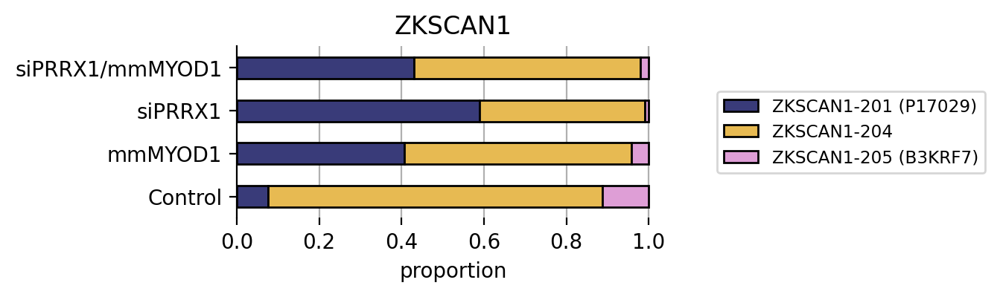

ZMYND8


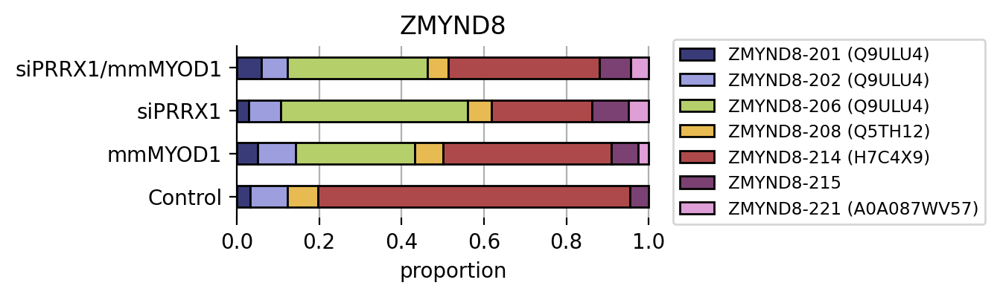

ZSCAN32


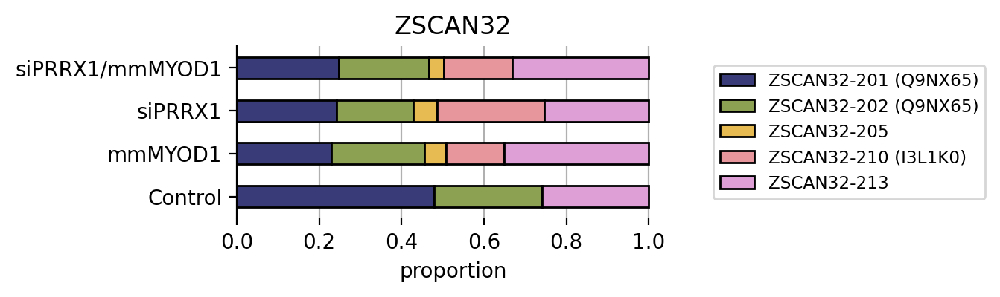

In [31]:
plot_df = pdf.copy()
print(plot_df.columns)
print()

annotation_cols = ['transcript_name', 'transcript_type', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE']


# results = results[results['group'] != 'Control']


counter = 0

for gene in tmp['gene_name'].values:
    print(gene)

    gene_df = plot_df[plot_df['gene_name'] == gene].reset_index()

    # Option 1: using np.where
    gene_df['annotation'] = (
        gene_df['transcript_name']
        + np.where(
            gene_df['uniprot'].notna(),
            ' (' + gene_df['uniprot'] + ')',
            ''
        )
    )
    
    tmp = gene_df.set_index('annotation').copy()
    tmp = tmp[['Control_pct', 'mmMYOD1_pct', 'siPRRX1_pct', 'siPRRX1/mmMYOD1_pct']]
    tmp.columns = [x.replace("_pct", "") for x in tmp.columns]

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 3.75, 1.5

    # 1) Plot figure without legend
    fig1, ax1 = plt.subplots()
    tmp.T.plot(
        kind='barh',
        stacked=True,
        ec='k',
        zorder=10,
        width=0.5,
        cmap='tab20b',
        ax=ax1
    )
    ax1.grid(axis='x', zorder=0)
    ax1.set_xlabel("proportion")
    sns.move_legend(
        ax1,
        loc='center right',
        title="",
        bbox_to_anchor=(1.75, 0.5),
        fontsize='small',
    )
    ax1.set_title(gene)
    sns.despine(bottom=True)
    plt.show()
    
    # # break
    # counter += 1
    # if counter >= 10:
    #     break
    


In [32]:
# adata.obsm["X_umap"] = adata.obs[["UMAP 1", "UMAP 2"]].to_numpy()

# adata.var.set_index('transcript_name', inplace=True)

layer_name= 'log_norm'

if sp.issparse(adata.layers[layer_name]):
    adata.layers[layer_name].data = adata.layers[layer_name].data.astype("float32")
else:
    adata.layers[layer_name] = adata.layers[layer_name].astype("float32")

adata

AnnData object with n_obs × n_vars = 16367 × 51242
    obs: 'dataset', 'n_reads', 'n_transcripts', 'UMAP 1', 'UMAP 2', 'cluster', 'pooled_condition'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB', 'n_counts', 'n_cells'
    uns: 'log1p'
    obsm: 'X_umap'
    layers: 'counts', 'log_norm'

In [40]:
adata.var['transcript_name'] = adata.var.index
adata.var.head()

,gene_id,gene_name,gene_type,transcript_type,Chromosome,Start,End,transcript_id,UniProtKB,n_counts,n_cells,transcript_name
transcript_name,,,,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,protein_coding,chr7,127588410,127591700,ENST00000000233,P84085,15182.0,9091,ARF5-201
M6PR-201,ENSG00000003056,M6PR,protein_coding,protein_coding,chr12,8940360,8949645,ENST00000000412,P20645,4602.0,3871,M6PR-201
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,protein_coding,chr11,64305523,64316743,ENST00000000442,P11474,225.0,220,ESRRA-201
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,protein_coding,chr12,2794969,2805423,ENST00000001008,Q02790,2906.0,2531,FKBP4-201
NDUFAF7-201,ENSG00000003509,NDUFAF7,protein_coding,protein_coding,chr2,37231657,37249160,ENST00000002125,Q7L592,490.0,478,NDUFAF7-201


In [41]:
def get_transcripts(query, adata=adata):

    df = adata.var[adata.var['gene_name'] == query].copy()

    columns = [
        'gene_name',
        'gene_type',
        'transcript_name',
        'transcript_type',
        'UniProtKB',
    ]

    df = df[columns]

    return df

gene_name      gene_type transcript_name transcript_type UniProtKB
     RARB protein_coding        RARB-201  protein_coding    P10826
     RARB protein_coding        RARB-205  protein_coding       NaN


ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not array([<cupyx.scipy.sparse._csr.csr_matrix object at 0x1533bc66ced0>],
      dtype=object)

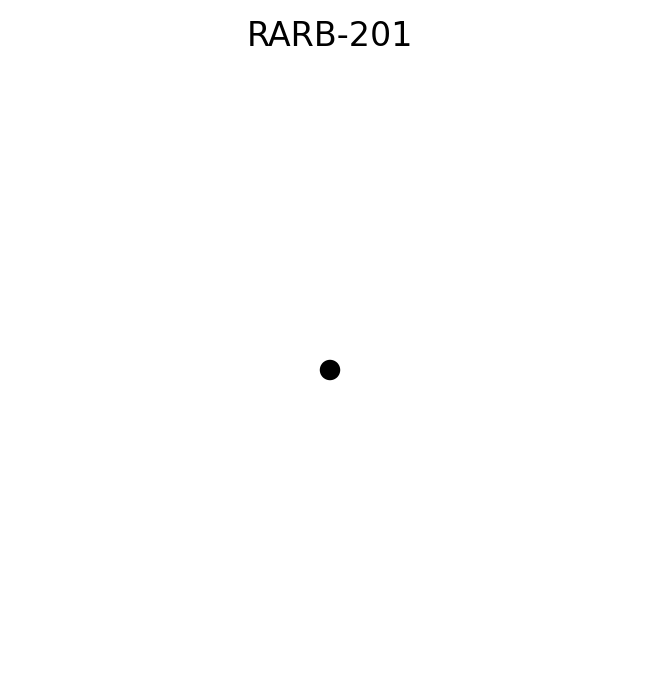

In [44]:
query = 'RARB'
label_df = get_transcripts(query)
print(label_df.to_string(index=False))

color = label_df.index.to_list()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=4,
    sort_order=True,
    color='RARB-201',
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='magma',
    colorbar_loc=None,
    frameon=False,
    layer='counts',
)

In [46]:
color = ['RARB-201', 'RARB-205']


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=3,
    sort_order=True,
    color=color,
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='magma',
    # colorbar_loc=None,
    frameon=False,
    # layer='log_norm',
)

AttributeError: 'list' object has no attribute 'to_list'

In [25]:
select = [
    'PICK1', 'RFX7', 'SALL1', 'SOX5', 'ZNF520', 
    'ZNF343', 'FOXP2', 'KLF4', 'SP140', 'RARB',
    'SOX6', 'TCF7L2', 'GPANK1', 'TIGD7', 'TRIM69',
    'FOSB', 'IKZF4', 'LHX9', 'NR1H3', 'TCF3', 'YWHAZ',
    'ZNF616', 'AEBP2', 'MIOS', 'NCOA2', 'NNT', 'PKM',
    'SMAD3', 'SMAD6', 'TRIB2', 'ZFP90', 'CNOT3', 'CPEB1',
    'EPAS1', 'ETV4', 'HDAC2', 'IRF1', 'MAPK1', 'MEF2C',
    'MZF1', 'NFIX', 'NR1H3', 'PRDM15', 'RUNX2', 'TP53',
    'TRIM28', 'ZNF232', 'ZNF358',
]

databases = [
    "GO_Biological_Process_2025",
    "Reactome_Pathways_2024",
    "KEGG_2021_Human",
    "WikiPathways_2024_Human",
    'MSigDB_Hallmark_2020',
    'BioPlanet_2019',
    'Panther_2016',
    'CellMarker_2024',
    'PanglaoDB_Augmented_2021',
]

# pd.set_option('display.max_colwidth', None)



n_terms = 5
alpha = 0.05

for database in databases:
    print(f"Running Enrichment with database: {database}...")

    
    enr = gget.enrichr(
        select,
        database=database,
        save=False,
    )

    
    display(enr[['path_name', 'overlapping_genes', 'adj_p_val']].head())
    print("------------------------------------------------------")

21:31:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


Running Enrichment with database: GO_Biological_Process_2025...


,path_name,overlapping_genes,adj_p_val
0,Regulation of Transcription by RNA Polymerase II (GO:0006357),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ETV4, FOXP2, ZFP90, RUNX2, PKM, AEBP2, RFX7, ZNF616, IRF1, RARB, FOSB, ZNF358, MZF1, TP53, LHX9]",3.089714e-19
1,Regulation of DNA-templated Transcription (GO:0006355),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, TRIM28, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, ETV4, FOXP2, ZFP90, RUNX2, AEBP2, RFX7, ZNF616, IRF1, FOSB, ZNF358, MZF1, TP53, LHX9]",1.007500e-17
2,Positive Regulation of DNA-templated Transcription (GO:0045893),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, ZFP90, RUNX2, SALL1, PKM, TRIM28, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
3,Positive Regulation of Transcription by RNA Polymerase II (GO:0045944),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, RUNX2, SALL1, PKM, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
4,Negative Regulation of DNA-templated Transcription (GO:0045892),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, FOXP2, IKZF4, RUNX2, SALL1, TRIM28, IRF1, RARB, FOSB, MZF1, TP53, LHX9]",7.510357e-11


21:31:29 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


------------------------------------------------------
Running Enrichment with database: Reactome_Pathways_2024...


,path_name,overlapping_genes,adj_p_val
0,Gene Expression (Transcription),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, AEBP2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",1.133972e-08
1,Generic Transcription Pathway,"[TCF7L2, HDAC2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",3.780295e-08
2,RNA Polymerase II Transcription,"[TCF7L2, HDAC2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",1.279507e-07
3,Developmental Biology,"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, KLF4, CPEB1, SALL1, CNOT3, RARB, MAPK1, TCF3, TP53, LHX9]",3.045769e-04
4,FOXO-mediated Transcription,"[HDAC2, SMAD3, KLF4, YWHAZ]",1.730420e-03


21:31:29 - INFO - Performing Enrichr analysis using database KEGG_2021_Human.


------------------------------------------------------
Running Enrichment with database: KEGG_2021_Human...


,path_name,overlapping_genes,adj_p_val
0,Transcriptional misregulation in cancer,"[HDAC2, MEF2C, TCF3, ETV4, TP53, RUNX2]",0.000927
1,Gastric cancer,"[TCF7L2, SMAD3, RARB, MAPK1, TP53]",0.001606
2,Chronic myeloid leukemia,"[HDAC2, SMAD3, MAPK1, TP53]",0.001606
3,Colorectal cancer,"[TCF7L2, SMAD3, MAPK1, TP53]",0.001959
4,Thyroid cancer,"[TCF7L2, MAPK1, TP53]",0.002779


21:31:30 - INFO - Performing Enrichr analysis using database WikiPathways_2024_Human.


------------------------------------------------------
Running Enrichment with database: WikiPathways_2024_Human...


,path_name,overlapping_genes,adj_p_val
0,TGF Beta Signaling Pathway WP366,"[MEF2C, SMAD3, FOSB, MAPK1, TP53, RUNX2]",0.000201
1,Mesodermal Commitment Pathway WP2857,"[SMAD3, AEBP2, TRIM28, RARB, KLF4, SMAD6]",0.000201
2,Osteoarthritic Chondrocyte Hypertrophy WP5373,"[EPAS1, FOSB, MAPK1, RUNX2]",0.000629
3,TGF Beta In Thyroid Cells For Epithelial Mesenchymal Transition WP3859,"[SMAD3, MAPK1, RUNX2]",0.000629
4,Cell Differentiation Expanded Index WP2023,"[MEF2C, KLF4, RUNX2]",0.000629


21:31:30 - INFO - Performing Enrichr analysis using database MSigDB_Hallmark_2020.


------------------------------------------------------
Running Enrichment with database: MSigDB_Hallmark_2020...


,path_name,overlapping_genes,adj_p_val
0,TNF-alpha Signaling via NF-kB,"[SMAD3, IRF1, FOSB, KLF4]",0.037480
1,Wnt-beta Catenin Signaling,"[HDAC2, TP53]",0.063951
2,TGF-beta Signaling,"[SMAD3, SMAD6]",0.069575
3,KRAS Signaling Up,"[KLF4, TRIB2, ETV4]",0.085730
4,UV Response Dn,"[SMAD3, MIOS]",0.194200


21:31:30 - INFO - Performing Enrichr analysis using database BioPlanet_2019.


------------------------------------------------------
Running Enrichment with database: BioPlanet_2019...


,path_name,overlapping_genes,adj_p_val
0,SMAD2/3 nuclear pathway,"[NCOA2, HDAC2, MEF2C, SMAD3, TCF3, RUNX2]",0.000018
1,Generic transcription pathway,"[NCOA2, SMAD3, TRIM28, ZNF616, RARB, NR1H3, ZFP90, RUNX2, ZNF343]",0.000039
2,TGF-beta signaling pathway,"[MEF2C, SMAD3, FOSB, MAPK1, SMAD6, TP53, RUNX2]",0.000039
3,Nuclear beta-catenin signaling and target gene transcription regulation,"[TCF7L2, NCOA2, HDAC2, KLF4, YWHAZ]",0.000129
4,Regular glucocorticoid receptor pathway,"[NCOA2, HDAC2, IRF1, MAPK1, TP53]",0.000129


21:31:30 - INFO - Performing Enrichr analysis using database Panther_2016.


------------------------------------------------------
Running Enrichment with database: Panther_2016...


,path_name,overlapping_genes,adj_p_val
0,TGF-beta signaling pathway Homo sapiens P00052,"[SMAD3, MAPK1, SMAD6]",0.040716
1,Parkinson disease Homo sapiens P00049,"[MAPK1, YWHAZ]",0.119730
2,P53 pathway feedback loops 1 Homo sapiens P04392,[TP53],0.119730
3,Pyruvate metabolism Homo sapiens P02772,[PKM],0.119730
4,FGF signaling pathway Homo sapiens P00021,"[MAPK1, YWHAZ]",0.119730


21:31:31 - INFO - Performing Enrichr analysis using database CellMarker_2024.


------------------------------------------------------
Running Enrichment with database: CellMarker_2024...


,path_name,overlapping_genes,adj_p_val
0,Embryonic Stem Cell Undefined Human,"[TRIM28, CNOT3, TCF3, KLF4]",0.000831
1,B Cell Lymph Human,"[RFX7, TCF3, TP53]",0.001774
2,Chondrocyte Bone Mouse,"[SOX6, SOX5]",0.001774
3,Chondrogenic Cell Adipose Tissue Mouse,"[SOX6, SOX5]",0.001774
4,Deep Layer Neuron Cortex Human,"[FOXP2, SOX5]",0.001774


21:31:31 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021.


------------------------------------------------------
Running Enrichment with database: PanglaoDB_Augmented_2021...


,path_name,overlapping_genes,adj_p_val
0,Embryonic Stem Cells,"[SMAD3, TRIM28, KLF4]",0.354657
1,Chondrocytes,"[SOX6, RUNX2]",0.354657
2,Mesangial Cells,"[NCOA2, MEF2C]",0.354657
3,Endothelial Cells (Aorta),"[EPAS1, SMAD6]",0.354657
4,Adipocytes,"[EPAS1, NR1H3]",0.354657


------------------------------------------------------


In [26]:
# enr = gget.enrichr(
#     select,
#     database=database,
#     save=False,
# )

enr = gget.enrichr(select, "GO_Biological_Process_2025", save=False)

display(enr[['path_name', 'overlapping_genes', 'adj_p_val']].head(15))


21:36:25 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


,path_name,overlapping_genes,adj_p_val
0,Regulation of Transcription by RNA Polymerase II (GO:0006357),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ETV4, FOXP2, ZFP90, RUNX2, PKM, AEBP2, RFX7, ZNF616, IRF1, RARB, FOSB, ZNF358, MZF1, TP53, LHX9]",3.089714e-19
1,Regulation of DNA-templated Transcription (GO:0006355),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, TRIM28, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, ETV4, FOXP2, ZFP90, RUNX2, AEBP2, RFX7, ZNF616, IRF1, FOSB, ZNF358, MZF1, TP53, LHX9]",1.007500e-17
2,Positive Regulation of DNA-templated Transcription (GO:0045893),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, ZFP90, RUNX2, SALL1, PKM, TRIM28, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
3,Positive Regulation of Transcription by RNA Polymerase II (GO:0045944),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, RUNX2, SALL1, PKM, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
4,Negative Regulation of DNA-templated Transcription (GO:0045892),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, FOXP2, IKZF4, RUNX2, SALL1, TRIM28, IRF1, RARB, FOSB, MZF1, TP53, LHX9]",7.510357e-11
5,Positive Regulation of RNA Biosynthetic Process (GO:1902680),"[TCF7L2, HDAC2, MEF2C, SALL1, SMAD3, TRIM28, IRF1, NR1H3, KLF4, TP53, ZFP90, RUNX2]",6.238178e-07
6,Negative Regulation of RNA Biosynthetic Process (GO:1902679),"[TCF7L2, HDAC2, SALL1, TRIM28, IRF1, KLF4, TP53, FOXP2, IKZF4, LHX9, RUNX2]",1.012499e-06
7,Negative Regulation of Transcription by RNA Polymerase II (GO:0000122),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, SALL1, RARB, FOSB, MZF1, TP53]",1.012499e-06
8,Positive Regulation of Multicellular Organismal Process (GO:0051240),"[TCF7L2, NCOA2, HDAC2, SMAD3, EPAS1, CNOT3, SOX6, ETV4, SOX5]",3.647552e-05
9,Chondrocyte Differentiation (GO:0002062),"[MEF2C, SOX6, RUNX2, SOX5]",7.204749e-05
